In [1]:
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.metrics.pairwise import cosine_distances
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import SpectralEmbedding
from pytorch_model_summary import summary
from sklearn.decomposition import PCA
from scipy.sparse.linalg import eigsh
from matplotlib import pyplot as plt
from sklearn.manifold import TSNE
from scipy.special import iv
from typing import Optional
from matplotlib import cm
import scipy.sparse as sp
import networkx as nx  # pakage for handling a graph
import os.path as osp
from tqdm import tqdm
from scipy import io
import pandas as pd
import numpy as np
import cupy as cp
import easydict
import natsort
import random
import copy
import time
import math
import sys
import os

from torch.distributions.categorical import Categorical
from torch.utils.data import random_split
import torch.nn.functional as F
from torch.optim import Adam
import torch.nn as nn
import torch


from torch_geometric.utils import sort_edge_index, degree, add_remaining_self_loops, remove_self_loops, get_laplacian, \
    to_undirected, to_dense_adj, to_networkx
from torch_geometric.nn import GCNConv, SGConv, SAGEConv, GATConv, GraphConv, GINConv
from torch_geometric.transforms import LaplacianLambdaMax
from torch_geometric.utils import degree, to_undirected
from torch_geometric.data import Data, DataLoader
from torch_geometric.nn import ChebConv, GCNConv
from torch_geometric.datasets import KarateClub


from torch_scatter import scatter
import torch_sparse

# utils

In [64]:
def get_seed_args():
    args = easydict.EasyDict({
        # arguments for setting device
        'bus_id' : 'PCI_BUS_ID',
        'cuda_id' : ['0','1','2'],
        
        # arguments for path
        'os_path' : '/home/user/users/dhkim/eer/SSLGCN',
        'seed_data_dir_path' : 'dataset/seed/SEED_EEG/ExtractedFeatures/data/',
        'feature_name1' : 'de_LDS',
        'feature_name2' : 'psd_LDS',
        'seed_label_dir_path' : 'dataset/seed/SEED_EEG/ExtractedFeatures/label/',
        'figure_save_path' : 'store_seed/figure/',
        'tensor_save_path' : 'store_seed/tensor/',
        'model_save_path' : 'store_seed/model/',
        
        # arguments for counts
        'n_subjects' : 15,
        'n_sessions' : 3,
        'n_trials' : 15,
        'n_nodes' : 62,
        'n_features' : 5,
        'n_samples' : 10182,
        'n_labels_by_trials1' : 4,
        'n_labels_by_trials2' : 6,
        'n_labels_by_trials3' : 8,

        # arguments for running algorithm
        'seed' : 2023,
        'EEG_band' : None,
        'pca_components1' : 9,
        'pca_components2' : 6,
        'essm_lambda' : 0.9,
        'de_k' : 3394, #721
        'psd_k' : 3394, #1861
        'k1' : 30,
        'k2' : 130,
        't1' : 1,
        't2' : 1,
        'feature_dimension' : 620,
        'gcn_hid_channels' : 256,
        'gcn_out_channels' : 128,
        'out_channels' : 3,
        'learning_rate' : 0.005,
        'l2_lambda' : 0.001,
        'epochs' : 3000,
        'proj_hid_channels' : 32,
        'ptau' : 32,
        'pf1' : 0.1,
        'pf2' : 0.1,
        'pe1' : 0.1,
        'pe2' : 0.1,
        'tpf1' : 0.7,
        'tpf2' : 0.7,
        'tpe1' : 0.7,
        'tpe2' : 0.7,
        'loss_lambda' : 0.01,
        'patience' : 10,
        'val_split' : 0.2
    })
    
    return args


def get_seedIV_args():
    args = easydict.EasyDict({
        # arguments for setting device
        'bus_id' : 'PCI_BUS_ID',
        'cuda_id' : ['0','1','2'],
        
        # arguments for path
        'os_path' : '/home/user/users/dhkim/eer/SSLGCN',
        'feature_name1' : 'de_LDS',
        'feature_name2' : 'psd_LDS',
        'seedIV_data_dir_path' : 'dataset/seed_IV/eeg_feature_smooth/',
        'figure_save_path' : 'store_seedIV/figure/',
        'tensor_save_path' : 'store_seedIV/tensor/',
        'model_save_path' : 'store_seedIV/model/',
        
        # arguments for counts
        'n_subjects' : 15,
        'n_sessions' : 3,
        'n_trials' : 24,
        'n_nodes' : 62,
        'n_features' : 5,
        'n_samples' : 2505,
        'n_labels_by_class1' : 15,
        'n_labels_by_class2' : 20,
        'n_labels_by_class3' : 25,

        # arguments for running algorithm
        'seed' : 2023,
        'EEG_band' : None,
        'pca_components1' : 9,
        'pca_components2' : 6,
        'essm_lambda' : 0.9,
        'de_k' : 626,
        'psd_k' : 626,
        'k1' : 30,
        'k2' : 130,
        't1' : 1,
        't2' : 1,
        'feature_dimension' : 620,
        'gcn_hid_channels' : 256,
        'gcn_out_channels' : 64,
        'out_channels' : 4,
        'learning_rate' : 0.005,
        'l2_lambda' : 0.001,
        'epochs' : 3000,
        'proj_hid_channels' : 16,
        'ptau' : 0.7,
        'pf1' : 0.1,
        'pf2' : 0.2,
        'pe1' : 0.1,
        'pe2' : 0.2,
        'tpf1' : 0.7,
        'tpf2' : 0.7,
        'tpe1' : 0.7,
        'tpe2' : 0.7,
        'loss_lambda' : 0.01,
        'patience' : 10,
        'val_split' : 0.2
    })
    return args


def get_deap_args():
    args = easydict.EasyDict({
        # arguments for setting device
        'bus_id' : 'PCI_BUS_ID',
        'cuda_id' : ['0','1','2'],
        
        # arguments for path
        'os_path' : '/home/neuroai/users/dhkim/eer/SSLGCN',
        'feature_name1' : 'PSD_LDS_data',
        'feature_name2' : 'DE_LDS_data',
        'deap_label_dir_path' : 'dataset/deap/data_preprocessed_matlab/',
        'deap_data_dir_path' : 'dataset/deap/extractedfeatures/de_psd_lds/',
        'figure_save_path' : 'store_deap/figure/',
        'tensor_save_path' : 'store_deap/tensor/',
        'model_save_path' : 'store_deap/model/',
        'valence' : 'Valence',
        'arousal' : 'Arousal',

        
        # arguments for counts
        'n_subjects' : 32,
        'n_trials' : 40,
        'n_nodes' : 32,
        'n_features' : 4,
        'n_samples' : 2520,
        'n_labels_by_class' : 60,
        'n_labels' : 2,

        # arguments for running algorithm
        'seed' : 2023,
        'EEG_band' : None,
        'pca_components1' : 9,
        'pca_components2' : 6,
        'essm_lambda' : 0.9,
        'de_k' : 1200,
        'psd_k' : 1200,
        'k1' : 30,
        'k2' : 130,
        't1' : 1,
        't2' : 1,
        'feature_dimension' : 256,
        'gcn_hid_channels' : 128,
        'gcn_out_channels' : 64,
        'out_channels' : 2,
        'learning_rate' : 0.005,
        'l2_lambda' : 0.001,
        'epochs' : 3000,
        'proj_hid_channels' : 16,
        'ptau' : 0.7,
        'pf1' : 0.1,
        'pf2' : 0.2,
        'pe1' : 0.1,
        'pe2' : 0.2,
        'tpf1' : 0.7,
        'tpf2' : 0.7,
        'tpe1' : 0.7,
        'tpe2' : 0.7,
        'loss_lambda' : 0.01,
        'patience' : 10,
        'val_split' : 0.2
    })
    
    return args

def setting_os_path(path):
    if os.getcwd() != path:
        os.chdir(path)
    return

def get_device(bus_id, cuda_id):
    os.environ["CUDA_DEVICE_ORDER"]= bus_id  # Arrange GPU devices starting from 0
    os.environ["CUDA_VISIBLE_DEVICES"]= cuda_id  # Set the GPU 2 to use
    cp.cuda.Device(cuda_id).use()
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    print('Device:', device)
    print('Current cuda device:', torch.cuda.current_device())
    print('Count of using GPUs:', torch.cuda.device_count())
    
    return device

def fix_random_variables(seed):
    random.seed(seed)
    np.random.seed(seed)
    cp.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)  # type: ignore
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True  # type: ignore
    torch.backends.cudnn.benchmark = False  # type: ignore
    
    return    

def model_summary(model, fake_input,device):
    print(summary(model, fake_input.to(device), max_depth=True, show_parent_layers=True))
    print(model)
    return

def get_graph_data(features, edge_weights, labels):
    adj = normalize_adj(edge_weights)
    adj = (adj - adj.min()) / (adj.max()-adj.min())
    adj = torch.from_numpy(adj).to(torch.float64)
    features = features[0]
    features = torch.from_numpy(features).to(torch.float64)
    sparse_graph = adj.to_sparse()
    
    labels = torch.from_numpy(labels).to(torch.long)
    data = Data(x=features, edge_index = sparse_graph._indices().to(torch.long), edge_attr =sparse_graph._values(), y=labels)
    return data

def get_base_model(name: str):
    def gat_wrapper(in_channels, out_channels):
        return GATConv(
            in_channels=in_channels,
            out_channels=out_channels // 4,
            heads=4
        )

    def gin_wrapper(in_channels, out_channels):
        mlp = nn.Sequential(
            nn.Linear(in_channels, 2 * out_channels),
            nn.ELU(),
            nn.Linear(2 * out_channels, out_channels)
        )
        return GINConv(mlp)

    base_models = {
        'GCNConv': GCNConv,
        'SGConv': SGConv,
        'SAGEConv': SAGEConv,
        'GATConv': gat_wrapper,
        'GraphConv': GraphConv,
        'GINConv': gin_wrapper
    }

    return base_models[name]


def get_activation(name: str):
    activations = {
        'relu': F.relu,
        'hardtanh': F.hardtanh,
        'elu': F.elu,
        'leakyrelu': F.leaky_relu,
        'prelu': torch.nn.PReLU(),
        'rrelu': F.rrelu,
        'celu' : torch.nn.CELU(),
        'selu' : torch.nn.SELU(),
        'gelu' : torch.nn.GELU()
    }

    return activations[name]


def compute_pr(edge_index, damp: float = 0.85, k: int = 10):
    num_nodes = edge_index.max().item() + 1
    deg_out = degree(edge_index[0])
    x = torch.ones((num_nodes, )).to(edge_index.device).to(torch.float64)

    for i in range(k):
        edge_msg = x[edge_index[0]] / deg_out[edge_index[0]]
        agg_msg = scatter(edge_msg, edge_index[1], reduce='sum')

        x = (1 - damp) * x + damp * agg_msg

    return x


def eigenvector_centrality(data):
    graph = to_networkx(data)
    x = nx.eigenvector_centrality_numpy(graph)
    x = [x[i] for i in range(data.num_nodes)]
    return torch.tensor(x, dtype=torch.float64).to(data.edge_index.device)


def generate_split(num_samples: int, train_ratio: float, val_ratio: float):
    train_len = int(num_samples * train_ratio)
    val_len = int(num_samples * val_ratio)
    test_len = num_samples - train_len - val_len

    train_set, test_set, val_set = random_split(torch.arange(0, num_samples), (train_len, test_len, val_len))

    idx_train, idx_test, idx_val = train_set.indices, test_set.indices, val_set.indices
    train_mask = torch.zeros((num_samples,)).to(torch.bool)
    test_mask = torch.zeros((num_samples,)).to(torch.bool)
    val_mask = torch.zeros((num_samples,)).to(torch.bool)

    train_mask[idx_train] = True
    test_mask[idx_test] = True
    val_mask[idx_val] = True

    return train_mask, test_mask, val_mask


# data

In [3]:
   
def load_deap_data(data_dir_path : str, fname1 : str, fname2 : str, label_dir_path : str, n_columns = 2):
    print("*********** Load features and labels ************")
    
    subject_feature_list1  = np.array([], dtype = float)
    subject_feature_list2  = np.array([], dtype = float)
    subject_label_list = np.array([], dtype = float)
    subject_sample_counts  = np.array([], dtype = int)
    
    feature_dir_list = os.listdir(data_dir_path)

    for feature_idx, feature_dir in enumerate(feature_dir_list):
        feature_data_dir_path = data_dir_path + feature_dir +'/'
        file_list = os.listdir(feature_data_dir_path)
        
        feature_list = np.array([], dtype = float)
        if feature_idx == 0:
            feature_name = fname1
        else:
            feature_name = fname2
        
        for f_idx, file in enumerate(file_list):
            
            data = io.loadmat(feature_data_dir_path + file)
            np_data = data[feature_name]
            
            swap_data = np_data.transpose(1,2,3,0)
            shape = swap_data.shape
            swap_data = swap_data.reshape((shape[0]*shape[1], shape[2], shape[3]))

            if feature_list.size == 0:
                feature_list = swap_data.copy()
                feature_list = np.expand_dims(feature_list, axis=0)
            else:
                feature_list = np.vstack((feature_list, np.expand_dims(swap_data, axis=0)))
                
        if feature_idx == 0:
            print("get data in {} ... done".format(feature_name))
            subject_feature_list1 = feature_list

        else:
            print("get data in {} ... done".format(feature_name))
            subject_feature_list2 = feature_list
            
    label_list = os.listdir(label_dir_path)
    
    shape2 = subject_feature_list1.shape
    print("get label ... ", end= '')
    subject_label_list = np.zeros((shape2[0],shape2[1],n_columns))
    for l_idx, file in enumerate(label_list):
        label = io.loadmat(label_dir_path + file)
        np_label = label['labels'][:,:n_columns]
        start, end, idx = 0, 0, 0
        for row in np_label:
            end += shape[1]
            label_by_trial = np.full((shape[1],n_columns), np_label[idx])
            subject_label_list[l_idx][start:end,:] = label_by_trial
            start = end
            idx += 1
            
    print("done")
    return subject_feature_list1, subject_feature_list2, subject_label_list
    
    
# EEG_band : delta, theta, alpha, beta, gamma, all = 1,2,3,4,5,None
# Feature_name : de_LDS, PSD_LDS, etc.
def load_seedIV_data(data_dir_path : str, feature_name : str, trial : int, islabel=True):
    print("*********** Load features and labels ************")
    print("Feature type : ", feature_name)
    
    subject_feature_list  = np.array([], dtype = float)
    session_dir_list = natsort.natsorted(os.listdir(data_dir_path))
    
    if islabel:
        subject_label_list = np.array([], dtype = float)
        subject_sample_counts  = np.array([], dtype = int)

        label_order = np.array([[1,2,3,0,2,0,0,1,0,1,2,1,1,1,2,3,2,2,3,3,0,3,0,3],
                           [2,1,3,0,0,2,0,2,3,3,2,3,2,0,1,1,2,1,0,3,0,1,3,1],
                           [1,2,2,1,3,3,3,1,1,2,1,0,2,3,3,0,2,3,0,0,2,0,1,0]])
        for ses_idx, ses_dir in enumerate(session_dir_list):

            session_feature_list, session_label_list, session_sample_counts = np.array([], dtype = float), np.array([], dtype = int), np.array([], dtype = int)
            
            ses_data_dir_path = data_dir_path + ses_dir +'/'
            
            file_list = natsort.natsorted(os.listdir(ses_data_dir_path))
            print(ses_dir)
            
            for f_idx, file in enumerate(file_list):
                print(file)
                trial_feature_list, trial_label_list, trial_sample_counts = np.array([], dtype = float), np.array([], dtype = int), np.array([], dtype = int)
                
                data = io.loadmat(ses_data_dir_path + file)
                
                for trial_idx in range(1, trial+1):
                    np_data = data[feature_name + str(trial_idx)][:,:,:]
                    swap_data = np_data.transpose(1,2,0)
                    
                    if trial_feature_list.size == 0:
                        trial_feature_list = swap_data.copy()
                    else:
                        trial_feature_list = np.vstack((trial_feature_list, swap_data))
                    
                    trial_label = np.full((swap_data.shape[0]), label_order[ses_idx][trial_idx-1])
                    trial_label_list = np.hstack((trial_label_list, trial_label))
                    
                    trial_sample_counts = np.hstack((trial_sample_counts, swap_data.shape[0]))
                
                if session_feature_list.size == 0:
                    session_feature_list = np.expand_dims(trial_feature_list.copy(), axis=0)
                else:
                    session_feature_list = np.vstack((session_feature_list, np.expand_dims(trial_feature_list, axis=0)))

                if session_label_list.size ==0:
                    session_label_list = np.expand_dims(trial_label_list.copy(), axis=0)
                else:
                    session_label_list = np.vstack((session_label_list, np.expand_dims(trial_label_list, axis=0)))

                if session_sample_counts.size == 0:
                    session_sample_counts = np.expand_dims(trial_sample_counts.copy(), axis=0)
                else:
                    session_sample_counts = np.vstack((session_sample_counts, trial_sample_counts))
                    
            if subject_feature_list.size == 0:
                subject_feature_list = session_feature_list
            else:
                subject_feature_list = np.concatenate((subject_feature_list, session_feature_list),axis = 1)
            
            if subject_label_list.size == 0:
                subject_label_list = session_label_list
            else:
                subject_label_list = np.concatenate((subject_label_list, session_label_list),axis = 1)
                
            if subject_sample_counts.size == 0:
                subject_sample_counts = session_sample_counts
            else:
                subject_sample_counts= np.concatenate((subject_sample_counts, session_sample_counts),axis = 1)

            print("get data in session {} ... done".format(ses_idx+1))
        return subject_feature_list, subject_label_list, subject_sample_counts
    
    else:
        for ses_idx, ses_dir in enumerate(session_dir_list):
            session_feature_list = np.array([], dtype = float)
            
            ses_data_dir_path = data_dir_path + ses_dir +'/'
            file_list = natsort.natsorted(os.listdir(ses_data_dir_path))
            print(ses_dir)
            for f_idx, file in enumerate(file_list):
                trial_feature_list = np.array([], dtype = float)
                
                data = io.loadmat(ses_data_dir_path + file)
                print(file)
                for trial_idx in range(1, trial+1):
                    np_data = data[feature_name + str(trial_idx)][:,:,:]
                    swap_data = np_data.transpose(1,2,0)
                    
                    if trial_feature_list.size == 0:
                        trial_feature_list = swap_data.copy()
                    else:
                        trial_feature_list = np.vstack((trial_feature_list, swap_data))
                    
                if session_feature_list.size == 0:
                    session_feature_list = np.expand_dims(trial_feature_list.copy(), axis=0)
                else:
                    session_feature_list = np.vstack((session_feature_list, np.expand_dims(trial_feature_list, axis=0)))
                    
            if subject_feature_list.size == 0:
                subject_feature_list = session_feature_list
            else:
                subject_feature_list = np.concatenate((subject_feature_list, session_feature_list),axis = 1)
    
            print("get data in session {} ... done".format(ses_idx+1))
        return subject_feature_list
    
def load_seed_data(data_dir_path, trial:int, feature_name, label_dir_path = None, EEG_band=None): 

    print("*********** Load features and labels ************")
    print("Feature type : ", feature_name)
    
    subject_feature_list, sample_feature_list = np.arange(0, dtype = 'float64'), np.arange(0, dtype = 'float64')
    file_list = os.listdir(data_dir_path)
    
    if label_dir_path != None:
        label_order = io.loadmat(label_dir_path + 'label.mat')['label']
        label_order = [1 + label_order[0][i] for i in range(trial)]

        subject_label_list, sample_label_list= np.array([], dtype = float), np.array([], dtype = float)
        subject_sample_counts, trial_sample_counts = np.array([], dtype = int), np.array([], dtype = int)

        for idx, file in enumerate(file_list):
            data = io.loadmat(data_dir_path + file)
            
            if EEG_band is None:
                for trial_idx in range(1, trial+1):
                    np_data = data[feature_name + str(trial_idx)][:, :, :]
                    swap_data = np_data.transpose(1,2,0)

                    if sample_feature_list.size == 0:
                        sample_feature_list = swap_data.copy()
                    else:
                        sample_feature_list = np.vstack((sample_feature_list, swap_data))

                    trial_label = np.full((swap_data.shape[0]), np.int_(label_order[trial_idx-1])) 
                    sample_label_list = np.hstack((sample_label_list,trial_label))

                    trial_sample_counts = np.hstack((trial_sample_counts, swap_data.shape[0]))

            else:
                for trial_idx in range(1, trial+1):
                    np_data = data[feature_name + str(trial_idx)][:, :, EEG_band]

                    swap_data = np_data.transpose(1,2,0)

                    if sample_feature_list.size == 0:
                        sample_feature_list = swap_data.copy()
                    else:
                        sample_feature_list = np.vstack((sample_feature_list, swap_data))


                    trial_label = np.full((swap_data.shape[0]), float(label_order[trial_idx-1])) 
                    sample_label_list = np.hstack((sample_label_list,trial_label))

                    trial_sample_counts = np.hstack((trial_sample_counts, swap_data.shape[0]))

            if (idx+1)%3 == 0:

                if subject_feature_list.size == 0:
                    subject_feature_list = np.expand_dims(sample_feature_list.copy(), axis=0)
                else:
                    subject_feature_list = np.vstack((subject_feature_list, np.expand_dims(sample_feature_list, axis=0)))

                sample_feature_list = np.array([], dtype = 'float64')

                if subject_label_list.size ==0:
                    subject_label_list = np.expand_dims(sample_label_list.copy(), axis=0)
                else:
                    subject_label_list = np.vstack((subject_label_list, np.expand_dims(sample_label_list, axis=0)))
                sample_label_list = np.array([],dtype = 'float64')

                if subject_sample_counts.size == 0:
                    subject_sample_counts = np.expand_dims(trial_sample_counts.copy(), axis=0)
                else:
                    subject_sample_counts = np.vstack((subject_sample_counts, trial_sample_counts))
                trial_sample_counts = np.array([], dtype=int)

                print("get data of subject {} ... done".format(int((idx+1)/3)))
            
        print("\n data loading complete")
        return subject_feature_list, subject_label_list, subject_sample_counts
                
    else:
        for idx, file in enumerate(file_list):
            data =io.loadmat(data_dir_path + file)
            
            if EEG_band is None:
                for trial_idx in range(1, trial+1):
                    np_data = data[feature_name + str(trial_idx)][:, :, :]
                    swap_data = np_data.transpose(1,2,0)

                    if sample_feature_list.size == 0:
                        sample_feature_list = swap_data.copy()
                    else:
                        sample_feature_list = np.vstack((sample_feature_list, swap_data))

            else:
                for trial_idx in range(1, trial+1):
                    np_data = data[feature_name + str(trial_idx)][:, :, EEG_band]
                    swap_data = np_data.transpose(1,2,0)

                    if sample_feature_list.size == 0:
                        sample_feature_list = swap_data.copy()
                    else:
                        sample_feature_list = np.vstack((sample_feature_list, swap_data))


            if (idx+1)%3 == 0:

                if subject_feature_list.size == 0:
                    subject_feature_list = np.expand_dims(sample_feature_list.copy(), axis=0)
                else:
                    subject_feature_list = np.vstack((subject_feature_list, np.expand_dims(sample_feature_list, axis=0)))

                sample_feature_list = np.array([], dtype = 'float64')

                print("get data of subject {} ... done".format(int((idx+1)/3)))
                    
        print("\n data loading complete")
        return subject_feature_list
    
    # label [-1, 1] --> [0, 2]
    # subject_feature_list : num_subjects(15) × (num_sessions(3) * num_trials(15) * approximately(240)) x feature embedding dimension(5) * num_nodes(62)


# edge attributes are composed of edge weights, the distance between all EEG channel pairs

def flatten(arr, reshape_size):
    if isinstance(arr, list):
        flatten_feature = np.array(arr).reshape((-1, reshape_size))
    elif isinstance(arr, np.ndarray):
        flatten_feature = arr.reshape((-1, reshape_size))
    else:
        print("unavailable type")
    return flatten_feature


def deap_label(label_list):
        
    def binary_label_generator(val):
        if val < 5.:
            return 0
        else:
            return 1
            
    shape = label_list.shape
    valence_values = label_list[:,0]
    arousal_values = label_list[:,1]
    
    vlc_label = np.zeros(shape[0])
    ars_label = np.zeros(shape[0])
    
    for i in range(shape[0]):
        vlc_label[i] = binary_label_generator(valence_values[i])
        ars_label[i] = binary_label_generator(arousal_values[i])
    
    print("************* The number of samples by class ***********")
    print("Threshold : 5.0")
    print("low valence : {},    high valence : {}".format(np.where(vlc_label == 0)[0].shape, np.where(vlc_label == 1)[0].shape))
    print("low arousal : {},    high arousal : {}".format(np.where(ars_label == 0)[0].shape, np.where(ars_label == 1)[0].shape))
    
    return vlc_label, ars_label

def preprocessing(feature_list, sample_count_list, n_samples, n_labels_by_trials, n_nodes, n_features, seed): # flattening and simultaneous random shuffling
    labeled_data_identifier = np.zeros(n_samples)
    start = 0
    end = 0
    random.seed(seed)
    for num in sample_count_list:
        end += num
        idcs = random.sample(range(start,end-1), n_labels_by_trials)
        labeled_data_identifier[idcs] = 1
        start += num
        
    flattened_feature_list = flatten(feature_list, n_nodes*n_features)

    return flattened_feature_list, labeled_data_identifier

def other_preprocessing(f1, f2, label_list, n_labels_by_class, n_classes,seed, isdeap=False): # flattening and simultaneous random shuffling
    shape = f1.shape
    n_samples = shape[0]
    n_features = shape[1]
    n_nodes = shape[2]

    ff1 = flatten(f1,n_features*n_nodes)
    ff2 = flatten(f2,n_features*n_nodes)

    random.seed(seed)

    if isdeap == True:
        vlc_label = label_list[0]
        ars_label = label_list[1]
        
        vlc_labeled_data_identifier = np.zeros(n_samples)
        ars_labeled_data_identifier = np.zeros(n_samples)

        for i in range(n_classes):
            indices = np.where(vlc_label == i)[0]
            labeled_idx = random.sample(sorted(indices), n_labels_by_class)
            vlc_labeled_data_identifier[labeled_idx] = 1

        for i in range(n_classes):
            indices = np.where(ars_label == i)[0]
            labeled_idx = random.sample(sorted(indices), n_labels_by_class)
            ars_labeled_data_identifier[labeled_idx] = 1

        return ff1,ff2,vlc_labeled_data_identifier, ars_labeled_data_identifier

    else:
        labeled_data_identifier = np.zeros(n_samples)
        for i in range(n_classes):
            indices = np.where(label_list == i)[0]
            labeled_idx = random.sample(sorted(indices), n_labels_by_class)
            labeled_data_identifier[labeled_idx] = 1

        return ff1,ff2,labeled_data_identifier

# functionals

In [66]:

# PCA was already implemented, LDA and NCA will be implemented later.
def dimensionality_reduction(feature_list, n_component, feature_name, sub_idx, date, norm=True): # PCA
    if norm:
        feature_list = StandardScaler().fit_transform(feature_list) # standardization

    pca = PCA(n_components = n_component)
    pComponents = pca.fit_transform(feature_list)
    print("Explaned variance ratio by principal components :", pca.explained_variance_ratio_, "\n Overall ratio: ",sum(pca.explained_variance_ratio_))

#     save_pca_figure(pca.explained_variance_ratio_, n_component, feature_name, sub_idx, date)
    
    return pComponents, pca.explained_variance_ratio_


def input_feature(f1, f2):
    return np.concatenate((f1,f2), axis = 1)


def distance_matrix(f1):
    shape = f1.shape[0]
    if shape>5000:
        D = np.zeros((shape,shape),float)
        for i in range(shape):
            for j in range(i+1, shape):
                dist = np.linalg.norm(f1[i,:] - f1[j,:])
                D[i,j] = dist
                D[j,i] = dist
        return D
    else:
        pairwise_dist = np.sum((f1[:, np.newaxis, :] - f1[np.newaxis, :, :])**2, axis=-1)

        # Return square root of pairwise distances to obtain Euclidean distance
        euclidean_dist = np.sqrt(pairwise_dist)
        return euclidean_dist


# get indices of K-nearest neighbors based on Manhattan distance of pivotal element of ssm 
def kneighbors(distance_matrix, length, k):
    neighbors = np.zeros((length, k), dtype = float)
    
    neigh = NearestNeighbors(n_neighbors = k, p=1)
    for i, vector in enumerate(distance_matrix):
        v = np.expand_dims(vector,axis = 1)
        neigh.fit(v)
        neighbor= neigh.kneighbors([[vector[i]]], return_distance=False)
        neighbors[i] = neighbor.squeeze()
    neighbors = neighbors.astype(dtype='int32')
    return neighbors


def ssm_construction(dm, neighbors):
    print("\n********** SSM construction start ***********")
    length=dm.shape[0]
    ssm = np.zeros((length, length), dtype = 'float64')
    normalized_sparse_ssm = np.zeros((length,length), dtype = 'float64')

    scaled_distance_mean = -dm.mean()*0.05
    print("Done")
    print("\nSparse ssm and normalized sparse ssm construction start...")
    # construct sparse_ssm 
    for i in range(length):
        ith_neigh = neighbors[i]
        ssm_elements = np.exp(dm[i][ith_neigh]/scaled_distance_mean)
        ssm[i,ith_neigh] = ssm_elements
        ssm[ith_neigh,i] = ssm_elements
        
#         ssm_sum = 2.0*(np.sum(ssm_elements)-1.)
#         if ssm_sum != 0:
#             normalized_sparse_ssm[i][ith_neigh] = ssm_elements / ssm_sum
#         normalized_sparse_ssm[i][i] = 0.5
    
#     print("Done\n")

#     trium = np.triu(normalized_sparse_ssm, k=1)
#     normalized_sparse_ssm = trium + trium.T + np.diag(normalized_sparse_ssm.diagonal())

    normalized_sparse_ssm = normalize_ssm(ssm)
    print("Done\n")
    
    return ssm, normalized_sparse_ssm

# def ssm_construction(feature_list, length, k):
#     print("\n********** SSM construction start ***********")
#     ssm = np.zeros((length, length), dtype = 'float64')
#     normalized_sparse_ssm = np.zeros((length,length), dtype = 'float64')
    
#     print("\nDistance matrix construction start...")
#     dm = distance_matrix(feature_list)

#     scaled_distance_mean = -dm.mean()*0.05
#     neighbors = kneighbors(dm, length, k)
#     print("Done")
#     print("\nSparse ssm and normalized sparse ssm construction start...")
#     # construct sparse_ssm 
#     for i in range(length):
#         ith_neigh = neighbors[i]
#         ssm_elements = np.exp(dm[i][ith_neigh]/scaled_distance_mean)
#         ssm[i,ith_neigh] = ssm_elements
#         ssm[ith_neigh,i] = ssm_elements
        
#         ssm_sum = 2.0*(np.sum(ssm_elements)-1.)
#         if ssm_sum != 0:
#             normalized_sparse_ssm[i][ith_neigh] = ssm_elements / ssm_sum
#         normalized_sparse_ssm[i][i] = 0.5
#     normalize_adj(ssm)
    
#     print("Done\n")

#     trium = np.triu(normalized_sparse_ssm, k=1)
#     normalized_sparse_ssm = trium + trium.T + np.diag(normalized_sparse_ssm.diagonal())

#     print("Done\n")
    
#     return ssm, normalized_sparse_ssm

# def ssm_construction(feature_list, length, k):
#     print("\n********** SSM construction start ***********")
#     ssm = np.zeros((length, length), dtype = 'float64')
#     normalized_sparse_ssm = np.zeros((length,length), dtype = 'float64')
    
#     print("\nDistance matrix construction start...")
#     dm = distance_matrix(feature_list)

#     scaled_distance_mean = -dm.mean()*0.05
#     neighbors = kneighbors(dm, length, k)
#     print("Done")
#     print("\nSparse ssm and normalized sparse ssm construction start...")
#     # construct sparse_ssm 
#     for i in range(length):
#         ith_neigh = neighbors[i]
#         ssm_elements = np.exp(dm[i][ith_neigh]/scaled_distance_mean)
#         ssm[i,ith_neigh] = ssm_elements
        
#         ssm_sum = 2.0*(np.sum(ssm_elements)-1.)
#         if ssm_sum != 0:
#             normalized_sparse_ssm[i][ith_neigh] = ssm_elements / ssm_sum
#         normalized_sparse_ssm[i][i] = 0.5

#     print("Done\n")
    
#     return ssm, normalized_sparse_ssm

def ssm_fusion(ssm_1,ssm_2,nssm_1,nssm_2, k, t):
    print("\n********** SSM fusion start ***********")
    length = ssm_1.shape[0]
    
    skm_1 = np.zeros((length,length), dtype = 'float64') # km means kernel matrix
    skm_2 = np.zeros((length,length), dtype = 'float64')
    
    f1_neighbors = kneighbors(ssm_1, length, k)
    f2_neighbors = kneighbors(ssm_2, length, k)
    
    print("sparse kernel matrix construction start...")
    # 1st feature based sparse kernel matrix construction 
    for i in range(length):
        f1_ith_neighs = f1_neighbors[i]
        f1_elements = ssm_1[i][f1_ith_neighs]
        skm_1[i,f1_ith_neighs] = f1_elements
        skm_1[f1_ith_neighs, i] = f1_elements
        
        f2_ith_neighs = f2_neighbors[i]
        f2_elements = ssm_2[i][f2_ith_neighs]
        skm_2[i,f2_ith_neighs] = f2_elements
        skm_2[f2_ith_neighs, i] = f2_elements
        
    skm_1 = normalize_ssm(skm_1)
    skm_2 = normalize_ssm(skm_2)
    print("1st feature based skm has been completed")
    print("2nd feature based skm has been completed\n")
    
    print("fused ssm construction start...")
    # make normalized weight matrices by iterating t times
    
    st=time.time()
    
    for _t in range(t):
        print("time step : ",_t)
        temp = nssm_1.copy()
        nssm_1 = np.matmul(np.matmul(skm_1, nssm_2.copy()), skm_1)
        nssm_2 = np.matmul(np.matmul(skm_2, temp), skm_2)
        if(t>1 and _t<t-1):
            nssm_1 = normalize_ssm(nssm_1)
            nssm_2 = normalize_ssm(nssm_2)
    
    fused_ssm = (nssm_1 + nssm_2) / 2

    print(f"{time.time()-st:.4f} sec") # 종료와 함께 수행시간 출력
    print("Done")
    print("**********************************************")
    return fused_ssm

# def ssm_fusion(ssm_1,ssm_2,nssm_1,nssm_2, k, t):
#     print("\n********** SSM fusion start ***********")
#     length = ssm_1.shape[0]
    
#     skm_1 = np.zeros((length,length), dtype = 'float64') # km means kernel matrix
#     skm_2 = np.zeros((length,length), dtype = 'float64')
    
#     f1_neighbors = kneighbors(ssm_1, length, k)
#     f2_neighbors = kneighbors(ssm_2, length, k)
    
#     print("sparse kernel matrix construction start...")
#     # 1st feature based sparse kernel matrix construction 
#     for i in range(length):
#         f1_ith_neighs = f1_neighbors[i]
#         skm_1[i][f1_ith_neighs] = ssm_1[i][f1_ith_neighs]/np.sum(ssm_1[i][f1_ith_neighs])
        
#         f2_ith_neighs = f2_neighbors[i]
#         skm_2[i][f2_ith_neighs] = ssm_2[i][f2_ith_neighs]/np.sum(ssm_2[i][f2_ith_neighs])
#     print("1st feature based skm has been completed")
#     print("2nd feature based skm has been completed\n")
    
#     print("fused ssm construction start...")
#     # make normalized weight matrices by iterating t times
    
#     st=time.time()
    
#     for _t in range(t):
#         print("time step : ",_t)
#         temp = nssm_1.copy()
#         nssm_1 = np.matmul(np.matmul(skm_1, nssm_2.copy().T), skm_1.T)
#         nssm_2 = np.matmul(np.matmul(skm_2, temp.T), skm_2.T)
            
#     fused_ssm = (nssm_1 + nssm_2) / 2

#     print(f"{time.time()-st:.4f} sec") # 종료와 함께 수행시간 출력
#     print("Done")
#     print("**********************************************")
#     return fused_ssm


def neighbor_matrix(neighbors,length,n_neigh):
    i_neigh = np.zeros((length,n_neigh**2), dtype=float)
    j_neigh = np.zeros((length,n_neigh**2), dtype=float)
    for i in range(length):
        duplicate_neighbors = sorted(list(neighbors[i]))*n_neigh
        j_neigh[i] = duplicate_neighbors
        i_neigh[i] = sorted(duplicate_neighbors)
    return i_neigh, j_neigh

def process_diffusion(fused_ssm, dfssm, i_neigh, j_neigh, neighbors,k2,t2, rweight, length):
    # construct enhanced ssm leveraging "fused ssm (fused_ssm)" and "denoised fused ssm (dfssm)"
    print("\nSSM enhancement start...")
    enhanced_ssm = cp.zeros((length, length), dtype = 'float64')

    neighbors = neighbors.astype(dtype='int32')
    neighbors = np.sort(neighbors, axis=1)
    ci_neigh = cp.asarray(i_neigh, dtype='int32')
    cj_neigh = cp.asarray(j_neigh, dtype='int32')

    essm = fused_ssm.copy()

    for _t2 in range(t2):
        for i in range(length):
            ith_neigh = neighbors[i]
            Qi = dfssm[i,ith_neigh]
            vstacks = cp.random.random((k2,), dtype=float)
            c_ith_neigh = ci_neigh[i]
            for j in range(length):
                A = essm[c_ith_neigh,cj_neigh[j]].reshape((k2,k2))
                Qj = dfssm[neighbors[j],j]
                vstacks = cp.vstack((vstacks,cp.matmul(A,Qj)))
            vstacks = vstacks[1:].T
            ith_essm = cp.matmul(Qi, vstacks)
            enhanced_ssm[i,:] = ith_essm
        essm = (rweight*enhanced_ssm + (1.0-rweight)*dfssm).copy()

    print("Done")
    print("*********************************************")
    essm = cp.asnumpy(essm)
    return essm


def ssm_enhancement(fused_ssm,k2, t2, rweight):
    print("\n********** SSM enhancement start ***********")
    length = fused_ssm.shape[0]
    
    neighbors = kneighbors(fused_ssm, length, k2)
    
    print("\nLocalized fused ssm construction start...")
    # construct the localized fused ssm by using KNN
    lfssm = cp.zeros((length, length), dtype = 'float64') # nfssm means knn based "normalized fused ssm"
    fused_ssm = cp.asarray(fused_ssm)
    for i in range(length):
        ith_neighs = neighbors[i]
        lfssm[i][ith_neighs] = fused_ssm[i][ith_neighs] / cp.sum(fused_ssm[i][ith_neighs])
    
    print("Done\n")
    print("Denoised fused ssm construction start...")
    # construct the denoised fused ssm exploiting nfssm
    dfssm = cp.zeros((length,length), dtype = 'float64') # dfssm means denoised fused ssm
    
    sum_lfssm = cp.sum(lfssm, axis = 0)
    # upper trianluar matrix construction
    for i in range(length):
        for j in range(i,length):
            dfssm[i][j] = cp.sum(lfssm[i,:]*lfssm[j,:]/sum_lfssm)
    
    # reconstruct above matrix to symmetric matrix
    dfssm += dfssm.T - cp.diag(dfssm.diagonal())
    
    print("Done\n")
    
    print("\n Generate table for neighbors ...")
    i_neigh, j_neigh = neighbor_matrix(neighbors,length,k2)
    print("Done\n")
    
    essm = process_diffusion(fused_ssm, dfssm, i_neigh, j_neigh, neighbors,k2,t2,rweight,length)
    return essm
    

"""
Consider a weight for identity elements later
"""
def normalize_ssm(matrix):
    length = matrix.shape[0]
    tilde_matrix = matrix#+np.identity(length)
    deg = np.sum(tilde_matrix, axis=1)
    norm_deg = np.power(deg,-0.5)
    tilde_deg = np.diag(norm_deg) # degree matrix (D) tilde
    nor_ssm = np.matmul(np.matmul(tilde_deg, tilde_matrix),tilde_deg)
        
    return nor_ssm

def normalize_adj(adj, im):   
    length = adj.size(0)
    tilde_adj = adj + im # adjacency matrix (A) tilde
    deg = torch.sum(tilde_adj, dim=1)
    norm_deg = torch.pow(deg, -0.5)
    tilde_deg = torch.diag(norm_deg)  # degree matrix (D) tilde
    nor_adj = torch.mm(torch.mm(tilde_deg, tilde_adj), tilde_deg)

    
    return nor_adj


def normalization(x:torch.Tensor, axis:int = 0, ntype:str = None) -> torch.Tensor:
    if ntype == None:
        print("ntype is missed -- original tensor is returned")
        return x
    elif ntype == 'standardization':
        return (x-x.mean(axis=axis))/x.std(axis=axis)
    elif ntype == 'min-max':
        return (x - x.min())/(x.max() - x.min())

def drop_features(features, edges, p: float, threshold: float = 0.7):
    x = torch.abs(features)
    row_sum = torch.sum(edges, axis=0)
    feature_weights = x.t() @ row_sum
    feature_weights = feature_weights.log()
    weight_max = feature_weights.max()
    w = (weight_max-feature_weights)/(weight_max-feature_weights.mean())

    probability_weights = w / w.mean() * p
    probability_weights = probability_weights.where(probability_weights < threshold, torch.ones_like(probability_weights) * threshold) 
    drop_mask = torch.bernoulli(probability_weights).to(torch.bool)
    
    features_view = features.clone()
    features_view[:,drop_mask] = 0.

    return features_view

def disc_rank(feature, label,identifier, n_classes ):

    X = feature[identifier]
    y = label[identifier]
    n_dims = X.shape[1]

    Sw = torch.zeros(n_dims)
    Sb = torch.zeros(n_dims)
    for i in range(n_dims):
        w = 0
        wa = 0

        global_mean_x = torch.mean(X[:,i])
        for j in range(n_classes):
            xc = X[torch.where(y==j)[0],i]
            mean_xc = torch.mean(xc)
            a = xc - mean_xc
            w+=torch.dot(a,a)

            wa += torch.pow(mean_xc-global_mean_x,2)
        Sb[i] = wa
        Sw[i] = w/float(n_classes)

    #Sw low, Sb high --> important feauture dimension
    disc_power = Sb/Sw
    #disc_power high --> important feature dimension
#     print("Within-class variance: ", Sw)
#     print("between-class variance: ", Sb)
#     print("Discriminative power: ", disc_power)
    max_power = disc_power.max()
    average_power = disc_power.mean()
    rank = (max_power-disc_power)/(max_power-average_power)
    #rank high -> unimportant feature dimension --> can be masked by high probablity
#     print("Power probaility: ", rank*0.2)
    return rank

def drop_features2(features, rank, p: float, threshold: float = 0.7):
    probablity_weights = rank * p

    probablity_weights = probablity_weights.where(probablity_weights < threshold, torch.ones_like(probablity_weights) * threshold) 
    drop_mask = torch.bernoulli(probablity_weights).to(torch.bool)
    
    features_view = features.clone()
    features_view[:,drop_mask] = 0.

    return features_view

def edge_mean_norm(edge_weights):
    weight_max = edge_weights.max()
    weights = (weight_max-edge_weights)/(weight_max-edge_weights.mean())
    return weights

def drop_edges(edge_weights, p: float, threshold: float = 1.):
#     alleviated_weights = torch.log(edge_weights

    probability_weights = weights / weights.mean() * p
    probability_weights = probability_weights.where(probability_weights < threshold, torch.ones_like(probability_weights) * threshold)
    drop_mask = torch.bernoulli(1. - probability_weights).to(torch.bool)
   
    edge_weights_view = edge_weights.where(drop_mask == True, torch.zeros_like(edge_weights))

    return edge_weights_view


# models

In [5]:
class GraphConvolution(nn.Module):
    def __init__(self, in_channels, out_channels,
                 seed = 2023,
                 bias = False
                ):
        super(GraphConvolution, self).__init__()
        random.seed(seed)
        np.random.seed(seed)
        cp.random.seed(seed)
        os.environ["PYTHONHASHSEED"] = str(seed)
        torch.manual_seed(seed)
        torch.cuda.manual_seed(seed)  # type: ignore
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True  # type: ignore
        torch.backends.cudnn.benchmark = False  # type: ignore
        
        self.weight = nn.Parameter(torch.empty(in_channels, out_channels))
        self.bias = None
        if bias:
            self.bias = nn.Parameter(torch.torch.empty(out_channels))
#         else:
#             self.register_parameter('bias',None)
        self.reset_parameters()
        
    def forward(self, x, adj):
        out = torch.mm(x, self.weight)
        out = torch.mm(adj, out)

        if self.bias is not None:
            out += self.bias
        return out
    
    def reset_parameters(self) -> None:
        nn.init.kaiming_uniform_(self.weight, a=math.sqrt(5))
        if self.bias is not None:
            fan_in, _ = nn.init._calculate_fan_in_and_fan_out(self.weight)
            bound = 1 / math.sqrt(fan_in)
            nn.init.uniform_(self.bias, -bound, bound)

class Encoder(nn.Module):
    def __init__(self, in_channels: int, hid_channels: int, out_channels: int, activation, seed, base_model=GraphConvolution):
        super(Encoder, self).__init__()
        self.base_model = base_model

        self.gcn1 = base_model(in_channels, hid_channels, seed, bias = True)
        self.gcn2 = base_model(hid_channels, out_channels, seed, bias = True)

        self.activation = activation

    def forward(self, x: torch.Tensor, edges: torch.Tensor):
        x = x.squeeze()
        x1 = self.activation(self.gcn1(x, edges))
        x2 = self.activation(self.gcn2(x1, edges))
        return x2
#         return torch.cat((x1,x2),axis=1)


class GRACE(nn.Module):
    def __init__(self, encoder: Encoder, num_in: int, num_hidden: int, num_proj_hidden: int, num_out: int, tau: float = 0.5):
        super(GRACE, self).__init__()
        self.encoder: Encoder = encoder
        self.tau: float = tau
        
        self.fc1 = nn.Linear(num_hidden, num_proj_hidden)
        self.fc2 = nn.Linear(num_proj_hidden, num_hidden)

        self.gcn_classifier = GraphConvolution(num_hidden, num_out, 2023, bias=False)
        self.fc_classifier = nn.Linear(num_hidden, num_out)
        self.activation = nn.CELU()
        self.num_hidden = num_hidden
        self.norm1d = nn.BatchNorm1d(num_in)

    def forward(self, x: torch.Tensor, edges:torch.Tensor) -> torch.Tensor:
#         x = self.norm1d(x)
        x = x.unsqueeze(dim=0)
        return self.encoder(x, edges)
    
    def decoder(self, z):
        return self.activation(torch.mm(z, z.t()))
    
    def classification(self, z: torch.Tensor) ->torch.Tensor:
#         return self.gcn_classifier(self.activation(z), adj)
        return self.fc_classifier(self.activation(z))
    
    def projection(self, z: torch.Tensor) -> torch.Tensor:
        z = self.activation(self.fc1(z))
        return self.fc2(z)

    def sim(self, z1: torch.Tensor, z2: torch.Tensor):
        z1 = F.normalize(z1)
        z2 = F.normalize(z2)
        return torch.mm(z1, z2.t())

    def semi_loss(self, z1: torch.Tensor, z2: torch.Tensor):
        f = lambda x: torch.exp(x / self.tau)
        refl_sim = f(self.sim(z1, z1))
        between_sim = f(self.sim(z1, z2))

        return -torch.log(between_sim.diag() / (refl_sim.sum(1) + between_sim.sum(1) - refl_sim.diag()))

    def batched_semi_loss(self, z1: torch.Tensor, z2: torch.Tensor, batch_size: int):
        # Space complexity: O(BN) (semi_loss: O(N^2))
        device = z1.device
        num_nodes = z1.size(0)
        num_batches = (num_nodes - 1) // batch_size + 1
        f = lambda x: torch.exp(x / self.tau)
        indices = torch.arange(0, num_nodes).to(device)
        losses = []

        for i in range(num_batches):
            mask = indices[i * batch_size:(i + 1) * batch_size]
            refl_sim = f(self.sim(z1[mask], z1))  # [B, N]
            between_sim = f(self.sim(z1[mask], z2))  # [B, N]

            losses.append(-torch.log(between_sim[:, i * batch_size:(i + 1) * batch_size].diag()
                                     / (refl_sim.sum(1) + between_sim.sum(1)
                                        - refl_sim[:, i * batch_size:(i + 1) * batch_size].diag())))

        return torch.cat(losses)

    def loss(self, h1: torch.Tensor, h2: torch.Tensor, mean: bool = True, batch_size: Optional[int] = None):

        if batch_size is None:
            l1 = self.semi_loss(h1, h2)
            l2 = self.semi_loss(h2, h1)
        else:
            l1 = self.batched_semi_loss(h1, h2, batch_size)
            l2 = self.batched_semi_loss(h2, h1, batch_size)

        ret = (l1 + l2) * 0.5
        ret = ret.mean() if mean else ret.sum()

        return ret


class LogReg(nn.Module):
    def __init__(self, ft_in, nb_classes):
        super(LogReg, self).__init__()
        self.fc = nn.Linear(ft_in, nb_classes)

        for m in self.modules():
            self.weights_init(m)

    def weights_init(self, m):
        if isinstance(m, nn.Linear):
            torch.nn.init.xavier_uniform_(m.weight.data)
            if m.bias is not None:
                m.bias.data.fill_(0.0)

    def forward(self, seq):
        ret = self.fc(seq)
        return ret

# activation Relu, Gelu, leaky Relu, Elu 비교해보기


class SSLGCN(nn.Module):
    def __init__(self, args, adj):
        super(SSLGCN, self).__init__()
        torch.random.manual_seed(args.seed)
        self.l2_lambda = args.l2_lambda
        self.in_channels = args.pca_components1 + args.pca_components2
        self.gcn_hid_channels = args.gcn_hid_channels
        self.gcn_out_channels = args.gcn_out_channels
        self.fc_in_channels = args.gcn_hid_channels + args.gcn_out_channels
#         self.fc_hid_channels = args.fc_hid_channels
        self.out_channels = args.out_channels
        self.edges = adj
        self.activation = nn.CELU()

        self.norm1d = nn.BatchNorm1d(self.in_channels)
        self.gcnlayer1 = GraphConvolution(self.in_channels, self.gcn_hid_channels,
                             bias = False)
        self.gcnlayer2 = GraphConvolution(self.gcn_hid_channels, self.gcn_out_channels,
                             bias = False)
#         self.gcnlayers = nn.Sequential(
#             GraphConvolution(self.in_channels, self.gcn_hid_channels,
#                              adj = self.edges,
#                              bias = False),
#             self.activation,
            
#             GraphConvolution(self.gcn_hid_channels, self.gcn_out_channels,
#                              adj = self.edges,
#                              bias = False),
#             self.activation
#         )
        
        self.fclayer = nn.Linear(self.fc_in_channels, self.out_channels)
#         self.fc1 = nn.Linear(self.fc_in_channels, self.fc_hid_channels)
#         self.fc2 = nn.Linear(self.fc_hid_channels, self.out_channels)
#         self.fclayers = nn.Sequential(self.fc1,self.activation,self.fc2)
        
        
    def forward(self, x):
        x = torch.squeeze(x)
        x = self.norm1d(x)
        gcn_out1 = self.activation(self.gcnlayer1(x,self.edges))
        gcn_out2 = self.activation(self.gcnlayer2(gcn_out1, self.edges))
        gcn_out = torch.cat((gcn_out1, gcn_out2), axis = 1)
        out = self.fclayer(gcn_out)
        return out

    def set_lambda(self, l2_lambda):
        self.l2_lambda = l2_lamda
        
    def l2_regularization(self):
#         gcn_layers = self.gcnlayers.children()
#         gcn_layers = next(iter(gcn_layers)) # Allow parameters to be extracted iteratively
        loss = None
        
        for p in self.gcnlayer1.parameters():
            if loss is None:
                loss = p.pow(2).sum()
            else:
                loss += p.pow(2).sum()
                
        for p in self.gcnlayer2.parameters():
            loss += p.pow(2).sum()
                
#         fc_layers = self.fclayers.children()
#         fc_layers = next(iter(fc_layers)) 
        
        for p in self.fclayer.parameters():
            loss += p.pow(2).sum()
 
        return loss * self.l2_lambda



# learn

In [93]:
class EarlyStopping:
    """Early stops the training if validation loss doesn't improve after a given patience."""
    def __init__(self, patience=7, verbose=False, delta=0, path='checkpoint.pt', trace_func=print):
        """
        Args:
            patience (int): How long to wait after last time validation loss improved.
                            Default: 7
            verbose (bool): If True, prints a message for each validation loss improvement. 
                            Default: False
            delta (float): Minimum change in the monitored quantity to qualify as an improvement.
                            Default: 0
            path (str): Path for the checkpoint to be saved to.
                            Default: 'checkpoint.pt'
            trace_func (function): trace print function.
                            Default: print            
        """
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_loss_min = np.Inf
        self.delta = delta
        self.path = path
        self.trace_func = trace_func
    def __call__(self, val_loss, model):

        score = -val_loss

        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
        elif score < self.best_score + self.delta:
            self.counter += 1
            self.trace_func(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
            self.counter = 0

    def save_checkpoint(self, val_loss, model):
        '''Saves model when validation loss decrease.'''
        if self.verbose:
            self.trace_func(f'Validation loss decreased ({self.val_loss_min:.6f} --> {val_loss:.6f}).  Saving model ...')
        torch.save(model.state_dict(), self.path)
        self.val_loss_min = val_loss
        
def criterion(out, label):
    return nn.functional.cross_entropy(out, label)

def accuracy(out, label, isbinary = False):
    if isbinary == True:
        out = torch.sigmoid(out)
    else:
        out = nn.functional.softmax(out, dim=1)
    pred = out.argmax(dim=1)
    iscorrect = torch.eq(pred,label).float()
    return iscorrect.mean()*100
    
# Learning rate schedular will be added later

def test(feature, label, test_identifier, model):
    model.eval()
    
    result = model(feature)
    
    test_pred = result[test_identifier]
    test_y = label[test_identifier]
    
    acc = accuracy(test_pred, test_y)
    
    print("Test Acc : ", round(acc.item(), 2))
    
    return result, round(acc.item(), 2)


def GCA_train(model, otimizer, feature, orig_adj, label, train_identifier, test_identifier, args, device,date = None,sub_idx = None, isdeap=False ):
#     save_path = args.model_save_path+'subject_dependent/'+date+'/'+sub_idx+'.pt'
#     early_stopping = EarlyStopping(patience = args.patience, verbose = False, path=save_path)
    best_acc = 0
    best_epoch = 0
    best_model = None
    best_z = None
#     w = 0.5

    rank = disc_rank(feature, label,train_identifier, args.out_channels)

    for epoch in range(1, args.epochs+1):
        model.train()
        optimizer.zero_grad()
        x1 = drop_features2(feature, rank, p = args.pf1, threshold = args.tpf1)
        x2 = drop_features2(feature, rank, p = args.pf2, threshold = args.tpf2)
        e1 = drop_edges(orig_adj, p = args.pe1, threshold = args.tpe1)
        e2 = drop_edges(orig_adj, p = args.pe2, threshold = args.tpe2)

#         x1 = drop_features(feature, adj, p = 0.1, threshold = args.tpf1)
#         x2 = drop_features(feature, adj, p = 0.2, threshold = args.tpf2)
#         e1 = drop_edges(adj, p = 0.1, threshold = args.tpe1)
#         e2 = drop_edges(adj, p = 0.2, threshold = args.tpe2)
        
        z1 = model(x1,e1) #,bias = True)
#         z1 = model(feature,adj)
        z1 = model.projection(z1)
        z2 = model(x2,e2)
        z2 = model.projection(z2)   
        
#         ne1 = model.decoder(z1)
#         ne2 = model.decoder(z2)
 
#         ne1 = (ne1-ne1.min())/(ne1.max()-ne1.min())
#         ne2 = (ne2-ne2.min())/(ne2.max()-ne2.min())
#         nadj1 = w*adj + (1.-w)*ne1
#         nadj2 = w*adj + (1.-w)*ne2
#         nadj = 0.5*(nadj1+nadj2)
#         print(nadj)
 
        r1 = model.classification(z1)
        r1_pred = r1[train_identifier]
        r1_y = label[train_identifier]
        # L2 regularization is not implemented yet
        labeled_loss1 = criterion(r1_pred, r1_y)
        r1_acc = accuracy(r1_pred, r1_y, isdeap)

        r2 = model.classification(z2)
        r2_pred = r2[train_identifier]
        r2_y = label[train_identifier]
        # L2 regularization is not implemented yet
        labeled_loss2 = criterion(r2_pred, r2_y)
        r2_acc = accuracy(r2_pred, r2_y, isdeap)

        
        contrastive_loss = model.loss(z1,z2)
#         print(contrastive_loss)
        loss = (labeled_loss1 + labeled_loss2)/2. + contrastive_loss*args.loss_lambda
#         loss = labeled_loss1 + contrastive_loss*args.loss_lambda

        loss.backward()
        optimizer.step()
        
#         orig_adj = nadj.detach().clone().to(device)
#         print(orig_adj)
#         adj = nadj.detach().clone().cuda()
        acc = (r1_acc + r2_acc)/2.
#         acc = r1_acc
        
        tr1_pred = r1[test_identifier]
        tr1_y = label[test_identifier]
        tr1_loss = criterion(tr1_pred, tr1_y)
        tr1_acc = accuracy(tr1_pred, tr1_y, isdeap)
        
        tr2_pred = r2[test_identifier]
        tr2_y = label[test_identifier]
        tr2_acc = accuracy(tr2_pred, tr2_y, isdeap)
        tr2_loss = criterion(tr2_pred, tr2_y)
        
#         tr_acc = (tr1_acc + tr2_acc)/2.
        if tr1_acc > tr2_acc:
            result = r1
            tr_acc = tr1_acc
        else:
            result = r2
            tr_acc = tr2_acc
        
        tr_loss = (tr1_loss + tr2_loss)/2.
        total_acc = (tr_acc + acc)/2.
        
        if tr_acc > best_acc :
            best_acc = tr_acc
            best_epoch = epoch
            best_model = model
            
            best_result = result
            best_z = z1 if tr1_acc > tr2_acc else z2


        if epoch % 10 == 0:
            print("Epoch {} - Train Acc : {}    Train Loss : {},    Test Acc : {},    Test Loss :{},    Total Acc : {}".format(epoch, round(acc.item(), 2), round(loss.item(),2), round(tr_acc.item(),2), round(tr_loss.item(),2), round(total_acc.item(), 2)))

#         early_stopping(vloss, model)
#         if early_stopping.early_stop:
#             print('Epoch : {} - Ealry Stopping'.format(epoch))
#             break
#     model.load_state_dict(torch.load(save_path))
    return model, best_acc, best_epoch, best_model, best_z, best_result

def GCA_test(model, feature, adj, label, test_identifier):
    model.eval()
    t1 = model(feature, adj) #,bias = True)

    t1 = model.projection(t1)
    tr1 = model.classification(t1)
    tr1_pred = tr1[test_identifier]
    tr1_y = label[test_identifier]
    # L2 regularization is not implemented yet

    tacc = accuracy(tr1_pred, tr1_y)

    print("Test Acc : {}".format(round(tacc.item(), 2)))
    
    return tr1, round(tacc.item(), 2)


def disc_rank(feature, label,identifier, n_classes ):

    X = feature[identifier]
    y = label[identifier]
    n_dims = X.shape[1]

    Sw = torch.zeros(n_dims)
    Sb = torch.zeros(n_dims)
    for i in range(n_dims):
        w = 0
        wa = 0

        global_mean_x = torch.mean(X[:,i])
        for j in range(n_classes):
            xc = X[torch.where(y==j)[0],i]
            mean_xc = torch.mean(xc)
            a = xc - mean_xc
            w+=torch.dot(a,a)

            wa += torch.pow(mean_xc-global_mean_x,2)
        Sb[i] = wa
        Sw[i] = w/float(n_classes)

    #Sw low, Sb high --> important feauture dimension
    disc_power = Sb/Sw
    #disc_power high --> important feature dimension
#     print("Within-class variance: ", Sw)
#     print("between-class variance: ", Sb)
#     print("Discriminative power: ", disc_power)
    max_power = disc_power.max()
    average_power = disc_power.mean()
    rank = (max_power-disc_power)/(max_power-average_power)
    #rank high -> unimportant feature dimension --> can be masked by high probablity
#     print("Power probaility: ", rank*0.2)
    return rank


def drop_features2(probability_weights, features, threshold: float = 1.):

    probability_weights = probability_weights.where(probability_weights < threshold, torch.ones_like(probability_weights) * threshold) 
    drop_mask = torch.bernoulli(probability_weights).to(torch.bool)
    
    features_view = features.clone()
    features_view[:,drop_mask] = 0.

    return features_view

def edge_rank(edge_weights):
    weight_max = edge_weights.max()
    weight_mean = edge_weights.mean()
    weights = (weight_max-edge_weights)/(weight_max-edge_weights.mean())
    return weights

def drop_edges2(probability_weights, edge_weights, threshold: float = 1.):
#     alleviated_weights = torch.log(edge_weights

    probability_weights = probability_weights.where(probability_weights < threshold, torch.ones_like(probability_weights) * threshold)
    drop_mask = torch.bernoulli(1. - probability_weights).to(torch.bool)
   
    edge_weights_view = edge_weights.where(drop_mask == True, torch.zeros_like(edge_weights))

    return edge_weights_view


def GCA_train2(model, otimizer, feature, orig_adj, label, train_identifier, test_identifier, args, device,date = None,sub_idx = None, isdeap=False ):
#     save_path = args.model_save_path+'subject_dependent/'+date+'/'+sub_idx+'.pt'
#     early_stopping = EarlyStopping(patience = args.patience, verbose = False, path=save_path)
    best_acc = 0
    best_epoch = 0
    best_model = None
    best_z = None
#     w = 0.5

    rankf = disc_rank(feature, label,train_identifier, args.out_channels)
    rankf1 = rankf*args.pf1
    rankf2 = rankf*args.pf2
    ranke = edge_rank(adj)
    ranke1 = ranke*args.pe1
    ranke2 = ranke*args.pe2
    
    for epoch in range(1, args.epochs+1):
        model.train()
        optimizer.zero_grad()
        x1 = drop_features2(rankf1, feature, threshold = args.tpf1)
        x2 = drop_features2(rankf2, feature, threshold = args.tpf2)
        e1 = drop_edges2(ranke1,orig_adj, threshold = args.tpe1)
        e2 = drop_edges2(ranke2,orig_adj, threshold = args.tpe2)

#         x1 = drop_features(feature, adj, p = 0.1, threshold = args.tpf1)
#         x2 = drop_features(feature, adj, p = 0.2, threshold = args.tpf2)
#         e1 = drop_edges(adj, p = 0.1, threshold = args.tpe1)
#         e2 = drop_edges(adj, p = 0.2, threshold = args.tpe2)
        
        z1 = model(x1,e1) #,bias = True)
#         z1 = model(feature,adj)
        z1 = model.projection(z1)
        z2 = model(x2,e2)
        z2 = model.projection(z2)   
        
#         ne1 = model.decoder(z1)
#         ne2 = model.decoder(z2)
 
#         ne1 = (ne1-ne1.min())/(ne1.max()-ne1.min())
#         ne2 = (ne2-ne2.min())/(ne2.max()-ne2.min())
#         nadj1 = w*adj + (1.-w)*ne1
#         nadj2 = w*adj + (1.-w)*ne2
#         nadj = 0.5*(nadj1+nadj2)
#         print(nadj)
 
        r1 = model.classification(z1)
        r1_pred = r1[train_identifier]
        r1_y = label[train_identifier]
        # L2 regularization is not implemented yet
        labeled_loss1 = criterion(r1_pred, r1_y)
        r1_acc = accuracy(r1_pred, r1_y, isdeap)

        r2 = model.classification(z2)
        r2_pred = r2[train_identifier]
        r2_y = label[train_identifier]
        # L2 regularization is not implemented yet
        labeled_loss2 = criterion(r2_pred, r2_y)
        r2_acc = accuracy(r2_pred, r2_y, isdeap)

        
        contrastive_loss = model.loss(z1,z2)
#         print(contrastive_loss)
        loss = (labeled_loss1 + labeled_loss2)/2. + contrastive_loss*args.loss_lambda
#         loss = labeled_loss1 + contrastive_loss*args.loss_lambda

        loss.backward()
        optimizer.step()
        
#         orig_adj = nadj.detach().clone().to(device)
#         print(orig_adj)
#         adj = nadj.detach().clone().cuda()
        acc = (r1_acc + r2_acc)/2.
#         acc = r1_acc
        
        tr1_pred = r1[test_identifier]
        tr1_y = label[test_identifier]
        tr1_loss = criterion(tr1_pred, tr1_y)
        tr1_acc = accuracy(tr1_pred, tr1_y, isdeap)
        
        tr2_pred = r2[test_identifier]
        tr2_y = label[test_identifier]
        tr2_acc = accuracy(tr2_pred, tr2_y, isdeap)
        tr2_loss = criterion(tr2_pred, tr2_y)
        
#         tr_acc = (tr1_acc + tr2_acc)/2.
        if tr1_acc > tr2_acc:
            result = r1
            tr_acc = tr1_acc
        else:
            result = r2
            tr_acc = tr2_acc
        
        tr_loss = (tr1_loss + tr2_loss)/2.
        total_acc = (tr_acc + acc)/2.
        
        if tr_acc > best_acc :
            best_acc = tr_acc
            best_epoch = epoch
            best_model = model
            
            best_result = result
            best_z = z1 if tr1_acc > tr2_acc else z2


#         if epoch % 10 == 0:
#             print("Epoch {} - Train Acc : {}    Train Loss : {},    Test Acc : {},    Test Loss :{},    Total Acc : {}".format(epoch, round(acc.item(), 2), round(loss.item(),2), round(tr_acc.item(),2), round(tr_loss.item(),2), round(total_acc.item(), 2)))

#         early_stopping(vloss, model)
#         if early_stopping.early_stop:
#             print('Epoch : {} - Ealry Stopping'.format(epoch))
#             break
#     model.load_state_dict(torch.load(save_path))
    return model, best_acc, best_epoch, best_model, best_z, best_result

def uniform_GCA_train(model, otimizer, feature, orig_adj, label, train_identifier, test_identifier, args, device,date = None,sub_idx = None, isdeap=False, verbose=True):
#     save_path = args.model_save_path+'subject_dependent/'+date+'/'+sub_idx+'.pt'
#     early_stopping = EarlyStopping(patience = args.patience, verbose = False, path=save_path)
    best_acc = 0
    best_epoch = 0
    best_model = None
    best_z = None
#     w = 0.5

    im = torch.eye(args.n_samples, device=device)
    
    f1probs = torch.full((feature.shape), 1-args.pf1).to(device)
    f2probs = torch.full((feature.shape), 1-args.pf2).to(device)
    e1probs = torch.triu(torch.full((orig_adj.shape), 1-args.pe1),diagonal=1).to(device)
    e2probs = torch.triu(torch.full((orig_adj.shape), 1-args.pe2),diagonal=1).to(device)

    for epoch in range(1, args.epochs+1):
        model.train()
        optimizer.zero_grad()
        
        x1 = uniform_drop_features(feature, f1probs)
        x2 = uniform_drop_features(feature, f2probs)
        e1 = uniform_drop_edges(orig_adj, e1probs, im)
        e2 = uniform_drop_edges(orig_adj, e2probs, im)

        e1 = normalize_adj(e1, im)
        e2 = normalize_adj(e2, im)
#         x1 = drop_features(feature, adj, p = 0.1, threshold = args.tpf1)
#         x2 = drop_features(feature, adj, p = 0.2, threshold = args.tpf2)
#         e1 = drop_edges(adj, p = 0.1, threshold = args.tpe1)
#         e2 = drop_edges(adj, p = 0.2, threshold = args.tpe2)
        
        z1 = model(x1,e1) #,bias = True)
#         z1 = model(feature,adj)
        z1 = model.projection(z1)
        z2 = model(x2,e2)
        z2 = model.projection(z2)   
        
#         ne1 = model.decoder(z1)
#         ne2 = model.decoder(z2)
 
#         ne1 = (ne1-ne1.min())/(ne1.max()-ne1.min())
#         ne2 = (ne2-ne2.min())/(ne2.max()-ne2.min())
#         nadj1 = w*adj + (1.-w)*ne1
#         nadj2 = w*adj + (1.-w)*ne2
#         nadj = 0.5*(nadj1+nadj2)
#         print(nadj)

        r_y = label[train_identifier] 
        r1 = model.classification(z1)
        r1_pred = r1[train_identifier]

        # L2 regularization is not implemented yet
        labeled_loss1 = criterion(r1_pred, r_y)
        r1_acc = accuracy(r1_pred, r_y, isdeap)

        r2 = model.classification(z2)
        r2_pred = r2[train_identifier]
        # L2 regularization is not implemented yet
        labeled_loss2 = criterion(r2_pred, r_y)
        r2_acc = accuracy(r2_pred, r_y, isdeap)

        labeled_loss = (labeled_loss1 + labeled_loss2)/2.

        contrastive_loss = model.loss(z1,z2)
#         print(contrastive_loss)
        loss = labeled_loss + contrastive_loss*args.loss_lambda
#         loss = labeled_loss1 + contrastive_loss*args.loss_lambda

        loss.backward()
        optimizer.step()
        
#         orig_adj = nadj.detach().clone().to(device)
#         print(orig_adj)
#         adj = nadj.detach().clone().cuda()
        acc = (r1_acc + r2_acc)/2.
#         acc = r1_acc
        
        tr_y = label[test_identifier]
        tr1_pred = r1[test_identifier]
        tr1_loss = criterion(tr1_pred, tr_y)
        tr1_acc = accuracy(tr1_pred, tr_y, isdeap)
        
        tr2_pred = r2[test_identifier]
        tr2_y = label[test_identifier]
        tr2_acc = accuracy(tr2_pred, tr_y, isdeap)
        tr2_loss = criterion(tr2_pred, tr_y)
        
        #tr_acc = (tr1_acc + tr2_acc)/2.
        tr_acc = tr1_acc if tr1_acc > tr2_acc else tr2_acc
        tr_loss = (tr1_loss + tr2_loss)/2.
        total_acc = (tr_acc + acc)/2.
        
        if tr_acc > best_acc :
            best_acc = tr_acc
            best_epoch = epoch
            best_model = model
            best_z = z1 if tr1_acc > tr2_acc else z2
            best_result = r1 if tr1_acc > tr2_acc else r2

        if best_acc == 100.0:
            return best_acc, best_epoch, best_z, best_result

        if verbose == True:
            if epoch % 100 == 0:
                print("Epoch {} - Train Acc : {}    Train Loss : {},    Test Acc : {},    Test Loss :{},    Total Acc : {}".format(epoch, round(acc.item(), 2), round(loss.item(),2), round(tr_acc.item(),2), round(tr_loss.item(),2), round(total_acc.item(), 2)))

#         early_stopping(vloss, model)
#         if early_stopping.early_stop:
#             print('Epoch : {} - Ealry Stopping'.format(epoch))
#             break
#     model.load_state_dict(torch.load(save_path))
    return best_acc, best_epoch, best_z, best_result

# def uniform_drop_features(features, edges, p: float, threshold: float = 0.7):
    
#     drop_mask = torch.bernoulli(torch.rand(features.shape[-1])).to(torch.bool)
    
#     features_view = features.clone()
#     features_view[:,drop_mask] = 0.

#     return features_view

def uniform_drop_features(features, probs):
    drop_mask = torch.bernoulli(probs).to(torch.bool)
    
    return features.where(drop_mask == True, torch.zeros_like(features))

def uniform_drop_edges(edge_weights, probs, im):
    drop_mask = torch.bernoulli(probs)
    drop_mask = drop_mask+drop_mask.T+im
    
    return edge_weights.where(drop_mask.to(torch.bool) == True, torch.zeros_like(edge_weights))

def train(feature, label, train_identifier, test_identifier, model, optimizer, epochs):
    
    for epoch in range(1,epochs+1):
        model.train()
        
        optimizer.zero_grad()
        result, graph = model(feature)
        train_pred = result[train_identifier]
        train_y = label[train_identifier]
        loss = criterion(train_pred, train_y) 
        acc = accuracy(train_pred, train_y)

        loss.backward()
        optimizer.step()

        test_pred = result[test_identifier]
        test_y = label[test_identifier]
        test_loss = criterion(test_pred, test_y)
        test_acc = accuracy(test_pred, test_y)
        
        if epoch % 10 == 0:
            print("Epoch {} - Train Acc : {}    Train Loss : {},    Test Acc : {}    Test Loss : {}".format(epoch, round(acc.item(), 2), round(loss.item(),2), round(test_acc.item(),2), round(test_loss.item(),2)))

    return round(test_acc.item(), 2), graph

def encoder_train(feature, adj, label, train_identifier, test_identifier, model, optimizer, epochs):
    
    for epoch in range(1,epochs+1):
        model.train()
        
        optimizer.zero_grad()
        
        result = model(feature,adj)
        graph = model.projection(result)
        result = model.classification(graph)
        train_pred = result[train_identifier] 
        train_y = label[train_identifier]
        loss = criterion(train_pred, train_y)
        acc = accuracy(train_pred, train_y)

        loss.backward()
        optimizer.step()

        test_pred = result[test_identifier]
        test_y = label[test_identifier]
        test_loss = criterion(test_pred, test_y)
        test_acc = accuracy(test_pred, test_y)
        
        if epoch % 10 == 0:
            print("Epoch {} - Train Acc : {}    Train Loss : {},    Test Acc : {}    Test Loss : {}".format(epoch, round(acc.item(), 2), round(loss.item(),2), round(test_acc.item(),2), round(test_loss.item(),2)))

    return round(test_acc.item(), 2), graph

class compare_model(nn.Module):
    def __init__(self, args, in_channels, adj):
        super(compare_model, self).__init__()
        torch.random.manual_seed(args.seed)
        self.l2_lambda = args.l2_lambda
        self.in_channels = in_channels
        self.gcn_hid_channels = args.gcn_hid_channels
        self.gcn_out_channels = args.gcn_out_channels
        self.fc_in_channels = args.gcn_out_channels+self.gcn_hid_channels
        self.out_channels = args.out_channels
        self.edges = adj
        self.activation = nn.CELU()

        self.norm1d = nn.BatchNorm1d(self.in_channels)
        self.gcnlayer1 = GraphConvolution(self.in_channels, self.gcn_hid_channels,
                             bias = True)
        self.gcnlayer2 = GraphConvolution(self.gcn_hid_channels, self.gcn_out_channels,
                             bias = True)

        
        self.fclayer = nn.Linear(self.fc_in_channels, self.out_channels)

        
        
    def forward(self, x):
        x = torch.squeeze(x)
        x = self.norm1d(x)
        gcn_out1 = self.activation(self.gcnlayer1(x,self.edges))
        gcn_out2 = self.activation(self.gcnlayer2(gcn_out1, self.edges))
        gcn_out = torch.cat((gcn_out1, gcn_out2), axis = 1)
#         out = self.fclayer(gcn_out2)
        out = self.fclayer(gcn_out)
        return out, gcn_out

    def set_lambda(self, l2_lambda):
        self.l2_lambda = l2_lamda
        
    def l2_regularization(self):
#         gcn_layers = self.gcnlayers.children()
#         gcn_layers = next(iter(gcn_layers)) # Allow parameters to be extracted iteratively
        loss = None
        
        for p in self.gcnlayer1.parameters():
            if loss is None:
                loss = p.pow(2).sum()
            else:
                loss += p.pow(2).sum()
                
        for p in self.gcnlayer2.parameters():
            loss += p.pow(2).sum()
                
#         fc_layers = self.fclayers.children()
#         fc_layers = next(iter(fc_layers)) 
        
        for p in self.fclayer.parameters():
            loss += p.pow(2).sum()
 
        return loss * self.l2_lambda

# save

In [7]:
def save_np(dir_path, file_name, np_data):
    if os.path.exists(dir_path):
        print("directory already exists")
    else:
        os.mkdir(dir_path)
    np.save(dir_path+'/'+file_name, np_data)
    print("{} is saved successfully".format(file_name))
    return

def load_subject_data(dir_path, isdeap=False):
    de = np.load(args.tensor_save_path+ 'subject_de.npy')
    psd = np.load(args.tensor_save_path+ 'subject_psd.npy')
    label = np.load(args.tensor_save_path+ 'subject_label.npy')
    sample_counts = None
    
    if isdeap == False:
        sample_counts = np.load(args.tensor_save_path+ 'subject_sample_counts.npy')
        
    return de, psd, label, sample_counts

def save_pca_figure(explained_variance_ratio_, n_component, feature_name, sub_idx, date, savepath = None):
    xlabel = []
    Ratio = explained_variance_ratio_ * 100
    cumulative_Ratio = np.cumsum(Ratio)
    Ratio = np.append(Ratio, 100 - cumulative_Ratio[-1])
    cumulative_Ratio = np.append(cumulative_Ratio, 100.0)

    for i in range(1, n_component+1):
        xlabel.append(str(i))
    xlabel.append('(' + str(n_component+1) +'~ 310)')

    plt.clf()
    plt.bar(xlabel, Ratio, color ='blue')
    plt.plot(xlabel, cumulative_Ratio, visible=True, marker = '*', linestyle = '-', color = 'red')
    plt.title("PCA results of {} feature samples".format(feature_name))
    plt.xlabel("N_components")
    plt.ylabel("Explaned variance ratio (%)")
    plt.xticks(range(n_component+1), xlabel, fontsize=5)
    plt.yticks(np.arange(0,101,20))
    plt.ylim([0,101])
    for i in range(n_component+1):
        height = cumulative_Ratio[i]
        if i > 0:
            plt.text(xlabel[i], height - 8, '%.1f' %height, ha='center', va='bottom', size = 8)
        height2 = Ratio[i]
        plt.text(xlabel[i], height2, '%.1f' %height2, ha='center', va='bottom', size = 8, color = 'black')

    plt.legend(['CDF', 'PDF'])
    # plt.show()
    if savepath != None:
        os.chdir(savepath)
    plt.savefig('./store/figure/pca_result/'+sub_idx+'/'+feature_name+'/'+feature_name+'_'+date+'.png', dpi=250, facecolor='#eeeeee')
    
    return

    
def save_heatmap(matrix, title, xlabel, ylabel, save_path,clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight'):
    plt.clf()
    plt.matshow(matrix)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.colorbar()
    if clim_min != None and clim_max != None:
        plt.clim(clim_min, clim_max)
    plt.savefig(save_path, dpi = _dpi, facecolor=_facecolor, bbox_inches = _bbox_inches)
    
    return

def save_pca_heatmap(feature, sample_counts, feature_name, n_sessions, n_trials, sub_idx, date, _save_path):
    label_list = [1,0,-1,-1,0,1,-1,0,1,1,0,-1,0,1,-1]
    s = 0
    e = 0
    idx = 0

    pca_min = feature.min()
    pca_max = feature.max()
    for i in range(n_sessions):
        for j in range(n_trials):
            idx = n_trials*i + j
            e += sample_counts[idx]
            if label_list[j] == 1:
                save_path = _save_path+'heatmap/'+sub_idx+'/'+feature_name+'/positive/'+ feature_name+'_positive_idx'+str(idx)+'_'+ date +'.png'
                save_heatmap(de_pca[s:e], title = 'PCA_results - '+feature_name+'_positive', xlabel = "feature dimension",
                        ylabel = "sample counts", clim_min = pca_min, clim_max = pca_max, save_path = save_path)
            elif label_list[j] == 0:
                save_path = _save_path+'heatmap/'+sub_idx+'/'+feature_name+'/neutral/'+ feature_name+'_neutral_idx'+str(idx)+'_'+date +'.png'
                save_heatmap(de_pca[s:e], title = 'PCA_results - '+feature_name+'_netural', xlabel = "feature dimension",
                        ylabel = "sample counts", clim_min = pca_min, clim_max = pca_max, save_path = save_path)
            elif label_list[j] == -1:
                save_path = _save_path+'heatmap/'+sub_idx+'/'+feature_name+'/negative/'+ feature_name+'_negative_idx'+str(idx)+'_'+date +'.png'
                save_heatmap(de_pca[s:e], title = 'PCA_results - '+feature_name+'_negative', xlabel = "feature dimension",
                        ylabel = "sample counts", clim_min = pca_min, clim_max = pca_max, save_path = save_path)
            else:
                print("Error - Invalid label number : ", label_list[j])

            s = e
    return


def save_scatter(result, label, best_acc,sub_idx, date, save_path, dr_type, iden):

    negw = np.where(label.cpu()==0)[0]
    neuw = np.where(label.cpu()==1)[0]
    posw = np.where(label.cpu()==2)[0]
    if dr_type == 0:
        dr_name = 'PCA'
    elif dr_type == 1:
        dr_name = 'TSNE'
    else:
        dr_name = ''
    neg = result[negw]
    neu = result[neuw]
    pos = result[posw]

    gts = np.where(iden.cpu().numpy() ==True)[0]

    neggtw,neugtw,posgtw = [], [], []
    
    for i in gts:
        if i in negw:
            neggtw.append(i)
        elif i in neuw:
            neugtw.append(i)
        elif i in posw:
            posgtw.append(i)

    neggt = result[ngtw,:]
    neugt = result[sgtw,:]
    posgt = result[fgtw,:]
    
    plt.clf()
    c1 = plt.scatter(neg[:,0], neg[:,1], marker = "o", color='#FF6600',s=1.)
    gt1 = plt.scatter(neggt[:,0], neggt[:,1], marker = "x", color='red',s=2.)
    c2 = plt.scatter(neu[:,0], neu[:,1], marker = "o",color ='#CCFF66', s=1.)
    gt2 = plt.scatter(neugt[:,0], neugt[:,1], marker = "x", color='green',s=2.)
    c3 = plt.scatter(pos[:,0], pos[:,1], marker = "o",color ='#33CCFF', s=1.)
    gt3 = plt.scatter(posgt[:,0], posgt[:,1], marker = "x", color='blue',s=2.)
    
    plt.title('Classfication result of '+sub_idx + ' - Acc : '+ str(best_acc) +'%')
    plt.xlabel("Reduced axis - 1")
    plt.ylabel("Reduced axis - 2")
    plt.legend(handles = (c1,c2,c3, gt1,gt2,gt3),labels=("negative","neutral", "positive", "negative-gt", "neutral-gt", "positive-gt"))
    plt.savefig(save_path+'test_result/'+sub_idx+'/'+dr_name+'_classification_result_scatter_'+date+'.png', dpi=300, facecolor = "#eeeeee", bbox_inches = 'tight')
    return


def save_scatter_seedIV(result, label, best_acc,sub_idx, date, save_path, dr_type, iden):
    nw = np.where(label.cpu()==0)[0]
    sw = np.where(label.cpu()==1)[0]
    fw = np.where(label.cpu()==2)[0]
    hw = np.where(label.cpu()==3)[0]
    if dr_type == 0:
        dr_name = 'PCA'
    elif dr_type == 1:
        dr_name = 'TSNE'
    else:
        dr_name = ''
    
    n = result[nw,:]
    s = result[sw,:]
    f = result[fw,:]
    h = result[hw,:]

    gts = np.where(iden.cpu().numpy() ==True)[0]

    ngtw, sgtw, fgtw, hgtw = [], [], [], []
    for i in gts:
        if i in nw:
            ngtw.append(i)
        elif i in sw:
            sgtw.append(i)
        elif i in fw:
            fgtw.append(i)
        else:
            hgtw.append(i)

    ngt = result[ngtw,:]
    sgt = result[sgtw,:]
    fgt = result[fgtw,:]
    hgt = result[hgtw,:]
    
    plt.clf()
    c1 = plt.scatter(n[:,0], n[:,1], marker = "o", color='#999999',s=1.)
    gt1 = plt.scatter(ngt[:,0], ngt[:,1], marker = "x", color='black',s=2.)
    c2 = plt.scatter(s[:,0], s[:,1], marker = "o",color ='#CCFF66', s=1.)
    gt2 = plt.scatter(sgt[:,0], sgt[:,1], marker = "x", color='green',s=2.)
    c3 = plt.scatter(f[:,0], f[:,1], marker = "o",color ='#FF6600', s=1.)
    gt3 = plt.scatter(fgt[:,0], fgt[:,1], marker = "x", color='red',s=2.)
    c4 =plt.scatter(h[:,0], h[:,1], marker = "o",color ='#33CCFF', s=1.)
    gt4 = plt.scatter(hgt[:,0], hgt[:,1], marker = "x", color='blue',s=2.)
    plt.title('Classfication result of '+sub_idx + ' - Acc : '+ str(best_acc) +'%')
    plt.xlabel("Reduced axis - 1")
    plt.ylabel("Reduced axis - 2")
    plt.legend(handles = (c1,c2,c3,c4, gt1,gt2,gt3,gt4),labels=("neutral","sad", "fear", "happy", "neutral - gt","sad - gt", "fear - gt", "happy - gt"))
    plt.savefig(save_path+'test_result/'+sub_idx+'/'+dr_name+'_classification_result_scatter_'+date+'.png', dpi=300, facecolor = "#eeeeee", bbox_inches = 'tight')
    return

def save_scatter_deap(result, label, best_acc,sub_idx, date, save_path, dr_type, iden, cf_type, fig_name):
    if dr_type == 0:
        dr_name = 'PCA'
    elif dr_type == 1:
        dr_name = 'TSNE'
    else:
        dr_name = ''
    
    lw = np.where(label.cpu()==0)[0]
    hw = np.where(label.cpu()==1)[0]
    l = result[lw,:]
    h = result[hw,:]

    gts = np.where(iden.cpu().numpy() ==True)[0]

    lgtw, hgtw = [], []
    
    for i in gts:
        if i in lw:
            lgtw.append(i)
        else:
            hgtw.append(i)

    lgt = result[lgtw,:]
    hgt = result[hgtw,:]
    
    plt.clf()
    c1 = plt.scatter(l[:,0], l[:,1], marker = "o",color ='#FF6600', s=1.)
    gt1 = plt.scatter(lgt[:,0], lgt[:,1], marker = "x", color='red',s=2.)
    c2 =plt.scatter(h[:,0], h[:,1], marker = "o",color ='#33CCFF', s=1.)
    gt2 = plt.scatter(hgt[:,0], hgt[:,1], marker = "x", color='blue',s=2.)
    plt.title('Classfication result of '+sub_idx + ' - Acc : '+ str(best_acc) +'%')
    plt.xlabel("Reduced axis - 1")
    plt.ylabel("Reduced axis - 2")
    plt.legend(handles = (c1,c2, gt1,gt2),labels=("Low " + cf_type, "High "+cf_type, "Low " + cf_type + " - gt", "High "+cf_type +" - gt"))
    plt.savefig(save_path+'test_result/'+sub_idx+'/'+fig_name +'_'+ dr_name+'_classification_result_scatter_'+date+'.png', dpi=300, facecolor = "#eeeeee", bbox_inches = 'tight')
    return

# verification

In [8]:
def neighbors_verification(data,label,length,data_name):
    pos = np.where(label==2)[0]
    neu = np.where(label==1)[0]
    neg = np.where(label==0)[0]
    pos_data, neu_data, neg_data = None, None, None
    if data.shape[1] != data.shape[0]:
        pos_data = data[pos[0]]
        neu_data = data[neg[0]]
        neg_data = data[neg[0]]
    else:
        pos_data = np.where(data[pos[0]] !=0)
        neu_data = np.where(data[neu[0]] !=0)
        neg_data = np.where(data[neg[0]] !=0)
    
    cnt = 0
        
    for i in range(length):
        if pos_data[i]in pos:
            cnt+=1
    print("The number of neighbors around a sample of {} in a class 'positive': {}".format(data_name, cnt))
    for i in range(length):
        if neu_data[i]in neu:
            cnt+=1
    print("The number of neighbors around a sample of {} in a class 'neutral': {}".format(data_name, cnt))
    for i in range(length):
        if neg_data[i]in neg:
            cnt+=1
    print("The number of neighbors around a sample of {} in a class 'negative': {}".format(data_name, cnt))
    
    return

In [65]:
# GCAtrain2 + = pe, pf ablation
# Row max, mean without Self-similarity cp.cuda.Device(0).use()

cp.cuda.Device(0).use()

args = get_seed_args()

device = get_device(args.bus_id, args.cuda_id[0])
setting_os_path(args.os_path)
fix_random_variables(args.seed)

subject_de, subject_psd, subject_label, subject_sample_counts = load_subject_data(args.tensor_save_path, isdeap=False)

visualization_type = 1

for p in range(1):
    if p == 0:
        n_labels_by_trials = args.n_labels_by_trials3
    elif p == 1:
        n_labels_by_trials = args.n_labels_by_trials2
    else:
        n_labels_by_trials = args.n_labels_by_trials1
    
    Best_EF_acc = [[0 for _ in range(9)] for _ in range(9)]
    Best_EF_std = [[0 for _ in range(9)] for _ in range(9)]
    for e in range(6,10):
        for f in range(6,10):
                
            print("+++++++++++++++++++++++++++ Pe: {}, Pf:{} +++++++++++++++++++++++++++++++++++".format(e/10,f/10))
        
            best_epoch_list = []
            best_acc_list = []
            orig_acc_list = []
            args.pe1 = e/10
            args.pe2 = e/10
            args.pf1 = f/10
            args.pf2 = f/10
            print("========================================== SEED Protocol {} ==========================================".format(int(n_labels_by_trials*15)))

            for i in range(15):
                print("\n\n******************* SUBJECT : {} *********************".format(i+1))
                sub_idx = 'sub'+str(i+1)
                date = '231016'

                sub_de = subject_de[i]
                sub_psd = subject_psd[i]
                sub_label = subject_label[i]
                sub_sample_counts = subject_sample_counts[i]

                de,identifier = preprocessing(sub_de, sub_sample_counts, args.n_samples, n_labels_by_trials, args.n_nodes, args.n_features, args.seed)
                psd,_ = preprocessing(sub_psd, sub_sample_counts, args.n_samples, n_labels_by_trials, args.n_nodes, args.n_features, args.seed)

                de = normalization(de, axis = 0, ntype='standardization')
                psd = normalization(psd, axis = 0, ntype='standardization')

#                 de_ssm, de_nssm = ssm_construction(de, args.n_samples, args.de_k)
#                 psd_ssm, psd_nssm = ssm_construction(psd, args.n_samples, args.psd_k)
                
                print("\nDistance matrix construction start...")
                de_dm = distance_matrix(de)
                psd_dm = distance_matrix(psd)
                print("\nDistance matrix construction Done...")
                
                de_neighbors = kneighbors(de_dm, args.n_samples, args.de_k)
                psd_neighbors = kneighbors(psd_dm, args.n_samples, args.psd_k)

                de_ssm, de_nssm = ssm_construction(de_dm,de_neighbors)
                psd_ssm, psd_nssm = ssm_construction(psd_dm,psd_neighbors)


#                 save_np(args.tensor_save_path+sub_idx, 'de_ssm_'+date, de_ssm)
#                 save_np(args.tensor_save_path+sub_idx, 'psd_ssm_'+date, psd_ssm)
#                 save_np(args.tensor_save_path+sub_idx, 'de_nssm_'+date, de_nssm)
#                 save_np(args.tensor_save_path+sub_idx, 'psd_nssm_'+date, psd_nssm)
#                 save_heatmap(de_ssm, "DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
#                 save_heatmap(psd_ssm, "PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
#                 save_heatmap(de_nssm, "DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
#                 save_heatmap(psd_nssm, "PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

                fsm = ssm_fusion(de_ssm,psd_ssm, de_nssm, psd_nssm, args.k1, args.t1)
#                 save_np(args.tensor_save_path+sub_idx, 'fused_ssm_'+date, fsm)
#                 save_heatmap(fsm, "Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

                adj = fsm
#                 save_np(args.tensor_save_path+sub_idx, 'adjacency_matrix_'+date, adj)
#                 save_heatmap(adj, "Normalized Adjacecy Matrix", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/adjacency_matrix/Adjacecny_Matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

                feature = input_feature(de, psd)
                label = sub_label

#                 save_heatmap(feature, "Feature matrix", "Feature dimensions", "Sample index", args.figure_save_path+'heatmap/'+sub_idx+'/feature/feature_matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight') 

                feature = torch.from_numpy(feature).to(torch.float32).to(device)
                adj = torch.from_numpy(adj).to(torch.float32).to(device)
                
                label = torch.from_numpy(label).to(torch.long).to(device)

                identifier = torch.from_numpy(identifier).bool()
                train_identifier = identifier.to(device)
                isunlabeled = ~identifier

                test_identifier = isunlabeled.to(device)

                activation = get_activation('celu')
                gcn = GraphConvolution

                encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
                model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
                optimizer = torch.optim.Adam(model.parameters(), lr = args.learning_rate)


                best_acc, best_epoch, best_z, result = uniform_GCA_train(model, optimizer, feature, adj, label,
                                                                                    train_identifier, test_identifier,
                                                                                    args,device,date,sub_idx, isdeap=False, verbose=False)

#                 experiment_type = 'subject_dependent'
#                 model_save_name = sub_idx+'_model'
#                 model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
#                 torch.save(model.state_dict(), model_path)

                print("*** Best ACC : {} ***".format(round(best_acc.item(), 2)))
                best_epoch_list.append(best_epoch)
                best_acc_list.append(round(best_acc.item(), 2))
                orig_acc_list.append(best_acc.item())


            #     sample = best_z.cpu().detach().numpy().copy()
            #     drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 4000)
            #     tsne_sample = StandardScaler().fit_transform(sample) # standardization
            #     dr_result = drmodel.fit_transform(tsne_sample)

            #     save_scatter(dr_result, label, best_acc.item(),sub_idx, date, args.figure_save_path, visualization_type, identifier)

            print("\n**************** Best acc by subject *********************")
            print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(best_acc_list, round(np.mean(orig_acc_list),2), round(np.std(orig_acc_list),2)))

            Best_EF_acc[e-1][f-1] = round(np.mean(orig_acc_list),2)
            Best_EF_std[e-1][f-1] = round(np.std(orig_acc_list),2)
            print("\n Best Epochs : {}".format(best_epoch_list))
            best_acc_list = np.array(best_acc_list)
#             save_np(args.tensor_save_path+sub_idx, 'protocol '+str(n_labels_by_trials)+'_best_acc_list_'+date, best_acc_list)

            np_Best_EF_acc = np.array(Best_EF_acc)
            save_np(args.tensor_save_path,'ablation1/'+'results_acc3_'+date, np_Best_EF_acc)

            np_Best_EF_std = np.array(Best_EF_std)
            save_np(args.tensor_save_path,'ablation1/'+'results_std3_'+date, np_Best_EF_std)

Device: cuda
Current cuda device: 0
Count of using GPUs: 1
+++++++++++++++++++++++++++ Pe: 0.6, Pf:0.6 +++++++++++++++++++++++++++++++++++
========================================== SEED Protocol 120 ==========================================


******************* SUBJECT : 1 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
13.3872 sec
Done
**********************************************
*** Best ACC : 99.71 ***


******************* SUBJECT : 2 *********************

Distance matrix construction

KeyboardInterrupt: 

# SEEDIV Main result (15,20,25)

In [56]:
cp.cuda.Device(1).use()

args = get_seedIV_args()

device = get_device(args.bus_id, args.cuda_id[1])
setting_os_path(args.os_path)
fix_random_variables(args.seed)


subject_de, subject_psd, subject_label, subject_sample_counts = load_subject_data(args.tensor_save_path, isdeap=False)

visualization_type = 1

args.pe1 = 0.4
args.pe2 = 0.4
args.pf1 = 0.4
args.pf2 = 0.4

for p in range(0,3,2):
    if p == 0:
        n_labels_by_class = args.n_labels_by_class3
    elif p == 1:
        n_labels_by_class = args.n_labels_by_class2
    else:
        n_labels_by_class = args.n_labels_by_class1

    print("========================================== SEED_IV Protocol {} ==========================================".format(int(n_labels_by_class)))
 
    best_epoch_list = []
    best_acc_list = []
    orig_acc_list = []

    for i in range(15):
        print("\n\n******************* SUBJECT : {} *********************".format(i+1))
        sub_idx = 'sub'+str(i+1)
        date = '231016'

        sub_de = subject_de[i]
        sub_psd = subject_psd[i]
        sub_label = subject_label[i]
        sub_sample_counts = subject_sample_counts[i]

        de, psd, identifier = other_preprocessing(sub_de,sub_psd,sub_label, n_labels_by_class, args.out_channels, args.seed)

        de = normalization(de, axis = 0, ntype='standardization')
        psd = normalization(psd, axis = 0, ntype='standardization')

#                 de_ssm, de_nssm = ssm_construction(de, args.n_samples, args.de_k)
#                 psd_ssm, psd_nssm = ssm_construction(psd, args.n_samples, args.psd_k)
        print("\nDistance matrix construction start...")
        de_dm = distance_matrix(de)
        psd_dm = distance_matrix(psd)
        print("\nDistance matrix construction Done...")

        de_neighbors = kneighbors(de_dm, args.n_samples, args.de_k)
        psd_neighbors = kneighbors(psd_dm, args.n_samples, args.psd_k)

        de_ssm, de_nssm = ssm_construction(de_dm,de_neighbors)
        psd_ssm, psd_nssm = ssm_construction(psd_dm,psd_neighbors)

#                 save_np(args.tensor_save_path+sub_idx, 'de_ssm_'+date, de_ssm)
#                 save_np(args.tensor_save_path+sub_idx, 'psd_ssm_'+date, psd_ssm)
#                 save_np(args.tensor_save_path+sub_idx, 'de_nssm_'+date, de_nssm)
#                 save_np(args.tensor_save_path+sub_idx, 'psd_nssm_'+date, psd_nssm)
#                 save_heatmap(de_ssm, "DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
#                 save_heatmap(psd_ssm, "PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
#                 save_heatmap(de_nssm, "DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
#                 save_heatmap(psd_nssm, "PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

        fsm = ssm_fusion(de_ssm,psd_ssm, de_nssm, psd_nssm, args.k1, args.t1)
#                 save_np(args.tensor_save_path+sub_idx, 'fused_ssm_'+date, fsm)
#                 save_heatmap(fsm, "Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

        adj = fsm
#                 save_np(args.tensor_save_path+sub_idx, 'adjacency_matrix_'+date, adj)
#                 save_heatmap(adj, "Normalized Adjacecy Matrix", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/adjacency_matrix/Adjacecny_Matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

        feature = input_feature(de, psd)
        label = sub_label

#                 save_heatmap(feature, "Feature matrix", "Feature dimensions", "Sample index", args.figure_save_path+'heatmap/'+sub_idx+'/feature/feature_matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight') 

        feature = torch.from_numpy(feature).to(torch.float32).to(device)
        adj = torch.from_numpy(adj).to(torch.float32).to(device)

        label = torch.from_numpy(label).to(torch.long).to(device)

        identifier = torch.from_numpy(identifier).bool()
        train_identifier = identifier.to(device)
        isunlabeled = ~identifier

        test_identifier = isunlabeled.to(device)

        activation = get_activation('celu')
        gcn = GraphConvolution

        encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
        model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
        optimizer = torch.optim.Adam(model.parameters(), lr = args.learning_rate)


        best_acc, best_epoch, best_z, result = uniform_GCA_train(model, optimizer, feature, adj, label,
                                                                            train_identifier, test_identifier,
                                                                            args,device,date,sub_idx, isdeap=False, verbose=False)

#                 experiment_type = 'subject_dependent'
#                 model_save_name = sub_idx+'_model'
#                 model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
#                 torch.save(model.state_dict(), model_path)

        print("*** Best ACC : {} , Best Epoch : {}***".format(round(best_acc.item(), 2), best_epoch))
        best_epoch_list.append(best_epoch)
        best_acc_list.append(round(best_acc.item(), 2))
        orig_acc_list.append(best_acc.item())


        sample = best_z.cpu().detach().numpy().copy()
#         drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 4000)
#         tsne_sample = StandardScaler().fit_transform(sample) # standardization
#         dr_result = drmodel.fit_transform(tsne_sample)
#         save_scatter(dr_result, label, best_acc.item(),sub_idx, date, args.figure_save_path, visualization_type, identifier)

        if p == 2:
            save_np(args.tensor_save_path+'/ablation3/'+sub_idx,'DE_PSD_SNF_GCL', sample)
    
    print("\n**************** Best acc by subject *********************")
    print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(best_acc_list, round(np.mean(orig_acc_list),2), round(np.std(orig_acc_list),2)))
    best_acc_list = np.array(best_acc_list)
    save_np(args.tensor_save_path+'main/', 'protocol_'+str(n_labels_by_class)+'_best_acc_list_'+date, best_acc_list)
    
    if p==2:
        save_np(args.tensor_save_path+'ablation2/', 'DE_PSD_SNF_GCL_protocol_'+str(n_labels_by_class)+'_best_acc_list_'+date, best_acc_list)

    

Device: cuda
Current cuda device: 1
Count of using GPUs: 1
========================================== SEED_IV Protocol 25 ==========================================


******************* SUBJECT : 1 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2295 sec
Done
**********************************************
*** Best ACC : 96.55 , Best Epoch : 2476***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** 

1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2700 sec
Done
**********************************************
*** Best ACC : 93.47 , Best Epoch : 44***


******************* SUBJECT : 13 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2712 sec
Done
**********************************************
*** Best ACC : 93.35 , Best Epoch : 2518***


******************* SUBJECT : 14 *********************

Distance matrix 

Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.4940 sec
Done
**********************************************
*** Best ACC : 84.99 , Best Epoch : 218***
directory already exists
DE_PSD_SNF_GCL is saved successfully


******************* SUBJECT : 9 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.1824 sec
Done
*************

# Ablation study 1 - Hyperparameter optimization

In [30]:
cp.cuda.Device(0).use()

args = get_seedIV_args()

device = get_device(args.bus_id, args.cuda_id[0])
setting_os_path(args.os_path)
fix_random_variables(args.seed)


subject_de, subject_psd, subject_label, subject_sample_counts = load_subject_data(args.tensor_save_path, isdeap=False)

visualization_type = 1
for p in range(1):
    if p == 0:
        n_labels_by_class = args.n_labels_by_class3
    elif p == 1:
        n_labels_by_class = args.n_labels_by_class2
    else:
        n_labels_by_class = args.n_labels_by_class1
    



    print("========================================== SEED_IV Protocol {} ==========================================".format(int(n_labels_by_class)))
    Best_EF_acc = [[0 for _ in range(9)] for _ in range(9)]
    Best_EF_std = [[0 for _ in range(9)] for _ in range(9)]
    for e in range(1,10):
        for f in range(1,10):
            print("+++++++++++++++++++++++++++ Pe: {}, Pf:{} +++++++++++++++++++++++++++++++++++".format(e/10,f/10))
        
            best_epoch_list = []
            best_acc_list = []
            orig_acc_list = []
            args.pe1 = e/10
            args.pe2 = e/10
            args.pf1 = f/10
            args.pf2 = f/10
            for i in range(15):
                print("\n\n******************* SUBJECT : {} *********************".format(i+1))
                sub_idx = 'sub'+str(i+1)
                date = '231016'

                sub_de = subject_de[i]
                sub_psd = subject_psd[i]
                sub_label = subject_label[i]
                sub_sample_counts = subject_sample_counts[i]

                de, psd, identifier = other_preprocessing(sub_de,sub_psd,sub_label, n_labels_by_class, args.out_channels, args.seed)

                de = normalization(de, axis = 0, ntype='standardization')
                psd = normalization(psd, axis = 0, ntype='standardization')

#                 de_ssm, de_nssm = ssm_construction(de, args.n_samples, args.de_k)
#                 psd_ssm, psd_nssm = ssm_construction(psd, args.n_samples, args.psd_k)
                print("\nDistance matrix construction start...")
                de_dm = distance_matrix(de)
                psd_dm = distance_matrix(psd)
                print("\nDistance matrix construction Done...")
                
                de_neighbors = kneighbors(de_dm, args.n_samples, args.de_k)
                psd_neighbors = kneighbors(psd_dm, args.n_samples, args.psd_k)

                de_ssm, de_nssm = ssm_construction(de_dm,de_neighbors)
                psd_ssm, psd_nssm = ssm_construction(psd_dm,psd_neighbors)

#                 save_np(args.tensor_save_path+sub_idx, 'de_ssm_'+date, de_ssm)
#                 save_np(args.tensor_save_path+sub_idx, 'psd_ssm_'+date, psd_ssm)
#                 save_np(args.tensor_save_path+sub_idx, 'de_nssm_'+date, de_nssm)
#                 save_np(args.tensor_save_path+sub_idx, 'psd_nssm_'+date, psd_nssm)
#                 save_heatmap(de_ssm, "DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
#                 save_heatmap(psd_ssm, "PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
#                 save_heatmap(de_nssm, "DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
#                 save_heatmap(psd_nssm, "PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

                fsm = ssm_fusion(de_ssm,psd_ssm, de_nssm, psd_nssm, args.k1, args.t1)
#                 save_np(args.tensor_save_path+sub_idx, 'fused_ssm_'+date, fsm)
#                 save_heatmap(fsm, "Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

                adj = fsm
#                 save_np(args.tensor_save_path+sub_idx, 'adjacency_matrix_'+date, adj)
#                 save_heatmap(adj, "Normalized Adjacecy Matrix", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/adjacency_matrix/Adjacecny_Matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

                feature = input_feature(de, psd)
                label = sub_label

#                 save_heatmap(feature, "Feature matrix", "Feature dimensions", "Sample index", args.figure_save_path+'heatmap/'+sub_idx+'/feature/feature_matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight') 

                feature = torch.from_numpy(feature).to(torch.float32).to(device)
                adj = torch.from_numpy(adj).to(torch.float32).to(device)

                label = torch.from_numpy(label).to(torch.long).to(device)

                identifier = torch.from_numpy(identifier).bool()
                train_identifier = identifier.to(device)
                isunlabeled = ~identifier

                test_identifier = isunlabeled.to(device)

                activation = get_activation('celu')
                gcn = GraphConvolution

                encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
                model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
                optimizer = torch.optim.Adam(model.parameters(), lr = args.learning_rate)


                best_acc, best_epoch, best_z, result = uniform_GCA_train(model, optimizer, feature, adj, label,
                                                                                    train_identifier, test_identifier,
                                                                                    args,device,date,sub_idx, isdeap=False, verbose=False)

#                 experiment_type = 'subject_dependent'
#                 model_save_name = sub_idx+'_model'
#                 model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
#                 torch.save(model.state_dict(), model_path)

                print("*** Best ACC : {} , Best Epoch : {}***".format(round(best_acc.item(), 2), best_epoch))
                best_epoch_list.append(best_epoch)
                best_acc_list.append(round(best_acc.item(), 2))
                orig_acc_list.append(best_acc.item())


            #     sample = best_z.cpu().detach().numpy().copy()
            #     drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 4000)
            #     tsne_sample = StandardScaler().fit_transform(sample) # standardization
            #     dr_result = drmodel.fit_transform(tsne_sample)

            #     save_scatter(dr_result, label, best_acc.item(),sub_idx, date, args.figure_save_path, visualization_type, identifier)

            print("\n**************** Best acc by subject *********************")
            print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(best_acc_list, round(np.mean(orig_acc_list),2), round(np.std(orig_acc_list),2)))

            Best_EF_acc[e-1][f-1] = round(np.mean(orig_acc_list),2)
            Best_EF_std[e-1][f-1] = round(np.std(orig_acc_list),2)
            print("\n Best Epochs : {}".format(best_epoch_list))
            best_acc_list = np.array(best_acc_list)
            save_np(args.tensor_save_path+sub_idx, 'protocol '+str(n_labels_by_class)+'_best_acc_list_'+date, best_acc_list)

            np_Best_EF_acc = np.array(Best_EF_acc)
            save_np(args.tensor_save_path,'ablation1/'+'results_acc_'+date, np_Best_EF_acc)

            np_Best_EF_std = np.array(Best_EF_std)
            save_np(args.tensor_save_path,'ablation1/'+'results_std_'+date, np_Best_EF_std)


Device: cuda
Current cuda device: 0
Count of using GPUs: 1
========================================== SEED_IV Protocol 25 ==========================================
+++++++++++++++++++++++++++ Pe: 0.1, Pf:0.1 +++++++++++++++++++++++++++++++++++


******************* SUBJECT : 1 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2919 sec
Done
**********************************************
*** Best ACC : 96.47 , Best Epoch : 20***


******************* SUBJECT : 2 *********************

Distance m

sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2917 sec
Done
**********************************************
*** Best ACC : 94.43 , Best Epoch : 1702***


******************* SUBJECT : 13 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2939 sec
Done
**********************************************
*** Best ACC : 91.6 , Best Epoch : 562***


******************* SUBJECT :

sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2129 sec
Done
**********************************************
*** Best ACC : 97.09 , Best Epoch : 12***


******************* SUBJECT : 9 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2988 sec
Done
**********************************************
*** Best ACC : 92.85 , Best Epoch : 27***


******************* SUBJECT : 10

sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2875 sec
Done
**********************************************
*** Best ACC : 94.8 , Best Epoch : 1309***


******************* SUBJECT : 5 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2906 sec
Done
**********************************************
*** Best ACC : 92.85 , Best Epoch : 2866***


******************* SUBJECT :


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2904 sec
Done
**********************************************
*** Best ACC : 95.76 , Best Epoch : 3000***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2666 sec
Done
**********************************************
*** Best ACC : 94.68 , Best Epoch : 123***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2803 sec
Done
**********************************************
*** Best ACC : 93.26 , Best Epoch : 22***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2884 sec
Done
**********************************************
*** Best ACC : 93.31 , Best Epoch : 2948***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2609 sec
Done
**********************************************
*** Best ACC : 94.55 , Best Epoch : 2748***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2722 sec
Done
**********************************************
*** Best ACC : 93.14 , Best Epoch : 790***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2586 sec
Done
**********************************************
*** Best ACC : 94.05 , Best Epoch : 2700***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2819 sec
Done
**********************************************
*** Best ACC : 89.44 , Best Epoch : 2903***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2032 sec
Done
**********************************************
*** Best ACC : 96.59 , Best Epoch : 23***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.1922 sec
Done
**********************************************
*** Best ACC : 94.18 , Best Epoch : 89***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2813 sec
Done
**********************************************
*** Best ACC : 92.81 , Best Epoch : 46***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2832 sec
Done
**********************************************
*** Best ACC : 92.64 , Best Epoch : 1514***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.1877 sec
Done
**********************************************
*** Best ACC : 95.8 , Best Epoch : 1868***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.5067 sec
Done
**********************************************
*** Best ACC : 92.43 , Best Epoch : 64***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2695 sec
Done
**********************************************
*** Best ACC : 92.47 , Best Epoch : 22***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2580 sec
Done
**********************************************
*** Best ACC : 92.85 , Best Epoch : 2221***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2697 sec
Done
**********************************************
*** Best ACC : 93.8 , Best Epoch : 1142***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2674 sec
Done
**********************************************
*** Best ACC : 93.14 , Best Epoch : 802***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2628 sec
Done
**********************************************
*** Best ACC : 93.64 , Best Epoch : 1733***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2715 sec
Done
**********************************************
*** Best ACC : 87.82 , Best Epoch : 2670***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2693 sec
Done
**********************************************
*** Best ACC : 96.34 , Best Epoch : 20***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2849 sec
Done
**********************************************
*** Best ACC : 92.52 , Best Epoch : 129***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2701 sec
Done
**********************************************
*** Best ACC : 92.68 , Best Epoch : 812***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2776 sec
Done
**********************************************
*** Best ACC : 92.93 , Best Epoch : 2926***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2832 sec
Done
**********************************************
*** Best ACC : 95.72 , Best Epoch : 288***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2818 sec
Done
**********************************************
*** Best ACC : 92.89 , Best Epoch : 28***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.1997 sec
Done
**********************************************
*** Best ACC : 92.89 , Best Epoch : 39***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2116 sec
Done
**********************************************
*** Best ACC : 92.89 , Best Epoch : 2359***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.1815 sec
Done
**********************************************
*** Best ACC : 93.56 , Best Epoch : 165***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2013 sec
Done
**********************************************
*** Best ACC : 92.31 , Best Epoch : 77***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2907 sec
Done
**********************************************
*** Best ACC : 93.06 , Best Epoch : 72***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2675 sec
Done
**********************************************
*** Best ACC : 86.69 , Best Epoch : 2984***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2833 sec
Done
**********************************************
*** Best ACC : 96.13 , Best Epoch : 24***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2688 sec
Done
**********************************************
*** Best ACC : 92.02 , Best Epoch : 957***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2687 sec
Done
**********************************************
*** Best ACC : 92.52 , Best Epoch : 788***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2693 sec
Done
**********************************************
*** Best ACC : 94.01 , Best Epoch : 1462***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2615 sec
Done
**********************************************
*** Best ACC : 96.55 , Best Epoch : 2476***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2699 sec
Done
**********************************************
*** Best ACC : 93.35 , Best Epoch : 2518***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2804 sec
Done
**********************************************
*** Best ACC : 93.01 , Best Epoch : 59***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2701 sec
Done
**********************************************
*** Best ACC : 93.22 , Best Epoch : 2486***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2314 sec
Done
**********************************************
*** Best ACC : 93.76 , Best Epoch : 2125***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.1832 sec
Done
**********************************************
*** Best ACC : 92.22 , Best Epoch : 418***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2912 sec
Done
**********************************************
*** Best ACC : 93.31 , Best Epoch : 118***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2650 sec
Done
**********************************************
*** Best ACC : 85.65 , Best Epoch : 2721***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2788 sec
Done
**********************************************
*** Best ACC : 96.22 , Best Epoch : 24***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2692 sec
Done
**********************************************
*** Best ACC : 91.93 , Best Epoch : 82***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2866 sec
Done
**********************************************
*** Best ACC : 92.1 , Best Epoch : 71***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2695 sec
Done
**********************************************
*** Best ACC : 93.14 , Best Epoch : 511***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2893 sec
Done
**********************************************
*** Best ACC : 96.38 , Best Epoch : 958***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2635 sec
Done
**********************************************
*** Best ACC : 93.18 , Best Epoch : 699***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2621 sec
Done
**********************************************
*** Best ACC : 94.18 , Best Epoch : 701***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2601 sec
Done
**********************************************
*** Best ACC : 93.1 , Best Epoch : 1806***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2739 sec
Done
**********************************************
*** Best ACC : 93.8 , Best Epoch : 1495***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2598 sec
Done
**********************************************
*** Best ACC : 92.27 , Best Epoch : 2094***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2666 sec
Done
**********************************************
*** Best ACC : 92.56 , Best Epoch : 148***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2938 sec
Done
**********************************************
*** Best ACC : 85.57 , Best Epoch : 2928***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.5145 sec
Done
**********************************************
*** Best ACC : 95.72 , Best Epoch : 21***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2616 sec
Done
**********************************************
*** Best ACC : 93.39 , Best Epoch : 31***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2716 sec
Done
**********************************************
*** Best ACC : 93.47 , Best Epoch : 37***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2903 sec
Done
**********************************************
*** Best ACC : 93.68 , Best Epoch : 2542***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2627 sec
Done
**********************************************
*** Best ACC : 95.09 , Best Epoch : 613***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.1843 sec
Done
**********************************************
*** Best ACC : 93.26 , Best Epoch : 2684***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2923 sec
Done
**********************************************
*** Best ACC : 93.31 , Best Epoch : 1939***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2696 sec
Done
**********************************************
*** Best ACC : 92.93 , Best Epoch : 2055***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.1950 sec
Done
**********************************************
*** Best ACC : 94.01 , Best Epoch : 2688***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2832 sec
Done
**********************************************
*** Best ACC : 91.48 , Best Epoch : 2314***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2180 sec
Done
**********************************************
*** Best ACC : 92.97 , Best Epoch : 591***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.4629 sec
Done
**********************************************
*** Best ACC : 83.99 , Best Epoch : 2725***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2879 sec
Done
**********************************************
*** Best ACC : 95.09 , Best Epoch : 24***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.4902 sec
Done
**********************************************
*** Best ACC : 92.31 , Best Epoch : 309***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2880 sec
Done
**********************************************
*** Best ACC : 92.56 , Best Epoch : 810***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.1813 sec
Done
**********************************************
*** Best ACC : 92.81 , Best Epoch : 2095***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2860 sec
Done
**********************************************
*** Best ACC : 95.26 , Best Epoch : 312***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2799 sec
Done
**********************************************
*** Best ACC : 93.39 , Best Epoch : 889***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2031 sec
Done
**********************************************
*** Best ACC : 93.31 , Best Epoch : 88***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2861 sec
Done
**********************************************
*** Best ACC : 92.22 , Best Epoch : 2443***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2883 sec
Done
**********************************************
*** Best ACC : 93.18 , Best Epoch : 2723***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2833 sec
Done
**********************************************
*** Best ACC : 92.27 , Best Epoch : 1052***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2606 sec
Done
**********************************************
*** Best ACC : 91.48 , Best Epoch : 825***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2911 sec
Done
**********************************************
*** Best ACC : 82.7 , Best Epoch : 2932***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2887 sec
Done
**********************************************
*** Best ACC : 96.67 , Best Epoch : 48***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2624 sec
Done
**********************************************
*** Best ACC : 93.47 , Best Epoch : 39***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.1945 sec
Done
**********************************************
*** Best ACC : 94.39 , Best Epoch : 697***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2700 sec
Done
**********************************************
*** Best ACC : 93.56 , Best Epoch : 1967***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2656 sec
Done
**********************************************
*** Best ACC : 94.51 , Best Epoch : 31***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2798 sec
Done
**********************************************
*** Best ACC : 93.06 , Best Epoch : 346***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2717 sec
Done
**********************************************
*** Best ACC : 92.93 , Best Epoch : 484***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2856 sec
Done
**********************************************
*** Best ACC : 91.1 , Best Epoch : 2183***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2691 sec
Done
**********************************************
*** Best ACC : 93.47 , Best Epoch : 2239***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2696 sec
Done
**********************************************
*** Best ACC : 92.06 , Best Epoch : 1478***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2716 sec
Done
**********************************************
*** Best ACC : 91.14 , Best Epoch : 2563***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2758 sec
Done
**********************************************
*** Best ACC : 80.71 , Best Epoch : 2725***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2809 sec
Done
**********************************************
*** Best ACC : 96.01 , Best Epoch : 410***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2689 sec
Done
**********************************************
*** Best ACC : 95.14 , Best Epoch : 2174***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2644 sec
Done
**********************************************
*** Best ACC : 93.51 , Best Epoch : 2021***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2579 sec
Done
**********************************************
*** Best ACC : 92.6 , Best Epoch : 840***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.1850 sec
Done
**********************************************
*** Best ACC : 93.51 , Best Epoch : 802***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ********


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2847 sec
Done
**********************************************
*** Best ACC : 91.68 , Best Epoch : 961***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2853 sec
Done
**********************************************
*** Best ACC : 93.01 , Best Epoch : 457***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2650 sec
Done
**********************************************
*** Best ACC : 91.43 , Best Epoch : 2996***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2678 sec
Done
**********************************************
*** Best ACC : 93.72 , Best Epoch : 2956***


******************* SUBJECT : 2 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2816 sec
Done
**********************************************
*** Best ACC : 91.85 , Best Epoch : 1205***


******************* SUBJECT : 14 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2129 sec
Done
**********************************************
*** Best ACC : 90.94 , Best Epoch : 1995***


******************* SUBJECT : 10 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ******


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2393 sec
Done
**********************************************
*** Best ACC : 79.83 , Best Epoch : 2978***


******************* SUBJECT : 6 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start *******

In [31]:
Best_EF_acc


[[94.61, 94.49, 94.58, 94.59, 95.18, 94.92, 94.73, 94.83, 93.99],
 [94.71, 94.35, 94.51, 94.51, 94.92, 95.36, 94.83, 94.45, 93.87],
 [94.41, 94.05, 94.38, 94.94, 94.88, 94.74, 94.54, 94.39, 93.65],
 [94.32, 94.54, 94.9, 95.38, 94.65, 94.93, 94.45, 94.11, 93.16],
 [94.59, 94.54, 94.99, 95.07, 95.31, 94.7, 94.42, 93.82, 92.86],
 [94.74, 94.98, 95.17, 94.78, 94.69, 94.33, 94.1, 93.58, 92.25],
 [94.56, 94.83, 95.03, 94.81, 95.0, 94.54, 93.86, 93.27, 91.77],
 [94.58, 95.22, 94.99, 94.74, 94.5, 94.23, 93.57, 92.88, 90.98],
 [94.58, 95.1, 94.7, 94.38, 94.19, 93.85, 93.26, 92.29, 90.2]]

In [34]:
torch.Tensor(Best_EF_acc).max()

tensor(95.3800)

In [32]:
Best_EF_std

[[1.76, 1.43, 1.62, 1.57, 1.66, 1.93, 1.91, 2.34, 2.56],
 [1.69, 2.21, 1.62, 1.84, 1.96, 1.93, 1.75, 2.25, 2.96],
 [1.48, 1.56, 1.54, 1.62, 1.7, 2.04, 1.97, 2.33, 3.07],
 [1.79, 1.62, 2.06, 1.69, 1.68, 2.1, 2.31, 2.34, 3.24],
 [1.7, 1.8, 1.74, 1.97, 1.72, 2.17, 2.42, 2.53, 3.32],
 [1.67, 1.44, 1.96, 2.0, 2.1, 2.19, 2.4, 2.74, 3.55],
 [1.51, 2.04, 1.81, 1.9, 1.87, 2.27, 2.36, 2.8, 3.72],
 [1.64, 1.71, 1.79, 1.95, 2.24, 2.28, 2.39, 3.01, 4.22],
 [1.66, 2.0, 2.11, 1.97, 2.29, 2.37, 2.58, 3.13, 4.49]]

In [33]:
for e in range(9):
    for f in range(9):
        print("\n****** Pe: {}, Pf: {}*****".format((e+1)/10, (f+1)/10))
        print("Acc : {}, Std : {}".format(Best_EF_acc3[e][f],Best_EF_std3[e][f]))
        


****** Pe: 0.1, Pf: 0.1*****
Acc : 85.87, Std : 3.35

****** Pe: 0.1, Pf: 0.2*****
Acc : 86.31, Std : 3.68

****** Pe: 0.1, Pf: 0.3*****
Acc : 87.51, Std : 4.11

****** Pe: 0.1, Pf: 0.4*****
Acc : 88.06, Std : 3.57

****** Pe: 0.1, Pf: 0.5*****
Acc : 88.29, Std : 4.48

****** Pe: 0.1, Pf: 0.6*****
Acc : 88.27, Std : 4.61

****** Pe: 0.1, Pf: 0.7*****
Acc : 87.98, Std : 4.23

****** Pe: 0.1, Pf: 0.8*****
Acc : 88.3, Std : 5.0

****** Pe: 0.1, Pf: 0.9*****
Acc : 88.24, Std : 4.37

****** Pe: 0.2, Pf: 0.1*****
Acc : 85.95, Std : 3.71

****** Pe: 0.2, Pf: 0.2*****
Acc : 86.16, Std : 4.15

****** Pe: 0.2, Pf: 0.3*****
Acc : 87.6, Std : 3.29

****** Pe: 0.2, Pf: 0.4*****
Acc : 88.66, Std : 3.93

****** Pe: 0.2, Pf: 0.5*****
Acc : 88.37, Std : 3.88

****** Pe: 0.2, Pf: 0.6*****
Acc : 88.72, Std : 4.14

****** Pe: 0.2, Pf: 0.7*****
Acc : 87.95, Std : 4.41

****** Pe: 0.2, Pf: 0.8*****
Acc : 87.6, Std : 4.91

****** Pe: 0.2, Pf: 0.9*****
Acc : 87.74, Std : 5.13

****** Pe: 0.3, Pf: 0.1*****
Ac

# Ablation 2 & 3 (Method ablation and node embedding scatter)

# DE and PSD

In [ ]:
sub_de = subject_de[i]
sub_psd = subject_psd[i]
sub_label = subject_label[i]
sub_sample_counts = subject_sample_counts[i]

de, psd, identifier = other_preprocessing(sub_de,sub_psd,sub_label, n_labels_by_class, args.out_channels, args.seed)

de = normalization(de, axis = 0, ntype='standardization')
psd = normalization(psd, axis = 0, ntype='standardization')
                
feature = input_feature(de, psd)

In [9]:
args = get_seedIV_args()
args

{'bus_id': 'PCI_BUS_ID',
 'cuda_id': ['0', '1', '2'],
 'os_path': '/home/user/users/dhkim/eer/SSLGCN',
 'feature_name1': 'de_LDS',
 'feature_name2': 'psd_LDS',
 'seedIV_data_dir_path': 'dataset/seed_IV/eeg_feature_smooth/',
 'figure_save_path': 'store_seedIV/figure/',
 'tensor_save_path': 'store_seedIV/tensor/',
 'model_save_path': 'store_seedIV/model/',
 'n_subjects': 15,
 'n_sessions': 3,
 'n_trials': 24,
 'n_nodes': 62,
 'n_features': 5,
 'n_samples': 2505,
 'n_labels_by_class1': 15,
 'n_labels_by_class2': 20,
 'n_labels_by_class3': 25,
 'seed': 2023,
 'EEG_band': None,
 'pca_components1': 9,
 'pca_components2': 6,
 'essm_lambda': 0.9,
 'de_k': 626,
 'psd_k': 626,
 'k1': 30,
 'k2': 130,
 't1': 1,
 't2': 1,
 'feature_dimension': 620,
 'gcn_hid_channels': 256,
 'gcn_out_channels': 64,
 'out_channels': 4,
 'learning_rate': 0.005,
 'l2_lambda': 0.001,
 'epochs': 3000,
 'proj_hid_channels': 16,
 'ptau': 0.7,
 'pf1': 0.1,
 'pf2': 0.2,
 'pe1': 0.1,
 'pe2': 0.2,
 'tpf1': 0.7,
 'tpf2': 0.7,


In [67]:
compare_args = easydict.EasyDict({

        # arguments for running algorithm
        'seed' : 2023,
        'EEG_band' : None,
        'pca_components1' : 9,
        'pca_components2' : 6,
        'essm_lambda' : 0.9,
        'de_k' : 626, #721
        'psd_k' : 626, #1861
        'k1' : 30,
        'k2' : 130,
        't1' : 1,
        't2' : 1,
        'gcn_hid_channels' : 15,
        'gcn_out_channels' : 30,
        'out_channels' : 4,
        'learning_rate' : 0.005,
        'l2_lambda' : 0.001,
        'epochs' : 200
    })

cp.cuda.Device(0).use()

args = get_seedIV_args()

device = get_device(args.bus_id, args.cuda_id[0])
setting_os_path(args.os_path)
fix_random_variables(args.seed)


subject_de, subject_psd, subject_label, subject_sample_counts = load_subject_data(args.tensor_save_path, isdeap=False)


visualization_type = 1

n_labels_by_class = args.n_labels_by_class1

im = torch.eye(args.n_samples).to(device)

activation = get_activation('celu')
gcn = GraphConvolution


Device: cuda
Current cuda device: 0
Count of using GPUs: 1


## DE + PCA +GCN

In [96]:
best_acc_list = []
orig_acc_list = []

compare_args.gcn_hid_channels = 9
compare_args.gcn_out_channels = 18
compare_args.learning_rate = 0.001
for i in range(15):

    print("\n\n******************* SUBJECT : {} *********************".format(i+1))
    sub_idx = 'sub'+str(i+1)
    date = '231016'

    sub_de = subject_de[i]
    sub_psd = subject_psd[i]
    sub_label = subject_label[i]
    sub_sample_counts = subject_sample_counts[i]

    
    de, psd, identifier = other_preprocessing(sub_de,sub_psd,sub_label, n_labels_by_class, args.out_channels, args.seed)

    de_pca,_ = dimensionality_reduction(de, compare_args.pca_components1, 'de_LDS', sub_idx, date, norm=False)
    
    print("\nDistance matrix construction start...")
    de_dm = distance_matrix(de_pca)
    print("\nDistance matrix construction Done...")

    de_neighbors = kneighbors(de_dm, args.n_samples, args.de_k)

    de_ssm, de_nssm = ssm_construction(de_dm,de_neighbors)
    
    identifier = torch.from_numpy(identifier).bool()
    train_identifier = identifier.to(device)
    isunlabeled = ~identifier

    test_identifier = isunlabeled.to(device)
    label = sub_label
#     save_np(args.tensor_save_path+sub_idx, 'identifier', identifier)
#     save_np(args.tensor_save_path+sub_idx, 'label', label)

    label = torch.from_numpy(label).to(torch.long).to(device)

    feature = de_pca

    feature = torch.from_numpy(feature).to(torch.float32).to(device)
    adj = torch.from_numpy(de_ssm).to(torch.float32).to(device)
    adj = normalize_adj(adj, im)

    model = compare_model(compare_args,compare_args.pca_components1,adj).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = compare_args.learning_rate)

    best_acc, graph = train(feature, label, train_identifier, test_identifier, model, optimizer, compare_args.epochs)

    experiment_type = 'subject_dependent'
    model_save_name = sub_idx+'_ablation3_DE_PCA_GCN_protocol_'+str(n_labels_by_class)
    model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
    torch.save(model.state_dict(), model_path)

    sample = graph.cpu().detach().numpy().copy()

#     drmodel = TSNE(n_components = 2, perplexity=50, n_iter_without_progress = 4000)
#     tsne_sample = StandardScaler().fit_transform(sample) # standardization
#     dr_result = drmodel.fit_transform(tsne_sample)
#     save_scatter(dr_result, label, best_acc,sub_idx, date, args.figure_save_path, visualization_type, train_identifier)
    
    save_np(args.tensor_save_path+'/ablation3/'+sub_idx,'DE_PCA_GCN', sample)
    
    print("*** Best ACC : {} ***".format(best_acc))
    best_acc_list.append(best_acc)
    orig_acc_list.append(best_acc)

print("\n**************** Best acc by subject *********************")
print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(best_acc_list,np.mean(orig_acc_list), np.std(orig_acc_list)))
best_acc_list = np.array(best_acc_list)
save_np(args.tensor_save_path+'ablation2/', 'DE_PCA_GCN_protocol_'+str(n_labels_by_class)+'_best_acc_list_'+date, best_acc_list)




******************* SUBJECT : 1 *********************
Explaned variance ratio by principal components : [0.59592271 0.13437969 0.08984012 0.0476225  0.0328921  0.01935154
 0.01158507 0.00916458 0.00719498] 
 Overall ratio:  0.9479532921715033

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done

Epoch 10 - Train Acc : 26.67    Train Loss : 1.36,    Test Acc : 23.15    Test Loss : 1.4
Epoch 20 - Train Acc : 41.67    Train Loss : 1.3,    Test Acc : 31.9    Test Loss : 1.36
Epoch 30 - Train Acc : 53.33    Train Loss : 1.24,    Test Acc : 37.75    Test Loss : 1.33
Epoch 40 - Train Acc : 56.67    Train Loss : 1.18,    Test Acc : 40.9    Test Loss : 1.29
Epoch 50 - Train Acc : 56.67    Train Loss : 1.11,    Test Acc : 41.84    Test Loss : 1.25
Epoch 60 - Train Acc : 63.33    Train Loss : 1.05,    Test Acc : 44.29    Test Loss : 1.21
Epoch 70 - Train A


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done

Epoch 10 - Train Acc : 28.33    Train Loss : 1.33,    Test Acc : 19.92    Test Loss : 1.4
Epoch 20 - Train Acc : 48.33    Train Loss : 1.29,    Test Acc : 29.49    Test Loss : 1.37
Epoch 30 - Train Acc : 56.67    Train Loss : 1.25,    Test Acc : 39.96    Test Loss : 1.34
Epoch 40 - Train Acc : 63.33    Train Loss : 1.2,    Test Acc : 39.96    Test Loss : 1.31
Epoch 50 - Train Acc : 66.67    Train Loss : 1.15,    Test Acc : 42.0    Test Loss : 1.29
Epoch 60 - Train Acc : 66.67    Train Loss : 1.1,    Test Acc : 41.84    Test Loss : 1.26
Epoch 70 - Train Acc : 66.67    Train Loss : 1.04,    Test Acc : 41.68    Test Loss : 1.23
Epoch 80 - Train Acc : 70.0    Train Loss : 0.98,    Test Acc : 42.25    Test Loss : 1.21
Epoch 90 - Train Acc : 75.0    Train Loss : 0.92,    Test Acc : 46.83    Test Loss : 1.19
Epoch 100 - Train Acc : 76.67  


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done

Epoch 10 - Train Acc : 28.33    Train Loss : 1.38,    Test Acc : 23.72    Test Loss : 1.4
Epoch 20 - Train Acc : 31.67    Train Loss : 1.34,    Test Acc : 25.64    Test Loss : 1.37
Epoch 30 - Train Acc : 53.33    Train Loss : 1.29,    Test Acc : 35.71    Test Loss : 1.34
Epoch 40 - Train Acc : 55.0    Train Loss : 1.25,    Test Acc : 38.77    Test Loss : 1.3
Epoch 50 - Train Acc : 55.0    Train Loss : 1.2,    Test Acc : 45.81    Test Loss : 1.27
Epoch 60 - Train Acc : 60.0    Train Loss : 1.14,    Test Acc : 48.96    Test Loss : 1.23
Epoch 70 - Train Acc : 61.67    Train Loss : 1.09,    Test Acc : 53.46    Test Loss : 1.19
Epoch 80 - Train Acc : 61.67    Train Loss : 1.02,    Test Acc : 52.52    Test Loss : 1.14
Epoch 90 - Train Acc : 63.33    Train Loss : 0.96,    Test Acc : 54.31    Test Loss : 1.1
Epoch 100 - Train Acc : 65.0    


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done

Epoch 10 - Train Acc : 25.0    Train Loss : 1.38,    Test Acc : 22.58    Test Loss : 1.42
Epoch 20 - Train Acc : 45.0    Train Loss : 1.33,    Test Acc : 31.82    Test Loss : 1.38
Epoch 30 - Train Acc : 56.67    Train Loss : 1.28,    Test Acc : 40.57    Test Loss : 1.34
Epoch 40 - Train Acc : 56.67    Train Loss : 1.23,    Test Acc : 43.39    Test Loss : 1.3
Epoch 50 - Train Acc : 63.33    Train Loss : 1.17,    Test Acc : 47.73    Test Loss : 1.26
Epoch 60 - Train Acc : 68.33    Train Loss : 1.1,    Test Acc : 51.08    Test Loss : 1.21
Epoch 70 - Train Acc : 76.67    Train Loss : 1.03,    Test Acc : 57.91    Test Loss : 1.16
Epoch 80 - Train Acc : 76.67    Train Loss : 0.96,    Test Acc : 61.51    Test Loss : 1.12
Epoch 90 - Train Acc : 75.0    Train Loss : 0.89,    Test Acc : 61.27    Test Loss : 1.07
Epoch 100 - Train Acc : 75.0  

## PSD + PCA + GCN

In [99]:
best_acc_list = []
orig_acc_list = []

compare_args.gcn_hid_channels = 6
compare_args.gcn_out_channels = 12
compare_args.learning_rate = 0.001
for i in range(15):

    print("\n\n******************* SUBJECT : {} *********************".format(i+1))
    sub_idx = 'sub'+str(i+1)
    date = '231016'

    sub_de = subject_de[i]
    sub_psd = subject_psd[i]
    sub_label = subject_label[i]
    sub_sample_counts = subject_sample_counts[i]

    de, psd, identifier = other_preprocessing(sub_de,sub_psd,sub_label, n_labels_by_class, args.out_channels, args.seed)

    psd_pca,_ = dimensionality_reduction(psd, compare_args.pca_components2, 'psd_LDS', sub_idx, date, norm=True)
    
    print("\nDistance matrix construction start...")
    psd_dm = distance_matrix(psd_pca)
    print("\nDistance matrix construction Done...")

    psd_neighbors = kneighbors(psd_dm, args.n_samples, args.psd_k)

    psd_ssm, psd_nssm = ssm_construction(psd_dm,psd_neighbors)
    
    identifier = torch.from_numpy(identifier).bool()
    train_identifier = identifier.to(device)
    isunlabeled = ~identifier

    test_identifier = isunlabeled.to(device)
    label = sub_label
#     save_np(args.tensor_save_path+sub_idx, 'identifier', identifier)
#     save_np(args.tensor_save_path+sub_idx, 'label', label)

    label = torch.from_numpy(label).to(torch.long).to(device)
    

    feature = psd_pca

    feature = torch.from_numpy(feature).to(torch.float32).to(device)
    adj = torch.from_numpy(psd_ssm).to(torch.float32).to(device)
    adj = normalize_adj(adj,im)

    model = compare_model(compare_args,compare_args.pca_components2,adj).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = compare_args.learning_rate)

    best_acc, graph = train(feature, label, train_identifier, test_identifier, model, optimizer, compare_args.epochs)

    experiment_type = 'subject_dependent'
    model_save_name = sub_idx+'_ablation3_PSD_PCA_GCN_protocol_'+str(n_labels_by_class)
    model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
    torch.save(model.state_dict(), model_path)

    sample = graph.cpu().detach().numpy().copy()
#     drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 4000)
#     tsne_sample = StandardScaler().fit_transform(sample) # standardization
#     dr_result = drmodel.fit_transform(tsne_sample)
#     save_scatter(dr_result, label, best_acc,sub_idx, date, args.figure_save_path, visualization_type, train_identifier)
    
    save_np(args.tensor_save_path+'/ablation3/'+sub_idx,'PSD_PCA_GCN', sample)
    
    print("*** Best ACC : {} ***".format(best_acc))
    best_acc_list.append(best_acc)
    orig_acc_list.append(best_acc)

print("\n**************** Best acc by subject *********************")
print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(best_acc_list,np.mean(orig_acc_list), np.std(orig_acc_list)))
best_acc_list = np.array(best_acc_list)
save_np(args.tensor_save_path+'ablation2/', 'PSD_PCA_GCN_protocol_'+str(n_labels_by_class)+'_best_acc_list_'+date, best_acc_list)



******************* SUBJECT : 1 *********************
Explaned variance ratio by principal components : [9.99923853e-01 7.19730438e-05 4.10392300e-06 3.09068508e-08
 1.51402369e-08 7.82004170e-09] 
 Overall ratio:  0.9999999838056952

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done

Epoch 10 - Train Acc : 21.67    Train Loss : 1.42,    Test Acc : 25.36    Test Loss : 1.41
Epoch 20 - Train Acc : 21.67    Train Loss : 1.4,    Test Acc : 25.36    Test Loss : 1.39
Epoch 30 - Train Acc : 26.67    Train Loss : 1.37,    Test Acc : 27.03    Test Loss : 1.38
Epoch 40 - Train Acc : 31.67    Train Loss : 1.36,    Test Acc : 24.95    Test Loss : 1.37
Epoch 50 - Train Acc : 30.0    Train Loss : 1.34,    Test Acc : 30.02    Test Loss : 1.36
Epoch 60 - Train Acc : 28.33    Train Loss : 1.33,    Test Acc : 26.83    Test Loss : 1.35
Epoch 70 - Train Acc : 48

Epoch 120 - Train Acc : 53.33    Train Loss : 1.05,    Test Acc : 42.62    Test Loss : 1.21
Epoch 130 - Train Acc : 56.67    Train Loss : 1.02,    Test Acc : 44.17    Test Loss : 1.19
Epoch 140 - Train Acc : 56.67    Train Loss : 0.99,    Test Acc : 45.28    Test Loss : 1.17
Epoch 150 - Train Acc : 61.67    Train Loss : 0.96,    Test Acc : 46.79    Test Loss : 1.15
Epoch 160 - Train Acc : 65.0    Train Loss : 0.93,    Test Acc : 46.09    Test Loss : 1.14
Epoch 170 - Train Acc : 66.67    Train Loss : 0.9,    Test Acc : 46.79    Test Loss : 1.13
Epoch 180 - Train Acc : 66.67    Train Loss : 0.88,    Test Acc : 47.81    Test Loss : 1.12
Epoch 190 - Train Acc : 65.0    Train Loss : 0.85,    Test Acc : 48.26    Test Loss : 1.12
Epoch 200 - Train Acc : 71.67    Train Loss : 0.83,    Test Acc : 51.25    Test Loss : 1.11
directory already exists
PSD_PCA_GCN is saved successfully
*** Best ACC : 51.25 ***


******************* SUBJECT : 5 *********************
Explaned variance ratio by principa

Epoch 40 - Train Acc : 48.33    Train Loss : 1.33,    Test Acc : 35.21    Test Loss : 1.36
Epoch 50 - Train Acc : 50.0    Train Loss : 1.3,    Test Acc : 38.9    Test Loss : 1.35
Epoch 60 - Train Acc : 53.33    Train Loss : 1.27,    Test Acc : 39.88    Test Loss : 1.33
Epoch 70 - Train Acc : 58.33    Train Loss : 1.24,    Test Acc : 42.7    Test Loss : 1.31
Epoch 80 - Train Acc : 61.67    Train Loss : 1.21,    Test Acc : 43.97    Test Loss : 1.29
Epoch 90 - Train Acc : 63.33    Train Loss : 1.17,    Test Acc : 45.32    Test Loss : 1.27
Epoch 100 - Train Acc : 63.33    Train Loss : 1.13,    Test Acc : 46.99    Test Loss : 1.24
Epoch 110 - Train Acc : 61.67    Train Loss : 1.09,    Test Acc : 46.63    Test Loss : 1.21
Epoch 120 - Train Acc : 61.67    Train Loss : 1.05,    Test Acc : 45.73    Test Loss : 1.19
Epoch 130 - Train Acc : 61.67    Train Loss : 1.01,    Test Acc : 45.97    Test Loss : 1.16
Epoch 140 - Train Acc : 65.0    Train Loss : 0.98,    Test Acc : 47.36    Test Loss : 1.14


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done

Epoch 10 - Train Acc : 13.33    Train Loss : 1.43,    Test Acc : 18.69    Test Loss : 1.46
Epoch 20 - Train Acc : 11.67    Train Loss : 1.4,    Test Acc : 14.27    Test Loss : 1.45
Epoch 30 - Train Acc : 25.0    Train Loss : 1.37,    Test Acc : 18.28    Test Loss : 1.44
Epoch 40 - Train Acc : 40.0    Train Loss : 1.34,    Test Acc : 23.76    Test Loss : 1.44
Epoch 50 - Train Acc : 41.67    Train Loss : 1.32,    Test Acc : 23.93    Test Loss : 1.44
Epoch 60 - Train Acc : 48.33    Train Loss : 1.3,    Test Acc : 27.98    Test Loss : 1.45
Epoch 70 - Train Acc : 48.33    Train Loss : 1.28,    Test Acc : 28.96    Test Loss : 1.45
Epoch 80 - Train Acc : 45.0    Train Loss : 1.26,    Test Acc : 27.08    Test Loss : 1.46
Epoch 90 - Train Acc : 45.0    Train Loss : 1.24,    Test Acc : 25.93    Test Loss : 1.47
Epoch 100 - Train Acc : 43.33  

Epoch 190 - Train Acc : 83.33    Train Loss : 0.51,    Test Acc : 75.17    Test Loss : 0.67
Epoch 200 - Train Acc : 83.33    Train Loss : 0.48,    Test Acc : 75.46    Test Loss : 0.66
directory already exists
PSD_PCA_GCN is saved successfully
*** Best ACC : 75.46 ***

**************** Best acc by subject *********************
** Best ACC : [36.73, 58.24, 43.48, 51.25, 33.5, 52.88, 59.35, 48.38, 48.06, 46.38, 52.23, 25.73, 46.3, 53.66, 75.46] **
 ** Avearge acc : 48.775333333333336,    std : 11.32056704508313 **

directory already exists
PSD_PCA_GCN_protocol_15_best_acc_list_231016 is saved successfully


## DE + PSD + PCA + SNF + GCN

In [98]:
best_acc_list = []
orig_acc_list = []

compare_args.gcn_hid_channels = 15
compare_args.gcn_out_channels = 30
compare_args.learning_rete = 0.001
for i in range(15):

    print("\n\n******************* SUBJECT : {} *********************".format(i+1))
    sub_idx = 'sub'+str(i+1)
    date = '231016'

    sub_de = subject_de[i]
    sub_psd = subject_psd[i]
    sub_label = subject_label[i]
    sub_sample_counts = subject_sample_counts[i]

    de, psd, identifier = other_preprocessing(sub_de,sub_psd,sub_label, n_labels_by_class, args.out_channels, args.seed)

    de_pca,_ = dimensionality_reduction(de, compare_args.pca_components1, 'de_LDS', sub_idx, date, norm = True)
    
    print("\nDistance matrix construction start...")
    de_dm = distance_matrix(de_pca)
    print("\nDistance matrix construction Done...")

    de_neighbors = kneighbors(de_dm, args.n_samples, args.de_k)

    de_ssm, de_nssm = ssm_construction(de_dm,de_neighbors)
    
    identifier = torch.from_numpy(identifier).bool()
    train_identifier = identifier.to(device)
    isunlabeled = ~identifier

    test_identifier = isunlabeled.to(device)
    label = sub_label
#     save_np(args.tensor_save_path+sub_idx, 'identifier', identifier)
#     save_np(args.tensor_save_path+sub_idx, 'label', label)
    
    psd_pca,_ = dimensionality_reduction(psd, compare_args.pca_components2, 'psd_LDS', sub_idx, date,norm=True)
    
    print("\nDistance matrix construction start...")
    psd_dm = distance_matrix(psd_pca)
    print("\nDistance matrix construction Done...")

    psd_neighbors = kneighbors(psd_dm, args.n_samples, args.psd_k)

    psd_ssm, psd_nssm = ssm_construction(psd_dm,psd_neighbors)
    
#     save_np(args.tensor_save_path+sub_idx, 'identifier', identifier)
#     save_np(args.tensor_save_path+sub_idx, 'label', label)

    fsm = ssm_fusion(de_ssm,psd_ssm, de_nssm, psd_nssm, args.k1, args.t1)
    adj = fsm


    feature = input_feature(de_pca, psd_pca)
    label = torch.from_numpy(label).to(torch.long).to(device)
    
 
    feature = torch.from_numpy(feature).to(torch.float32).to(device)
    adj = torch.from_numpy(fsm).to(torch.float32).to(device)
    adj = normalize_adj(adj,im)
    
    model = compare_model(compare_args,compare_args.pca_components1+compare_args.pca_components2,adj).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = compare_args.learning_rate)

    best_acc, graph = train(feature, label, train_identifier, test_identifier, model, optimizer, compare_args.epochs)

    experiment_type = 'subject_dependent'
    model_save_name = sub_idx+'_ablation3_DE_PSD_PCA_SNF_GCN_protocol_'+str(n_labels_by_class)
    model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
    torch.save(model.state_dict(), model_path)

    sample = graph.cpu().detach().numpy().copy()
#     drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 4000)
#     tsne_sample = StandardScaler().fit_transform(sample) # standardization
#     dr_result = drmodel.fit_transform(tsne_sample)
#     save_scatter(dr_result, label, best_acc,sub_idx, date, args.figure_save_path, visualization_type, train_identifier)
    
    save_np(args.tensor_save_path+'/ablation3/'+sub_idx,'DE_PSD_PCA_SNF_GCN', sample)
    
    print("*** Best ACC : {} ***".format(best_acc))
    best_acc_list.append(best_acc)
    orig_acc_list.append(best_acc)

print("\n**************** Best acc by subject *********************")
print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(best_acc_list,np.mean(orig_acc_list), np.std(orig_acc_list)))
best_acc_list = np.array(best_acc_list)
save_np(args.tensor_save_path+'ablation2/', 'DE_PSD_PCA_SNF_GCN_protocol_'+str(n_labels_by_class)+'_best_acc_list_'+date, best_acc_list)



******************* SUBJECT : 1 *********************
Explaned variance ratio by principal components : [0.44517227 0.15419027 0.10321578 0.07963889 0.04847906 0.03041455
 0.01870447 0.01476807 0.01096731] 
 Overall ratio:  0.9055506630398632

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done

Explaned variance ratio by principal components : [9.99923853e-01 7.19730438e-05 4.10392300e-06 3.09068508e-08
 1.51402369e-08 7.82004170e-09] 
 Overall ratio:  0.9999999838056949

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construc

Epoch 200 - Train Acc : 98.33    Train Loss : 0.15,    Test Acc : 73.7    Test Loss : 1.12
directory already exists
DE_PSD_PCA_SNF_GCN is saved successfully
*** Best ACC : 73.7 ***


******************* SUBJECT : 4 *********************
Explaned variance ratio by principal components : [0.45716156 0.1604117  0.09599087 0.06307701 0.03980476 0.02853765
 0.02067574 0.01806695 0.01386282] 
 Overall ratio:  0.8975890654646671

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done

Explaned variance ratio by principal components : [0.44407639 0.15232624 0.08362847 0.05936379 0.03959926 0.03521509] 
 Overall ratio:  0.8142092445921827

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start 

Epoch 200 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 80.0    Test Loss : 0.67
directory already exists
DE_PSD_PCA_SNF_GCN is saved successfully
*** Best ACC : 80.0 ***


******************* SUBJECT : 7 *********************
Explaned variance ratio by principal components : [0.36101217 0.14514089 0.10448536 0.0785565  0.0645704  0.05082749
 0.03254829 0.02282929 0.01668996] 
 Overall ratio:  0.8766603641131604

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done

Explaned variance ratio by principal components : [0.37414846 0.10845958 0.10358498 0.07211454 0.05852804 0.04442762] 
 Overall ratio:  0.7612632260920752

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start 

Epoch 200 - Train Acc : 93.33    Train Loss : 0.22,    Test Acc : 81.88    Test Loss : 0.65
directory already exists
DE_PSD_PCA_SNF_GCN is saved successfully
*** Best ACC : 81.88 ***


******************* SUBJECT : 10 *********************
Explaned variance ratio by principal components : [0.44368358 0.20445826 0.09161999 0.07724368 0.03363589 0.02017178
 0.01424958 0.01339549 0.01086122] 
 Overall ratio:  0.9093194854652226

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done

Explaned variance ratio by principal components : [0.34518485 0.20802578 0.11261887 0.07728315 0.04250815 0.03671627] 
 Overall ratio:  0.822337078946332

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion star

Epoch 200 - Train Acc : 98.33    Train Loss : 0.13,    Test Acc : 72.88    Test Loss : 1.2
directory already exists
DE_PSD_PCA_SNF_GCN is saved successfully
*** Best ACC : 72.88 ***


******************* SUBJECT : 13 *********************
Explaned variance ratio by principal components : [0.36660582 0.18697191 0.12998752 0.08316617 0.03865875 0.0246948
 0.02080134 0.01737203 0.01609629] 
 Overall ratio:  0.8843546329290847

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done

Explaned variance ratio by principal components : [0.56165609 0.17185174 0.06833344 0.05112632 0.0257312  0.02249984] 
 Overall ratio:  0.9011986250190925

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start

Epoch 160 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.76    Test Loss : 0.28
Epoch 170 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.13    Test Loss : 0.29
Epoch 180 - Train Acc : 100.0    Train Loss : 0.06,    Test Acc : 92.97    Test Loss : 0.3
Epoch 190 - Train Acc : 100.0    Train Loss : 0.05,    Test Acc : 92.76    Test Loss : 0.31
Epoch 200 - Train Acc : 100.0    Train Loss : 0.04,    Test Acc : 92.6    Test Loss : 0.32
directory already exists
DE_PSD_PCA_SNF_GCN is saved successfully
*** Best ACC : 92.6 ***

**************** Best acc by subject *********************
** Best ACC : [66.22, 80.33, 73.7, 74.52, 72.72, 80.0, 74.81, 78.53, 81.88, 82.66, 72.72, 72.88, 74.15, 83.8, 92.6] **
 ** Avearge acc : 77.43466666666664,    std : 6.136363599251776 **

directory already exists
DE_PSD_PCA_SNF_GCN_protocol_15_best_acc_list_231016 is saved successfully


## DE + GE

In [100]:
best_acc_list = []
orig_acc_list = []
args.learning_rate = 0.001
for i in range(15):

    print("\n\n******************* SUBJECT : {} *********************".format(i+1))
    sub_idx = 'sub'+str(i+1)
    date = '231016'

    sub_de = subject_de[i]
    sub_psd = subject_psd[i]
    sub_label = subject_label[i]
    sub_sample_counts = subject_sample_counts[i]

    de, psd, identifier = other_preprocessing(sub_de,sub_psd,sub_label, n_labels_by_class, args.out_channels, args.seed)

    de = normalization(de, axis = 0, ntype='standardization')
    
    print("\nDistance matrix construction start...")
    de_dm = distance_matrix(de)
    print("\nDistance matrix construction Done...")

    de_neighbors = kneighbors(de_dm, args.n_samples, args.de_k)

    de_ssm, de_nssm = ssm_construction(de_dm,de_neighbors)
    
    identifier = torch.from_numpy(identifier).bool()
    train_identifier = identifier.to(device)
    isunlabeled = ~identifier

    test_identifier = isunlabeled.to(device)
    label = sub_label
#     save_np(args.tensor_save_path+sub_idx, 'identifier', identifier)
#     save_np(args.tensor_save_path+sub_idx, 'label', label)

    label = torch.from_numpy(label).to(torch.long).to(device)

    feature = de

    feature = torch.from_numpy(feature).to(torch.float32).to(device)
    adj = torch.from_numpy(de_ssm).to(torch.float32).to(device)
    adj = normalize_adj(adj, im)

        
    encoder = Encoder(args.feature_dimension//2,args.gcn_hid_channels//2, args.gcn_out_channels//2, activation, args.seed, base_model = gcn).to(device)
    model = GRACE(encoder, args.feature_dimension//2, args.gcn_out_channels//2, args.proj_hid_channels//2-4, args.out_channels, args.ptau).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = compare_args.learning_rate)
    best_acc, graph = encoder_train(feature,adj, label, train_identifier, test_identifier, model, optimizer, compare_args.epochs)

    experiment_type = 'subject_dependent'
    model_save_name = sub_idx+'_ablation3_DE_GE_protocol_'+str(n_labels_by_class)
    model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
    torch.save(model.state_dict(), model_path)

    sample = graph.cpu().detach().numpy().copy()
#     drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 4000)
#     tsne_sample = StandardScaler().fit_transform(sample) # standardization
#     dr_result = drmodel.fit_transform(tsne_sample)
#     save_scatter(dr_result, label, best_acc,sub_idx, date, args.figure_save_path, visualization_type, train_identifier)
    
    save_np(args.tensor_save_path+'/ablation3/'+sub_idx,'DE_GE', sample)
    
    print("*** Best ACC : {} ***".format(best_acc))
    best_acc_list.append(best_acc)
    orig_acc_list.append(best_acc)

print("\n**************** Best acc by subject *********************")
print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(best_acc_list,np.mean(orig_acc_list), np.std(orig_acc_list)))
best_acc_list = np.array(best_acc_list)
save_np(args.tensor_save_path+'ablation2/', 'DE_GE_protocol_'+str(n_labels_by_class)+'_best_acc_list_'+date, best_acc_list)




******************* SUBJECT : 1 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done

Epoch 10 - Train Acc : 80.0    Train Loss : 1.0,    Test Acc : 51.17    Test Loss : 1.2
Epoch 20 - Train Acc : 91.67    Train Loss : 0.69,    Test Acc : 67.61    Test Loss : 1.02
Epoch 30 - Train Acc : 93.33    Train Loss : 0.43,    Test Acc : 66.67    Test Loss : 0.94
Epoch 40 - Train Acc : 93.33    Train Loss : 0.28,    Test Acc : 66.67    Test Loss : 0.95
Epoch 50 - Train Acc : 96.67    Train Loss : 0.2,    Test Acc : 71.74    Test Loss : 0.95
Epoch 60 - Train Acc : 100.0    Train Loss : 0.14,    Test Acc : 75.42    Test Loss : 0.96
Epoch 70 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 79.63    Test Loss : 0.93
Epoch 80 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 82.17    Test Loss : 0.93
Epoch 90 - Train Acc : 100


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done

Epoch 10 - Train Acc : 45.0    Train Loss : 1.21,    Test Acc : 34.64    Test Loss : 1.48
Epoch 20 - Train Acc : 58.33    Train Loss : 1.09,    Test Acc : 39.71    Test Loss : 1.4
Epoch 30 - Train Acc : 66.67    Train Loss : 0.99,    Test Acc : 44.99    Test Loss : 1.4
Epoch 40 - Train Acc : 66.67    Train Loss : 0.9,    Test Acc : 44.62    Test Loss : 1.39
Epoch 50 - Train Acc : 71.67    Train Loss : 0.78,    Test Acc : 48.83    Test Loss : 1.35
Epoch 60 - Train Acc : 80.0    Train Loss : 0.66,    Test Acc : 53.17    Test Loss : 1.4
Epoch 70 - Train Acc : 83.33    Train Loss : 0.55,    Test Acc : 54.6    Test Loss : 1.48
Epoch 80 - Train Acc : 90.0    Train Loss : 0.44,    Test Acc : 61.55    Test Loss : 1.53
Epoch 90 - Train Acc : 95.0    Train Loss : 0.35,    Test Acc : 62.37    Test Loss : 1.69
Epoch 100 - Train Acc : 95.0    Tr


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done

Epoch 10 - Train Acc : 65.0    Train Loss : 1.07,    Test Acc : 50.63    Test Loss : 1.17
Epoch 20 - Train Acc : 86.67    Train Loss : 0.82,    Test Acc : 67.44    Test Loss : 0.98
Epoch 30 - Train Acc : 95.0    Train Loss : 0.59,    Test Acc : 74.31    Test Loss : 0.82
Epoch 40 - Train Acc : 100.0    Train Loss : 0.36,    Test Acc : 80.04    Test Loss : 0.65
Epoch 50 - Train Acc : 100.0    Train Loss : 0.2,    Test Acc : 85.19    Test Loss : 0.56
Epoch 60 - Train Acc : 100.0    Train Loss : 0.12,    Test Acc : 86.83    Test Loss : 0.56
Epoch 70 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.83    Test Loss : 0.61
Epoch 80 - Train Acc : 100.0    Train Loss : 0.06,    Test Acc : 86.83    Test Loss : 0.64
Epoch 90 - Train Acc : 100.0    Train Loss : 0.04,    Test Acc : 86.83    Test Loss : 0.67
Epoch 100 - Train Acc : 100.


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done

Epoch 10 - Train Acc : 60.0    Train Loss : 1.03,    Test Acc : 40.45    Test Loss : 1.17
Epoch 20 - Train Acc : 88.33    Train Loss : 0.79,    Test Acc : 62.62    Test Loss : 1.01
Epoch 30 - Train Acc : 93.33    Train Loss : 0.55,    Test Acc : 69.53    Test Loss : 0.88
Epoch 40 - Train Acc : 95.0    Train Loss : 0.35,    Test Acc : 71.17    Test Loss : 0.75
Epoch 50 - Train Acc : 96.67    Train Loss : 0.23,    Test Acc : 75.58    Test Loss : 0.7
Epoch 60 - Train Acc : 98.33    Train Loss : 0.17,    Test Acc : 80.53    Test Loss : 0.72
Epoch 70 - Train Acc : 98.33    Train Loss : 0.14,    Test Acc : 80.74    Test Loss : 0.76
Epoch 80 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 83.03    Test Loss : 0.76
Epoch 90 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 80.25    Test Loss : 0.82
Epoch 100 - Train Acc : 100.

## PSD + GE

In [101]:
best_acc_list = []
orig_acc_list = []
args.learning_rate = 0.001
for i in range(15):

    print("\n\n******************* SUBJECT : {} *********************".format(i+1))
    sub_idx = 'sub'+str(i+1)
    date = '231016'

    sub_de = subject_de[i]
    sub_psd = subject_psd[i]
    sub_label = subject_label[i]
    sub_sample_counts = subject_sample_counts[i]

    de, psd, identifier = other_preprocessing(sub_de,sub_psd,sub_label, n_labels_by_class, args.out_channels, args.seed)

        
    psd = normalization(psd, axis = 0, ntype='standardization')
    
    print("\nDistance matrix construction start...")
    psd_dm = distance_matrix(psd)
    print("\nDistance matrix construction Done...")

    psd_neighbors = kneighbors(psd_dm, args.n_samples, args.psd_k)

    psd_ssm, psd_nssm = ssm_construction(psd_dm,psd_neighbors)
    
    identifier = torch.from_numpy(identifier).bool()
    train_identifier = identifier.to(device)
    isunlabeled = ~identifier

    test_identifier = isunlabeled.to(device)
    label = sub_label
#     save_np(args.tensor_save_path+sub_idx, 'identifier', identifier)
#     save_np(args.tensor_save_path+sub_idx, 'label', label)

    label = torch.from_numpy(label).to(torch.long).to(device)

    feature = psd

    feature = torch.from_numpy(feature).to(torch.float32).to(device)
    adj = torch.from_numpy(psd_ssm).to(torch.float32).to(device)
    adj = normalize_adj(adj, im)

    encoder = Encoder(args.feature_dimension//2,args.gcn_hid_channels//2, args.gcn_out_channels//2, activation, args.seed, base_model = gcn).to(device)
    model = GRACE(encoder, args.feature_dimension//2, args.gcn_out_channels//2, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = compare_args.learning_rate)
    best_acc, graph = encoder_train(feature,adj, label, train_identifier, test_identifier, model, optimizer, compare_args.epochs)

    experiment_type = 'subject_dependent'
    model_save_name = sub_idx+'_ablation3_PSD_GE_protocol_'+str(n_labels_by_class)
    model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
    torch.save(model.state_dict(), model_path)

    sample = graph.cpu().detach().numpy().copy()
#     drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 4000)
#     tsne_sample = StandardScaler().fit_transform(sample) # standardization
#     dr_result = drmodel.fit_transform(tsne_sample)
#     save_scatter(dr_result, label, best_acc,sub_idx, date, args.figure_save_path, visualization_type, train_identifier)
    
    save_np(args.tensor_save_path+'/ablation3/'+sub_idx,'PSD_GE', sample)
    
    print("*** Best ACC : {} ***".format(best_acc))
    best_acc_list.append(best_acc)
    orig_acc_list.append(best_acc)

print("\n**************** Best acc by subject *********************")
print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(best_acc_list,np.mean(orig_acc_list), np.std(orig_acc_list)))
best_acc_list = np.array(best_acc_list)
save_np(args.tensor_save_path+'ablation2/', 'PSD_GE_protocol_'+str(n_labels_by_class)+'_best_acc_list_'+date, best_acc_list)




******************* SUBJECT : 1 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done

Epoch 10 - Train Acc : 35.0    Train Loss : 1.34,    Test Acc : 30.63    Test Loss : 1.37
Epoch 20 - Train Acc : 30.0    Train Loss : 1.34,    Test Acc : 30.43    Test Loss : 1.36
Epoch 30 - Train Acc : 30.0    Train Loss : 1.33,    Test Acc : 30.43    Test Loss : 1.36
Epoch 40 - Train Acc : 35.0    Train Loss : 1.33,    Test Acc : 29.86    Test Loss : 1.36
Epoch 50 - Train Acc : 40.0    Train Loss : 1.32,    Test Acc : 30.06    Test Loss : 1.35
Epoch 60 - Train Acc : 31.67    Train Loss : 1.31,    Test Acc : 27.12    Test Loss : 1.35
Epoch 70 - Train Acc : 36.67    Train Loss : 1.3,    Test Acc : 27.32    Test Loss : 1.35
Epoch 80 - Train Acc : 36.67    Train Loss : 1.3,    Test Acc : 26.75    Test Loss : 1.35
Epoch 90 - Train Acc : 35.0 


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done

Epoch 10 - Train Acc : 30.0    Train Loss : 1.35,    Test Acc : 27.32    Test Loss : 1.41
Epoch 20 - Train Acc : 38.33    Train Loss : 1.31,    Test Acc : 31.29    Test Loss : 1.46
Epoch 30 - Train Acc : 40.0    Train Loss : 1.27,    Test Acc : 30.51    Test Loss : 1.61
Epoch 40 - Train Acc : 38.33    Train Loss : 1.23,    Test Acc : 29.08    Test Loss : 1.99
Epoch 50 - Train Acc : 38.33    Train Loss : 1.2,    Test Acc : 31.78    Test Loss : 2.42
Epoch 60 - Train Acc : 38.33    Train Loss : 1.2,    Test Acc : 31.41    Test Loss : 2.93
Epoch 70 - Train Acc : 38.33    Train Loss : 1.2,    Test Acc : 30.14    Test Loss : 3.31
Epoch 80 - Train Acc : 36.67    Train Loss : 1.19,    Test Acc : 31.66    Test Loss : 3.57
Epoch 90 - Train Acc : 36.67    Train Loss : 1.19,    Test Acc : 31.12    Test Loss : 3.75
Epoch 100 - Train Acc : 36.67 


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done

Epoch 10 - Train Acc : 58.33    Train Loss : 1.1,    Test Acc : 45.6    Test Loss : 1.27
Epoch 20 - Train Acc : 76.67    Train Loss : 0.82,    Test Acc : 62.9    Test Loss : 1.09
Epoch 30 - Train Acc : 85.0    Train Loss : 0.53,    Test Acc : 63.93    Test Loss : 0.96
Epoch 40 - Train Acc : 90.0    Train Loss : 0.31,    Test Acc : 67.12    Test Loss : 0.92
Epoch 50 - Train Acc : 95.0    Train Loss : 0.18,    Test Acc : 73.05    Test Loss : 0.91
Epoch 60 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 79.71    Test Loss : 0.99
Epoch 70 - Train Acc : 100.0    Train Loss : 0.04,    Test Acc : 77.3    Test Loss : 1.11
Epoch 80 - Train Acc : 100.0    Train Loss : 0.01,    Test Acc : 75.58    Test Loss : 1.23
Epoch 90 - Train Acc : 100.0    Train Loss : 0.01,    Test Acc : 76.81    Test Loss : 1.3
Epoch 100 - Train Acc : 100.0    T


Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done

Epoch 10 - Train Acc : 71.67    Train Loss : 1.04,    Test Acc : 47.36    Test Loss : 1.28
Epoch 20 - Train Acc : 81.67    Train Loss : 0.74,    Test Acc : 54.31    Test Loss : 1.22
Epoch 30 - Train Acc : 86.67    Train Loss : 0.47,    Test Acc : 56.32    Test Loss : 1.16
Epoch 40 - Train Acc : 93.33    Train Loss : 0.25,    Test Acc : 63.64    Test Loss : 1.06
Epoch 50 - Train Acc : 98.33    Train Loss : 0.1,    Test Acc : 74.93    Test Loss : 1.04
Epoch 60 - Train Acc : 100.0    Train Loss : 0.04,    Test Acc : 77.79    Test Loss : 1.06
Epoch 70 - Train Acc : 100.0    Train Loss : 0.01,    Test Acc : 81.68    Test Loss : 1.13
Epoch 80 - Train Acc : 100.0    Train Loss : 0.01,    Test Acc : 81.96    Test Loss : 1.2
Epoch 90 - Train Acc : 100.0    Train Loss : 0.0,    Test Acc : 81.47    Test Loss : 1.25
Epoch 100 - Train Acc : 100.

## DE + PSD + SNF + GE

In [102]:
best_acc_list = []
orig_acc_list = []
args.learning_rate = 0.001
for i in range(15):

    print("\n\n******************* SUBJECT : {} *********************".format(i+1))
    sub_idx = 'sub'+str(i+1)
    date = '231016'

    sub_de = subject_de[i]
    sub_psd = subject_psd[i]
    sub_label = subject_label[i]
    sub_sample_counts = subject_sample_counts[i]

    de, psd, identifier = other_preprocessing(sub_de,sub_psd,sub_label, n_labels_by_class, args.out_channels, args.seed)

        
    de = normalization(de, axis = 0, ntype='standardization')
    psd = normalization(psd, axis=0, ntype='standardization')
    
    print("\nDistance matrix construction start...")
    de_dm = distance_matrix(de)
    psd_dm = distance_matrix(psd)
    print("\nDistance matrix construction Done...")

    de_neighbors = kneighbors(de_dm, args.n_samples, args.de_k)
    psd_neighbors = kneighbors(psd_dm, args.n_samples, args.psd_k)

    de_ssm, de_nssm = ssm_construction(de_dm,de_neighbors)
    psd_ssm, psd_nssm = ssm_construction(psd_dm,psd_neighbors)
    
    fsm = ssm_fusion(de_ssm,psd_ssm, de_nssm, psd_nssm, args.k1, args.t1)
    
    identifier = torch.from_numpy(identifier).bool()
    train_identifier = identifier.to(device)
    isunlabeled = ~identifier

    test_identifier = isunlabeled.to(device)
    label = sub_label
#     save_np(args.tensor_save_path+sub_idx, 'identifier', identifier)
#     save_np(args.tensor_save_path+sub_idx, 'label', label)

    label = torch.from_numpy(label).to(torch.long).to(device)

    feature = input_feature(de,psd)

    feature = torch.from_numpy(feature).to(torch.float32).to(device)
    adj = torch.from_numpy(fsm).to(torch.float32).to(device)
    adj = normalize_adj(adj, im)

    
    encoder = Encoder(args.feature_dimension,args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
    model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels+16, args.out_channels, args.ptau).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = compare_args.learning_rate)
    best_acc, graph = encoder_train(feature,adj, label, train_identifier, test_identifier, model, optimizer, compare_args.epochs)

    experiment_type = 'subject_dependent'
    model_save_name = sub_idx+'_ablation3_DE_PSD_SNF_GE_protocol_'+str(n_labels_by_class)
    model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
    torch.save(model.state_dict(), model_path)

    sample = graph.cpu().detach().numpy().copy()
#     drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 4000)
#     tsne_sample = StandardScaler().fit_transform(sample) # standardization
#     dr_result = drmodel.fit_transform(tsne_sample)
#     save_scatter(dr_result, label, best_acc,sub_idx, date, args.figure_save_path, visualization_type, train_identifier)
    
    save_np(args.tensor_save_path+'/ablation3/'+sub_idx,'DE_PSD_SNF_GE', sample)
    
    print("*** Best ACC : {} ***".format(best_acc))
    best_acc_list.append(best_acc)
    orig_acc_list.append(best_acc)

print("\n**************** Best acc by subject *********************")
print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(best_acc_list,np.mean(orig_acc_list), np.std(orig_acc_list)))
best_acc_list = np.array(best_acc_list)
save_np(args.tensor_save_path+'ablation2/', 'DE_PSD_SNF_GE_protocol'+str(n_labels_by_class)+'_best_acc_list_'+date, best_acc_list)
args.learning_rate = 0.005



******************* SUBJECT : 1 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2146 sec
Done
**********************************************
Epoch 10 - Train Acc : 73.33    Train Loss : 0.87,    Test Acc : 47.85    Test Loss : 1.27
Epoch 20 - Train Acc : 90.0    Train Loss : 0.42,    Test Acc : 61.96    Test Loss : 1.1
Epoch 30 - Train Acc : 95.0    Train Loss : 0.15,    Test Acc : 67.4    Test Loss : 0.95
Epoch 40 - Train Acc : 96.67    Train Loss : 0.06,    Test Acc : 71.78    Test Loss :

0.2718 sec
Done
**********************************************
Epoch 10 - Train Acc : 86.67    Train Loss : 0.59,    Test Acc : 68.92    Test Loss : 0.9
Epoch 20 - Train Acc : 98.33    Train Loss : 0.12,    Test Acc : 82.37    Test Loss : 0.6
Epoch 30 - Train Acc : 100.0    Train Loss : 0.01,    Test Acc : 81.72    Test Loss : 0.49
Epoch 40 - Train Acc : 100.0    Train Loss : 0.0,    Test Acc : 80.37    Test Loss : 0.56
Epoch 50 - Train Acc : 100.0    Train Loss : 0.0,    Test Acc : 80.29    Test Loss : 0.61
Epoch 60 - Train Acc : 100.0    Train Loss : 0.0,    Test Acc : 80.25    Test Loss : 0.64
Epoch 70 - Train Acc : 100.0    Train Loss : 0.0,    Test Acc : 80.29    Test Loss : 0.65
Epoch 80 - Train Acc : 100.0    Train Loss : 0.0,    Test Acc : 80.33    Test Loss : 0.65
Epoch 90 - Train Acc : 100.0    Train Loss : 0.0,    Test Acc : 80.33    Test Loss : 0.65
Epoch 100 - Train Acc : 100.0    Train Loss : 0.0,    Test Acc : 80.12    Test Loss : 0.66
Epoch 110 - Train Acc : 100.0    Tr

Epoch 170 - Train Acc : 100.0    Train Loss : 0.0,    Test Acc : 83.11    Test Loss : 1.05
Epoch 180 - Train Acc : 100.0    Train Loss : 0.0,    Test Acc : 83.11    Test Loss : 1.05
Epoch 190 - Train Acc : 100.0    Train Loss : 0.0,    Test Acc : 83.11    Test Loss : 1.06
Epoch 200 - Train Acc : 100.0    Train Loss : 0.0,    Test Acc : 83.11    Test Loss : 1.06
directory already exists
DE_PSD_SNF_GE is saved successfully
*** Best ACC : 83.11 ***


******************* SUBJECT : 8 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm cons


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2998 sec
Done
**********************************************
Epoch 10 - Train Acc : 80.0    Train Loss : 0.69,    Test Acc : 58.81    Test Loss : 1.04
Epoch 20 - Train Acc : 90.0    Train Loss : 0.24,    Test Acc : 65.4    Test Loss : 0.87
Epoch 30 - Train Acc : 98.33    Train Loss : 0.07,    Test Acc : 73.42    Test Loss : 1.02
Epoch 40 - Train Acc : 100.0    Train Loss : 0.01,    Test Acc : 76.77    Test Loss : 1.41
Epoch 50 - Train Acc : 100.0    Train Loss : 0.0,    Test Acc : 75.71    Test Loss : 1.63
Epoch 60 - Train Acc : 100.0    Trai

Epoch 160 - Train Acc : 100.0    Train Loss : 0.0,    Test Acc : 79.47    Test Loss : 1.34
Epoch 170 - Train Acc : 100.0    Train Loss : 0.0,    Test Acc : 79.47    Test Loss : 1.35
Epoch 180 - Train Acc : 100.0    Train Loss : 0.0,    Test Acc : 79.47    Test Loss : 1.35
Epoch 190 - Train Acc : 100.0    Train Loss : 0.0,    Test Acc : 79.47    Test Loss : 1.35
Epoch 200 - Train Acc : 100.0    Train Loss : 0.0,    Test Acc : 79.47    Test Loss : 1.35
directory already exists
DE_PSD_SNF_GE is saved successfully
*** Best ACC : 79.47 ***


******************* SUBJECT : 15 *********************

Distance matrix construction start...

Distance matrix construction Done...

********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st f

Device: cuda
Current cuda device: 0
Count of using GPUs: 3
========================================== SEED_IV Protocol 25 ==========================================


******************* SUBJECT : 1 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230518 is saved successfully
directory already exists
psd_ssm_230518 is saved successfully
directory already exists
de_nssm_230518 is saved successfully
directory already exists
psd_nssm_230518 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3

KeyboardInterrupt: 

<Figure size 640x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

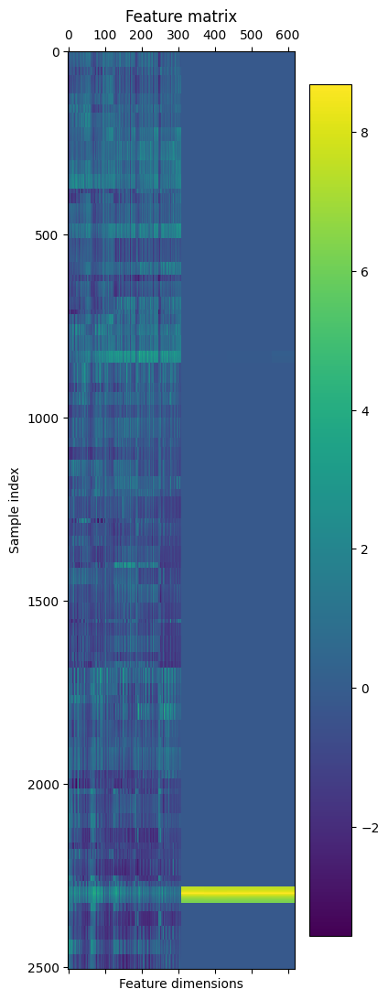

In [18]:
cp.cuda.Device(0).use()

args = get_seedIV_args()

device = get_device(args.bus_id, args.cuda_id[0])
setting_os_path(args.os_path)
# fix_random_variables(args.seed)


subject_de, subject_psd, subject_label, subject_sample_counts = load_subject_data(args.tensor_save_path, isdeap=False)

visualization_type = 1
for p in range(3):
    if p == 0:
        n_labels_by_class = args.n_labels_by_class3
    elif p == 1:
        n_labels_by_class = args.n_labels_by_class2
    else:
        n_labels_by_class = args.n_labels_by_class1
    
    best_epoch_list = []
    best_acc_list = []
    orig_acc_list = []


    print("========================================== SEED_IV Protocol {} ==========================================".format(int(n_labels_by_class)))

    for i in range(15):
        print("\n\n******************* SUBJECT : {} *********************".format(i+1))
        sub_idx = 'sub'+str(i+1)
        date = '230518'

        sub_de = subject_de[i]
        sub_psd = subject_psd[i]
        sub_label = subject_label[i]
        sub_sample_counts = subject_sample_counts[i]

        de, psd, identifier = other_preprocessing(sub_de,sub_psd,sub_label, n_labels_by_class, args.out_channels, args.seed)

        de = normalization(de, axis = 0, ntype='standardization')
        psd = normalization(psd, axis = 0, ntype='standardization')

        de_ssm, de_nssm = ssm_construction(de, args.n_samples, args.de_k)
        psd_ssm, psd_nssm = ssm_construction(psd, args.n_samples, args.psd_k)

        save_np(args.tensor_save_path+sub_idx, 'de_ssm_'+date, de_ssm)
        save_np(args.tensor_save_path+sub_idx, 'psd_ssm_'+date, psd_ssm)
        save_np(args.tensor_save_path+sub_idx, 'de_nssm_'+date, de_nssm)
        save_np(args.tensor_save_path+sub_idx, 'psd_nssm_'+date, psd_nssm)
        save_heatmap(de_ssm, "DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(psd_ssm, "PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(de_nssm, "DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(psd_nssm, "PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

        fsm = ssm_fusion(de_ssm,psd_ssm, de_nssm, psd_nssm, args.k1, args.t1)
        save_np(args.tensor_save_path+sub_idx, 'fused_ssm_'+date, fsm)
        save_heatmap(fsm, "Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

        adj = normalize_adj(fsm)
        save_np(args.tensor_save_path+sub_idx, 'adjacency_matrix_'+date, adj)
        save_heatmap(adj, "Normalized Adjacecy Matrix", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/adjacency_matrix/Adjacecny_Matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

        feature = input_feature(de, psd)
        label = sub_label

        save_heatmap(feature, "Feature matrix", "Feature dimensions", "Sample index", args.figure_save_path+'heatmap/'+sub_idx+'/feature/feature_matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight') 

        feature = torch.from_numpy(feature).to(torch.float32).to(device)
        adj = torch.from_numpy(adj).to(torch.float32).to(device)
        label = torch.from_numpy(label).to(torch.long).to(device)

        identifier = torch.from_numpy(identifier).bool()
        train_identifier = identifier.to(device)
        isunlabeled = ~identifier

        test_identifier = isunlabeled.to(device)

        activation = get_activation('celu')
        gcn = GraphConvolution

        encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
        model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
        optimizer = torch.optim.Adam(model.parameters(), lr = args.learning_rate)

        best_acc, best_epoch, best_z, result = uniform_GCA_train(model, optimizer, feature, adj, label,
                                                                            train_identifier, test_identifier,
                                                                            args,device,date,sub_idx, isdeap=False)

        experiment_type = 'subject_dependent'
        model_save_name = sub_idx+'_model'
        model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
        torch.save(model.state_dict(), model_path)
    
        print("*** Best ACC : {} , Best Epoch : {}***".format(round(best_acc.item(), 2), best_epoch))
        best_epoch_list.append(best_epoch)
        best_acc_list.append(round(best_acc.item(), 2))
        orig_acc_list.append(best_acc.item())


    #     sample = best_z.cpu().detach().numpy().copy()
    #     drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 4000)
    #     tsne_sample = StandardScaler().fit_transform(sample) # standardization
    #     dr_result = drmodel.fit_transform(tsne_sample)

    #     save_scatter(dr_result, label, best_acc.item(),sub_idx, date, args.figure_save_path, visualization_type, identifier)

    print("\n**************** Best acc by subject *********************")
    print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(best_acc_list, round(np.mean(orig_acc_list),2), round(np.std(orig_acc_list),2)))

    print("\n Best Epochs : {}".format(best_epoch_list))
    best_acc_list = np.array(best_acc_list)
    save_np(args.tensor_save_path+sub_idx, 'protocol '+str(n_labels_by_class)+'_best_acc_list_'+date, best_acc_list)

Device: cuda
Current cuda device: 1
Count of using GPUs: 3
========================================== SEED_IV Protocol 25 ==========================================


******************* SUBJECT : 1 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
3.3

Epoch 640 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.56,    Test Loss :0.71,    Total Acc : 96.28
Epoch 650 - Train Acc : 99.5    Train Loss : 0.09,    Test Acc : 92.6,    Test Loss :0.61,    Total Acc : 96.05
Epoch 660 - Train Acc : 99.0    Train Loss : 0.09,    Test Acc : 92.52,    Test Loss :0.66,    Total Acc : 95.76
Epoch 670 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.31,    Test Loss :0.74,    Total Acc : 96.15
Epoch 680 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.18,    Test Loss :0.66,    Total Acc : 97.09
Epoch 690 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.64,    Test Loss :0.67,    Total Acc : 97.32
Epoch 700 - Train Acc : 99.0    Train Loss : 0.08,    Test Acc : 91.98,    Test Loss :0.74,    Total Acc : 95.49
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.73,    Test Loss :0.91,    Total Acc : 95.86
Epoch 720 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.3,    Test Loss :0.71, 

Epoch 1380 - Train Acc : 99.5    Train Loss : 0.09,    Test Acc : 91.85,    Test Loss :0.86,    Total Acc : 95.68
Epoch 1390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.27,    Test Loss :0.84,    Total Acc : 95.63
Epoch 1400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.81,    Test Loss :0.9,    Total Acc : 96.4
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.97,    Test Loss :0.61,    Total Acc : 96.49
Epoch 1420 - Train Acc : 99.5    Train Loss : 0.1,    Test Acc : 91.68,    Test Loss :1.24,    Total Acc : 95.59
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.64,    Test Loss :0.69,    Total Acc : 97.32
Epoch 1440 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.89,    Test Loss :0.99,    Total Acc : 96.44
Epoch 1450 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.68,    Test Loss :0.77,    Total Acc : 96.84
Epoch 1460 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.22,    Test Los

Epoch 2110 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.89,    Test Loss :1.04,    Total Acc : 96.44
Epoch 2120 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.81,    Test Loss :1.34,    Total Acc : 95.9
Epoch 2130 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.31,    Test Loss :0.95,    Total Acc : 96.65
Epoch 2140 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.89,    Test Loss :0.86,    Total Acc : 96.44
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.93,    Test Loss :0.79,    Total Acc : 96.96
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.93,    Test Loss :0.89,    Total Acc : 96.47
Epoch 2170 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.22,    Test Loss :1.02,    Total Acc : 96.11
Epoch 2180 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.52,    Test Loss :1.28,    Total Acc : 94.76
Epoch 2190 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.18,    Test

Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.43,    Test Loss :0.65,    Total Acc : 96.72
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.31,    Test Loss :0.57,    Total Acc : 96.65
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.47,    Test Loss :0.64,    Total Acc : 96.74
Epoch 2870 - Train Acc : 98.0    Train Loss : 0.22,    Test Acc : 92.85,    Test Loss :0.78,    Total Acc : 95.42
Epoch 2880 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.89,    Test Loss :0.79,    Total Acc : 96.94
Epoch 2890 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.01,    Test Loss :0.77,    Total Acc : 96.51
Epoch 2900 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.18,    Test Loss :0.75,    Total Acc : 97.09
Epoch 2910 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.64,    Test Loss :0.78,    Total Acc : 96.32
Epoch 2920 - Train Acc : 99.5    Train Loss : 0.08,    Test Acc : 91.19,    Test 

Epoch 490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.22,    Test Loss :0.37,    Total Acc : 98.11
Epoch 500 - Train Acc : 99.5    Train Loss : 0.09,    Test Acc : 95.18,    Test Loss :0.59,    Total Acc : 97.34
Epoch 510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.09,    Test Loss :0.6,    Total Acc : 98.05
Epoch 520 - Train Acc : 98.5    Train Loss : 0.11,    Test Acc : 93.76,    Test Loss :0.85,    Total Acc : 96.13
Epoch 530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.47,    Test Loss :0.53,    Total Acc : 96.74
Epoch 540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.09,    Test Loss :0.53,    Total Acc : 98.05
Epoch 550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.01,    Test Loss :0.91,    Total Acc : 97.01
Epoch 560 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.68,    Test Loss :0.79,    Total Acc : 97.34
Epoch 570 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.14,    Test Loss :0.58

Epoch 1210 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.38,    Test Loss :0.47,    Total Acc : 98.19
Epoch 1220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.88,    Test Loss :0.42,    Total Acc : 97.94
Epoch 1230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 98.17,    Test Loss :0.24,    Total Acc : 99.09
Epoch 1240 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.38,    Test Loss :0.34,    Total Acc : 98.19
Epoch 1250 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.97,    Test Loss :0.33,    Total Acc : 97.98
Epoch 1260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.55,    Test Loss :0.43,    Total Acc : 97.28
Epoch 1270 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.97,    Test Loss :0.49,    Total Acc : 97.98
Epoch 1280 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.34,    Test Loss :0.46,    Total Acc : 98.17
Epoch 1290 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.38,    Tes

Epoch 1940 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.17,    Test Loss :0.99,    Total Acc : 98.09
Epoch 1950 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.97,    Test Loss :0.5,    Total Acc : 97.98
Epoch 1960 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.18,    Test Loss :0.5,    Total Acc : 97.59
Epoch 1970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.05,    Test Loss :0.76,    Total Acc : 97.53
Epoch 1980 - Train Acc : 98.0    Train Loss : 0.14,    Test Acc : 94.55,    Test Loss :0.64,    Total Acc : 96.28
Epoch 1990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.09,    Test Loss :0.49,    Total Acc : 98.54
Epoch 2000 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.97,    Test Loss :0.64,    Total Acc : 97.98
Epoch 2010 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.55,    Test Loss :0.65,    Total Acc : 97.78
Epoch 2020 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.13,    Test L

Epoch 2680 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.34,    Test Loss :1.23,    Total Acc : 97.67
Epoch 2690 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.3,    Test Loss :0.85,    Total Acc : 98.15
Epoch 2700 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.35,    Test Loss :1.25,    Total Acc : 96.67
Epoch 2710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.72,    Test Loss :1.21,    Total Acc : 97.36
Epoch 2720 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.01,    Test Loss :1.77,    Total Acc : 97.01
Epoch 2730 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.22,    Test Loss :0.96,    Total Acc : 97.11
Epoch 2740 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.97,    Test Loss :1.45,    Total Acc : 97.98
Epoch 2750 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.01,    Test Loss :1.25,    Total Acc : 97.51
Epoch 2760 - Train Acc : 99.0    Train Loss : 0.1,    Test Acc : 94.97,    Test L

/tmp/ipykernel_3040/4212163399.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.matshow(matrix)


Epoch 10 - Train Acc : 65.0    Train Loss : 0.87,    Test Acc : 52.77,    Test Loss :1.24,    Total Acc : 58.88
Epoch 20 - Train Acc : 85.0    Train Loss : 0.53,    Test Acc : 70.81,    Test Loss :0.98,    Total Acc : 77.91
Epoch 30 - Train Acc : 88.5    Train Loss : 0.42,    Test Acc : 73.43,    Test Loss :0.94,    Total Acc : 80.97
Epoch 40 - Train Acc : 90.5    Train Loss : 0.4,    Test Acc : 78.88,    Test Loss :1.13,    Total Acc : 84.69
Epoch 50 - Train Acc : 95.5    Train Loss : 0.25,    Test Acc : 83.28,    Test Loss :1.0,    Total Acc : 89.39
Epoch 60 - Train Acc : 92.5    Train Loss : 0.27,    Test Acc : 76.55,    Test Loss :1.0,    Total Acc : 84.52
Epoch 70 - Train Acc : 86.0    Train Loss : 0.42,    Test Acc : 76.42,    Test Loss :1.06,    Total Acc : 81.21
Epoch 80 - Train Acc : 92.0    Train Loss : 0.26,    Test Acc : 79.92,    Test Loss :0.87,    Total Acc : 85.96
Epoch 90 - Train Acc : 90.0    Train Loss : 0.38,    Test Acc : 83.74,    Test Loss :1.0,    Total Acc : 86

Epoch 740 - Train Acc : 99.0    Train Loss : 0.12,    Test Acc : 84.66,    Test Loss :1.84,    Total Acc : 91.83
Epoch 750 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.85,    Test Loss :1.5,    Total Acc : 94.93
Epoch 760 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.23,    Test Loss :1.37,    Total Acc : 95.61
Epoch 770 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.23,    Test Loss :2.02,    Total Acc : 93.62
Epoch 780 - Train Acc : 93.5    Train Loss : 0.33,    Test Acc : 78.42,    Test Loss :1.83,    Total Acc : 85.96
Epoch 790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.03,    Test Loss :1.65,    Total Acc : 93.51
Epoch 800 - Train Acc : 96.5    Train Loss : 0.16,    Test Acc : 83.04,    Test Loss :1.44,    Total Acc : 89.77
Epoch 810 - Train Acc : 95.0    Train Loss : 0.23,    Test Acc : 86.82,    Test Loss :1.88,    Total Acc : 90.91
Epoch 820 - Train Acc : 97.5    Train Loss : 0.13,    Test Acc : 85.82,    Test Loss :1.68,  

Epoch 1480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.78,    Test Loss :1.65,    Total Acc : 93.39
Epoch 1490 - Train Acc : 98.0    Train Loss : 0.14,    Test Acc : 85.53,    Test Loss :1.82,    Total Acc : 91.77
Epoch 1500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.65,    Test Loss :1.64,    Total Acc : 92.83
Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.4,    Test Loss :1.85,    Total Acc : 93.2
Epoch 1520 - Train Acc : 99.5    Train Loss : 0.09,    Test Acc : 86.99,    Test Loss :1.77,    Total Acc : 93.24
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.27,    Test Loss :1.65,    Total Acc : 95.14
Epoch 1540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.57,    Test Loss :1.62,    Total Acc : 93.78
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 84.66,    Test Loss :1.88,    Total Acc : 92.33
Epoch 1560 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.94,    Test Lo

Epoch 2200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.45,    Test Loss :2.12,    Total Acc : 92.72
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.94,    Test Loss :2.33,    Total Acc : 93.47
Epoch 2220 - Train Acc : 99.5    Train Loss : 0.08,    Test Acc : 86.28,    Test Loss :2.38,    Total Acc : 92.89
Epoch 2230 - Train Acc : 99.5    Train Loss : 0.1,    Test Acc : 86.69,    Test Loss :1.59,    Total Acc : 93.1
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.4,    Test Loss :1.66,    Total Acc : 94.2
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 85.16,    Test Loss :1.98,    Total Acc : 92.58
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 87.44,    Test Loss :1.9,    Total Acc : 93.72
Epoch 2270 - Train Acc : 98.0    Train Loss : 0.12,    Test Acc : 84.91,    Test Loss :2.87,    Total Acc : 91.45
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.2,    Test Loss :2

Epoch 2920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 85.45,    Test Loss :3.14,    Total Acc : 92.72
Epoch 2930 - Train Acc : 99.0    Train Loss : 0.09,    Test Acc : 86.53,    Test Loss :2.97,    Total Acc : 92.76
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.48,    Test Loss :2.61,    Total Acc : 94.74
Epoch 2950 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.73,    Test Loss :2.15,    Total Acc : 95.36
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.81,    Test Loss :2.07,    Total Acc : 95.41
Epoch 2970 - Train Acc : 99.5    Train Loss : 0.09,    Test Acc : 85.45,    Test Loss :2.41,    Total Acc : 92.47
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 86.9,    Test Loss :2.55,    Total Acc : 93.45
Epoch 2990 - Train Acc : 98.0    Train Loss : 0.11,    Test Acc : 84.53,    Test Loss :2.66,    Total Acc : 91.27
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 86.82,    Test Lo

Epoch 550 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.1,    Test Loss :0.75,    Total Acc : 95.55
Epoch 560 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.14,    Test Loss :0.66,    Total Acc : 97.07
Epoch 570 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.98,    Test Loss :0.77,    Total Acc : 95.99
Epoch 580 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.93,    Test Loss :0.48,    Total Acc : 96.96
Epoch 590 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.72,    Test Loss :0.54,    Total Acc : 97.86
Epoch 600 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.84,    Test Loss :0.65,    Total Acc : 97.42
Epoch 610 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.85,    Test Loss :0.71,    Total Acc : 96.42
Epoch 620 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.26,    Test Loss :0.44,    Total Acc : 97.63
Epoch 630 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.68,    Test Loss :0.

Epoch 1270 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.97,    Test Loss :0.43,    Total Acc : 97.98
Epoch 1280 - Train Acc : 99.5    Train Loss : 0.09,    Test Acc : 96.3,    Test Loss :0.37,    Total Acc : 97.9
Epoch 1290 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.35,    Test Loss :0.38,    Total Acc : 97.17
Epoch 1300 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.26,    Test Loss :0.53,    Total Acc : 97.63
Epoch 1310 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.26,    Test Loss :0.44,    Total Acc : 97.63
Epoch 1320 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.26,    Test Loss :0.45,    Total Acc : 97.63
Epoch 1330 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.97,    Test Loss :0.47,    Total Acc : 97.48
Epoch 1340 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.05,    Test Loss :0.47,    Total Acc : 97.03
Epoch 1350 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.22,    Test L

Epoch 2000 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.6,    Test Loss :0.75,    Total Acc : 96.3
Epoch 2010 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.47,    Test Loss :0.61,    Total Acc : 96.74
Epoch 2020 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.84,    Test Loss :0.63,    Total Acc : 97.42
Epoch 2030 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.38,    Test Loss :0.56,    Total Acc : 98.19
Epoch 2040 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.3,    Test Loss :0.7,    Total Acc : 97.15
Epoch 2050 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.35,    Test Loss :0.55,    Total Acc : 96.67
Epoch 2060 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.72,    Test Loss :0.64,    Total Acc : 96.86
Epoch 2070 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.38,    Test Loss :0.45,    Total Acc : 98.19
Epoch 2080 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.85,    Test Lo

Epoch 2720 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.18,    Test Loss :1.31,    Total Acc : 96.09
Epoch 2730 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.18,    Test Loss :1.37,    Total Acc : 96.59
Epoch 2740 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.22,    Test Loss :1.14,    Total Acc : 96.61
Epoch 2750 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.18,    Test Loss :1.22,    Total Acc : 96.59
Epoch 2760 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.93,    Test Loss :1.04,    Total Acc : 96.96
Epoch 2770 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.93,    Test Loss :1.15,    Total Acc : 96.96
Epoch 2780 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.09,    Test Loss :0.94,    Total Acc : 97.55
Epoch 2790 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.43,    Test Loss :1.01,    Total Acc : 96.72
Epoch 2800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.51,    Tes

Epoch 370 - Train Acc : 95.0    Train Loss : 0.21,    Test Acc : 86.94,    Test Loss :0.64,    Total Acc : 90.97
Epoch 380 - Train Acc : 95.5    Train Loss : 0.19,    Test Acc : 87.07,    Test Loss :0.67,    Total Acc : 91.28
Epoch 390 - Train Acc : 97.0    Train Loss : 0.21,    Test Acc : 89.98,    Test Loss :0.72,    Total Acc : 93.49
Epoch 400 - Train Acc : 92.5    Train Loss : 0.28,    Test Acc : 88.9,    Test Loss :0.67,    Total Acc : 90.7
Epoch 410 - Train Acc : 96.5    Train Loss : 0.18,    Test Acc : 89.36,    Test Loss :0.78,    Total Acc : 92.93
Epoch 420 - Train Acc : 94.5    Train Loss : 0.24,    Test Acc : 84.24,    Test Loss :0.81,    Total Acc : 89.37
Epoch 430 - Train Acc : 88.5    Train Loss : 0.34,    Test Acc : 81.21,    Test Loss :1.0,    Total Acc : 84.85
Epoch 440 - Train Acc : 96.5    Train Loss : 0.2,    Test Acc : 90.52,    Test Loss :0.65,    Total Acc : 93.51
Epoch 450 - Train Acc : 93.5    Train Loss : 0.26,    Test Acc : 86.99,    Test Loss :0.59,    Total

Epoch 1120 - Train Acc : 96.5    Train Loss : 0.15,    Test Acc : 91.43,    Test Loss :0.58,    Total Acc : 93.97
Epoch 1130 - Train Acc : 100.0    Train Loss : 0.13,    Test Acc : 93.18,    Test Loss :0.54,    Total Acc : 96.59
Epoch 1140 - Train Acc : 98.0    Train Loss : 0.12,    Test Acc : 92.27,    Test Loss :0.72,    Total Acc : 95.13
Epoch 1150 - Train Acc : 98.5    Train Loss : 0.11,    Test Acc : 93.68,    Test Loss :0.62,    Total Acc : 96.09
Epoch 1160 - Train Acc : 94.0    Train Loss : 0.27,    Test Acc : 88.23,    Test Loss :0.88,    Total Acc : 91.12
Epoch 1170 - Train Acc : 95.0    Train Loss : 0.17,    Test Acc : 87.78,    Test Loss :0.67,    Total Acc : 91.39
Epoch 1180 - Train Acc : 99.0    Train Loss : 0.12,    Test Acc : 89.52,    Test Loss :0.81,    Total Acc : 94.26
Epoch 1190 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 91.02,    Test Loss :0.71,    Total Acc : 95.51
Epoch 1200 - Train Acc : 97.5    Train Loss : 0.17,    Test Acc : 88.61,    Test Loss :

Epoch 1840 - Train Acc : 99.0    Train Loss : 0.13,    Test Acc : 89.48,    Test Loss :1.01,    Total Acc : 94.24
Epoch 1850 - Train Acc : 99.0    Train Loss : 0.11,    Test Acc : 95.14,    Test Loss :0.59,    Total Acc : 97.07
Epoch 1860 - Train Acc : 100.0    Train Loss : 0.1,    Test Acc : 94.18,    Test Loss :0.65,    Total Acc : 97.09
Epoch 1870 - Train Acc : 100.0    Train Loss : 0.09,    Test Acc : 93.1,    Test Loss :0.69,    Total Acc : 96.55
Epoch 1880 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.1,    Test Loss :0.65,    Total Acc : 97.05
Epoch 1890 - Train Acc : 93.0    Train Loss : 0.25,    Test Acc : 86.61,    Test Loss :0.88,    Total Acc : 89.81
Epoch 1900 - Train Acc : 99.5    Train Loss : 0.09,    Test Acc : 92.72,    Test Loss :0.72,    Total Acc : 96.11
Epoch 1910 - Train Acc : 90.0    Train Loss : 0.34,    Test Acc : 79.09,    Test Loss :1.23,    Total Acc : 84.54
Epoch 1920 - Train Acc : 97.0    Train Loss : 0.13,    Test Acc : 90.31,    Test Loss :0

Epoch 2580 - Train Acc : 99.0    Train Loss : 0.13,    Test Acc : 93.68,    Test Loss :0.83,    Total Acc : 96.34
Epoch 2590 - Train Acc : 99.0    Train Loss : 0.09,    Test Acc : 93.06,    Test Loss :0.71,    Total Acc : 96.03
Epoch 2600 - Train Acc : 99.0    Train Loss : 0.1,    Test Acc : 90.02,    Test Loss :0.94,    Total Acc : 94.51
Epoch 2610 - Train Acc : 95.5    Train Loss : 0.17,    Test Acc : 88.61,    Test Loss :1.23,    Total Acc : 92.05
Epoch 2620 - Train Acc : 99.0    Train Loss : 0.11,    Test Acc : 89.9,    Test Loss :0.94,    Total Acc : 94.45
Epoch 2630 - Train Acc : 99.0    Train Loss : 0.12,    Test Acc : 94.55,    Test Loss :0.48,    Total Acc : 96.78
Epoch 2640 - Train Acc : 94.5    Train Loss : 0.19,    Test Acc : 83.53,    Test Loss :1.28,    Total Acc : 89.02
Epoch 2650 - Train Acc : 98.0    Train Loss : 0.16,    Test Acc : 86.07,    Test Loss :1.03,    Total Acc : 92.04
Epoch 2660 - Train Acc : 98.0    Train Loss : 0.16,    Test Acc : 92.77,    Test Loss :0.5

Epoch 220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.14,    Test Loss :0.52,    Total Acc : 97.07
Epoch 230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.6,    Test Loss :0.69,    Total Acc : 96.8
Epoch 240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.85,    Test Loss :0.74,    Total Acc : 95.93
Epoch 250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.81,    Test Loss :1.09,    Total Acc : 95.41
Epoch 260 - Train Acc : 99.0    Train Loss : 0.11,    Test Acc : 88.9,    Test Loss :0.9,    Total Acc : 93.95
Epoch 270 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.6,    Test Loss :0.85,    Total Acc : 95.8
Epoch 280 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.55,    Test Loss :0.55,    Total Acc : 97.28
Epoch 290 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.22,    Test Loss :0.58,    Total Acc : 97.11
Epoch 300 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.18,    Test Loss :0.66,   

Epoch 970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.68,    Test Loss :1.11,    Total Acc : 95.84
Epoch 980 - Train Acc : 99.5    Train Loss : 0.09,    Test Acc : 90.52,    Test Loss :0.91,    Total Acc : 95.01
Epoch 990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.23,    Test Loss :0.87,    Total Acc : 95.61
Epoch 1000 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.72,    Test Loss :0.76,    Total Acc : 96.36
Epoch 1010 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.14,    Test Loss :0.72,    Total Acc : 96.57
Epoch 1020 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.68,    Test Loss :0.9,    Total Acc : 96.84
Epoch 1030 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.64,    Test Loss :1.02,    Total Acc : 96.82
Epoch 1040 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.22,    Test Loss :1.02,    Total Acc : 96.61
Epoch 1050 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.68,    Test Los

Epoch 1690 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.52,    Test Loss :1.87,    Total Acc : 95.26
Epoch 1700 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.52,    Test Loss :1.73,    Total Acc : 96.26
Epoch 1710 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.9,    Test Loss :1.9,    Total Acc : 94.95
Epoch 1720 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.73,    Test Loss :1.88,    Total Acc : 94.86
Epoch 1730 - Train Acc : 99.5    Train Loss : 0.09,    Test Acc : 90.02,    Test Loss :1.42,    Total Acc : 94.76
Epoch 1740 - Train Acc : 99.5    Train Loss : 0.13,    Test Acc : 90.81,    Test Loss :1.38,    Total Acc : 95.16
Epoch 1750 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.93,    Test Loss :1.22,    Total Acc : 95.97
Epoch 1760 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.22,    Test Loss :1.21,    Total Acc : 96.61
Epoch 1770 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.01,    Test Lo

Epoch 2410 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.51,    Test Loss :1.85,    Total Acc : 97.26
Epoch 2420 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.64,    Test Loss :1.73,    Total Acc : 96.82
Epoch 2430 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.52,    Test Loss :1.9,    Total Acc : 96.26
Epoch 2440 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.85,    Test Loss :1.68,    Total Acc : 96.92
Epoch 2450 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.55,    Test Loss :1.92,    Total Acc : 97.28
Epoch 2460 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.35,    Test Loss :2.34,    Total Acc : 96.17
Epoch 2470 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.47,    Test Loss :2.29,    Total Acc : 96.24
Epoch 2480 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.55,    Test Loss :1.93,    Total Acc : 97.28
Epoch 2490 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.35,    Test

Epoch 40 - Train Acc : 98.5    Train Loss : 0.16,    Test Acc : 95.38,    Test Loss :0.82,    Total Acc : 96.94
Epoch 50 - Train Acc : 99.5    Train Loss : 0.08,    Test Acc : 94.05,    Test Loss :0.94,    Total Acc : 96.78
Epoch 60 - Train Acc : 99.5    Train Loss : 0.13,    Test Acc : 94.47,    Test Loss :0.8,    Total Acc : 96.98
Epoch 70 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.38,    Test Loss :0.65,    Total Acc : 97.69
Epoch 80 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.1,    Test Loss :0.72,    Total Acc : 97.05
Epoch 90 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.39,    Test Loss :0.63,    Total Acc : 97.19
Epoch 100 - Train Acc : 99.0    Train Loss : 0.09,    Test Acc : 93.39,    Test Loss :0.45,    Total Acc : 96.19
Epoch 110 - Train Acc : 99.0    Train Loss : 0.09,    Test Acc : 94.43,    Test Loss :0.5,    Total Acc : 96.71
Epoch 120 - Train Acc : 99.5    Train Loss : 0.09,    Test Acc : 95.43,    Test Loss :0.61,    Total A

Epoch 790 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.09,    Test Loss :0.76,    Total Acc : 97.55
Epoch 800 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.63,    Test Loss :0.81,    Total Acc : 98.32
Epoch 810 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.05,    Test Loss :0.87,    Total Acc : 97.03
Epoch 820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.88,    Test Loss :0.62,    Total Acc : 97.94
Epoch 830 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.18,    Test Loss :0.97,    Total Acc : 97.09
Epoch 840 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.05,    Test Loss :0.75,    Total Acc : 97.03
Epoch 850 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.05,    Test Loss :0.79,    Total Acc : 97.03
Epoch 860 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.05,    Test Loss :0.85,    Total Acc : 97.03
Epoch 870 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.05,    Test Loss :0

Epoch 1510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.84,    Test Loss :0.91,    Total Acc : 97.42
Epoch 1520 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.05,    Test Loss :0.97,    Total Acc : 97.03
Epoch 1530 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.14,    Test Loss :0.9,    Total Acc : 97.57
Epoch 1540 - Train Acc : 99.5    Train Loss : 0.08,    Test Acc : 94.05,    Test Loss :0.89,    Total Acc : 96.78
Epoch 1550 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.88,    Test Loss :0.6,    Total Acc : 97.94
Epoch 1560 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.01,    Test Loss :1.13,    Total Acc : 96.51
Epoch 1570 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.05,    Test Loss :0.88,    Total Acc : 97.03
Epoch 1580 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.05,    Test Loss :1.0,    Total Acc : 97.03
Epoch 1590 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.05,    Test Lo

Epoch 2230 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.88,    Test Loss :0.94,    Total Acc : 97.94
Epoch 2240 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.88,    Test Loss :1.2,    Total Acc : 97.94
Epoch 2250 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.88,    Test Loss :1.21,    Total Acc : 97.94
Epoch 2260 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.88,    Test Loss :1.19,    Total Acc : 97.94
Epoch 2270 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.88,    Test Loss :1.11,    Total Acc : 97.94
Epoch 2280 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.88,    Test Loss :1.19,    Total Acc : 97.94
Epoch 2290 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.88,    Test Loss :1.0,    Total Acc : 97.94
Epoch 2300 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.92,    Test Loss :1.17,    Total Acc : 98.46
Epoch 2310 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.92,    Test 

Epoch 2950 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.92,    Test Loss :1.13,    Total Acc : 98.46
Epoch 2960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.42,    Test Loss :0.79,    Total Acc : 98.21
Epoch 2970 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.88,    Test Loss :0.75,    Total Acc : 98.44
Epoch 2980 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.42,    Test Loss :1.07,    Total Acc : 98.21
Epoch 2990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.76,    Test Loss :1.19,    Total Acc : 97.88
Epoch 3000 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.88,    Test Loss :1.37,    Total Acc : 97.94
*** Best ACC : 97.71 , Best Epoch : 2661***


******************* SUBJECT : 8 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Dista

Epoch 580 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.43,    Test Loss :0.39,    Total Acc : 97.21
Epoch 590 - Train Acc : 99.0    Train Loss : 0.09,    Test Acc : 94.18,    Test Loss :0.38,    Total Acc : 96.59
Epoch 600 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.38,    Test Loss :0.26,    Total Acc : 98.19
Epoch 610 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.55,    Test Loss :0.31,    Total Acc : 97.28
Epoch 620 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.01,    Test Loss :0.43,    Total Acc : 97.51
Epoch 630 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.26,    Test Loss :0.4,    Total Acc : 97.63
Epoch 640 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.76,    Test Loss :0.5,    Total Acc : 96.88
Epoch 650 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.26,    Test Loss :0.49,    Total Acc : 98.13
Epoch 660 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.34,    Test Loss :0.49

Epoch 1300 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.47,    Test Loss :0.33,    Total Acc : 97.23
Epoch 1310 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.67,    Test Loss :0.33,    Total Acc : 98.34
Epoch 1320 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.76,    Test Loss :0.39,    Total Acc : 97.88
Epoch 1330 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.42,    Test Loss :0.32,    Total Acc : 98.21
Epoch 1340 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.51,    Test Loss :0.35,    Total Acc : 97.75
Epoch 1350 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.43,    Test Loss :0.46,    Total Acc : 97.71
Epoch 1360 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.38,    Test Loss :0.39,    Total Acc : 98.19
Epoch 1370 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 97.21,    Test Loss :0.37,    Total Acc : 98.61
Epoch 1380 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.67,    Tes

Epoch 2040 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.05,    Test Loss :0.58,    Total Acc : 98.02
Epoch 2050 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.43,    Test Loss :1.1,    Total Acc : 96.72
Epoch 2060 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.47,    Test Loss :0.85,    Total Acc : 97.23
Epoch 2070 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.47,    Test Loss :0.83,    Total Acc : 97.73
Epoch 2080 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.84,    Test Loss :0.68,    Total Acc : 97.42
Epoch 2090 - Train Acc : 99.5    Train Loss : 0.09,    Test Acc : 94.89,    Test Loss :0.61,    Total Acc : 97.19
Epoch 2100 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.22,    Test Loss :0.69,    Total Acc : 98.11
Epoch 2110 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.26,    Test Loss :0.79,    Total Acc : 97.63
Epoch 2120 - Train Acc : 98.5    Train Loss : 0.28,    Test Acc : 96.09,    Test L

Epoch 2780 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 97.71,    Test Loss :0.44,    Total Acc : 98.86
Epoch 2790 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.22,    Test Loss :0.39,    Total Acc : 98.11
Epoch 2800 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.67,    Test Loss :0.48,    Total Acc : 98.34
Epoch 2810 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.51,    Test Loss :0.37,    Total Acc : 97.75
Epoch 2820 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.67,    Test Loss :0.36,    Total Acc : 98.34
Epoch 2830 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 97.01,    Test Loss :0.42,    Total Acc : 98.5
Epoch 2840 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.67,    Test Loss :0.53,    Total Acc : 98.34
Epoch 2850 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.47,    Test Loss :0.66,    Total Acc : 97.73
Epoch 2860 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 97.34,    Test

Epoch 430 - Train Acc : 99.5    Train Loss : 0.08,    Test Acc : 91.85,    Test Loss :1.57,    Total Acc : 95.68
Epoch 440 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.31,    Test Loss :1.46,    Total Acc : 96.15
Epoch 450 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.27,    Test Loss :1.61,    Total Acc : 96.13
Epoch 460 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.18,    Test Loss :1.4,    Total Acc : 96.09
Epoch 470 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.6,    Test Loss :1.18,    Total Acc : 96.3
Epoch 480 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.77,    Test Loss :1.15,    Total Acc : 95.88
Epoch 490 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.81,    Test Loss :1.05,    Total Acc : 95.9
Epoch 500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.1,    Test Loss :1.17,    Total Acc : 95.55
Epoch 510 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.85,    Test Loss :1.15,  

Epoch 1170 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.44,    Test Loss :1.64,    Total Acc : 94.72
Epoch 1180 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.98,    Test Loss :1.35,    Total Acc : 95.49
Epoch 1190 - Train Acc : 98.5    Train Loss : 0.17,    Test Acc : 89.15,    Test Loss :1.89,    Total Acc : 93.82
Epoch 1200 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.56,    Test Loss :1.28,    Total Acc : 95.28
Epoch 1210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.48,    Test Loss :1.41,    Total Acc : 95.74
Epoch 1220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.35,    Test Loss :1.06,    Total Acc : 96.17
Epoch 1230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.81,    Test Loss :0.93,    Total Acc : 96.4
Epoch 1240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.23,    Test Loss :1.19,    Total Acc : 95.61
Epoch 1250 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.48,    Test 

Epoch 1910 - Train Acc : 99.5    Train Loss : 0.08,    Test Acc : 89.36,    Test Loss :1.77,    Total Acc : 94.43
Epoch 1920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.85,    Test Loss :1.19,    Total Acc : 95.93
Epoch 1930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.19,    Test Loss :1.06,    Total Acc : 95.59
Epoch 1940 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.73,    Test Loss :1.68,    Total Acc : 95.36
Epoch 1950 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.15,    Test Loss :1.68,    Total Acc : 95.07
Epoch 1960 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.15,    Test Loss :2.0,    Total Acc : 95.07
Epoch 1970 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.81,    Test Loss :1.98,    Total Acc : 94.91
Epoch 1980 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.23,    Test Loss :1.69,    Total Acc : 95.11
Epoch 1990 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.19,    Test 

Epoch 2640 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.72,    Test Loss :1.02,    Total Acc : 96.36
Epoch 2650 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.98,    Test Loss :1.24,    Total Acc : 95.99
Epoch 2660 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.23,    Test Loss :1.28,    Total Acc : 95.61
Epoch 2670 - Train Acc : 99.5    Train Loss : 0.08,    Test Acc : 92.72,    Test Loss :0.86,    Total Acc : 96.11
Epoch 2680 - Train Acc : 99.5    Train Loss : 0.08,    Test Acc : 90.44,    Test Loss :1.29,    Total Acc : 94.97
Epoch 2690 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.06,    Test Loss :1.3,    Total Acc : 95.53
Epoch 2700 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.89,    Test Loss :1.52,    Total Acc : 95.45
Epoch 2710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.77,    Test Loss :1.2,    Total Acc : 95.88
Epoch 2720 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.64,    Test Lo

Epoch 270 - Train Acc : 99.5    Train Loss : 0.08,    Test Acc : 91.43,    Test Loss :1.94,    Total Acc : 95.47
Epoch 280 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.14,    Test Loss :2.29,    Total Acc : 95.57
Epoch 290 - Train Acc : 99.0    Train Loss : 0.1,    Test Acc : 90.98,    Test Loss :2.22,    Total Acc : 94.99
Epoch 300 - Train Acc : 99.0    Train Loss : 0.11,    Test Acc : 94.51,    Test Loss :1.6,    Total Acc : 96.76
Epoch 310 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.35,    Test Loss :2.28,    Total Acc : 95.18
Epoch 320 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.1,    Test Loss :2.16,    Total Acc : 96.05
Epoch 330 - Train Acc : 99.0    Train Loss : 0.16,    Test Acc : 89.48,    Test Loss :2.67,    Total Acc : 94.24
Epoch 340 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.73,    Test Loss :1.78,    Total Acc : 95.36
Epoch 350 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.98,    Test Loss :2.35,   

Epoch 1020 - Train Acc : 99.5    Train Loss : 0.09,    Test Acc : 91.1,    Test Loss :1.12,    Total Acc : 95.3
Epoch 1030 - Train Acc : 99.5    Train Loss : 0.08,    Test Acc : 93.35,    Test Loss :1.35,    Total Acc : 96.42
Epoch 1040 - Train Acc : 99.5    Train Loss : 0.08,    Test Acc : 92.52,    Test Loss :1.36,    Total Acc : 96.01
Epoch 1050 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.43,    Test Loss :1.21,    Total Acc : 96.22
Epoch 1060 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.31,    Test Loss :1.49,    Total Acc : 95.65
Epoch 1070 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.85,    Test Loss :1.37,    Total Acc : 95.93
Epoch 1080 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.43,    Test Loss :1.97,    Total Acc : 95.72
Epoch 1090 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.77,    Test Loss :1.7,    Total Acc : 95.38
Epoch 1100 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.77,    Test Loss

Epoch 1740 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.65,    Test Loss :3.4,    Total Acc : 94.82
Epoch 1750 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.77,    Test Loss :3.02,    Total Acc : 95.38
Epoch 1760 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.52,    Test Loss :3.98,    Total Acc : 95.76
Epoch 1770 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.64,    Test Loss :2.98,    Total Acc : 95.32
Epoch 1780 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.68,    Test Loss :1.93,    Total Acc : 95.84
Epoch 1790 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.85,    Test Loss :2.17,    Total Acc : 95.93
Epoch 1800 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.02,    Test Loss :2.39,    Total Acc : 95.01
Epoch 1810 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.89,    Test Loss :1.82,    Total Acc : 95.95
Epoch 1820 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.27,    Test

Epoch 2460 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.06,    Test Loss :4.79,    Total Acc : 96.03
Epoch 2470 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.14,    Test Loss :3.63,    Total Acc : 96.57
Epoch 2480 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.35,    Test Loss :5.07,    Total Acc : 96.17
Epoch 2490 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.39,    Test Loss :2.0,    Total Acc : 95.7
Epoch 2500 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.64,    Test Loss :4.88,    Total Acc : 95.82
Epoch 2510 - Train Acc : 99.5    Train Loss : 0.08,    Test Acc : 92.39,    Test Loss :4.67,    Total Acc : 95.95
Epoch 2520 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.56,    Test Loss :4.71,    Total Acc : 95.28
Epoch 2530 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.43,    Test Loss :4.59,    Total Acc : 95.72
Epoch 2540 - Train Acc : 98.5    Train Loss : 0.12,    Test Acc : 88.57,    Test Lo

Epoch 90 - Train Acc : 89.0    Train Loss : 0.33,    Test Acc : 85.32,    Test Loss :1.14,    Total Acc : 87.16
Epoch 100 - Train Acc : 98.0    Train Loss : 0.14,    Test Acc : 90.35,    Test Loss :0.96,    Total Acc : 94.18
Epoch 110 - Train Acc : 96.5    Train Loss : 0.17,    Test Acc : 91.52,    Test Loss :0.82,    Total Acc : 94.01
Epoch 120 - Train Acc : 99.5    Train Loss : 0.11,    Test Acc : 92.68,    Test Loss :0.93,    Total Acc : 96.09
Epoch 130 - Train Acc : 97.5    Train Loss : 0.19,    Test Acc : 89.77,    Test Loss :0.99,    Total Acc : 93.64
Epoch 140 - Train Acc : 97.0    Train Loss : 0.14,    Test Acc : 92.97,    Test Loss :1.12,    Total Acc : 94.99
Epoch 150 - Train Acc : 99.0    Train Loss : 0.09,    Test Acc : 91.98,    Test Loss :1.18,    Total Acc : 95.49
Epoch 160 - Train Acc : 97.0    Train Loss : 0.13,    Test Acc : 93.31,    Test Loss :0.92,    Total Acc : 95.15
Epoch 170 - Train Acc : 94.5    Train Loss : 0.18,    Test Acc : 87.98,    Test Loss :1.21,    To

Epoch 840 - Train Acc : 99.5    Train Loss : 0.08,    Test Acc : 91.23,    Test Loss :1.46,    Total Acc : 95.36
Epoch 850 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.18,    Test Loss :1.22,    Total Acc : 96.59
Epoch 860 - Train Acc : 99.0    Train Loss : 0.14,    Test Acc : 94.01,    Test Loss :1.47,    Total Acc : 96.51
Epoch 870 - Train Acc : 99.5    Train Loss : 0.11,    Test Acc : 91.1,    Test Loss :1.68,    Total Acc : 95.3
Epoch 880 - Train Acc : 99.5    Train Loss : 0.09,    Test Acc : 90.64,    Test Loss :1.68,    Total Acc : 95.07
Epoch 890 - Train Acc : 97.0    Train Loss : 0.17,    Test Acc : 90.4,    Test Loss :1.54,    Total Acc : 93.7
Epoch 900 - Train Acc : 96.0    Train Loss : 0.24,    Test Acc : 91.73,    Test Loss :1.35,    Total Acc : 93.86
Epoch 910 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.22,    Test Loss :1.18,    Total Acc : 96.61
Epoch 920 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.1,    Test Loss :1.63,    Tot

Epoch 1580 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.22,    Test Loss :1.03,    Total Acc : 96.61
Epoch 1590 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.89,    Test Loss :0.99,    Total Acc : 96.94
Epoch 1600 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.8,    Test Loss :0.75,    Total Acc : 96.9
Epoch 1610 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.68,    Test Loss :1.07,    Total Acc : 96.34
Epoch 1620 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.85,    Test Loss :1.33,    Total Acc : 95.93
Epoch 1630 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.85,    Test Loss :1.61,    Total Acc : 95.43
Epoch 1640 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.48,    Test Loss :1.89,    Total Acc : 95.24
Epoch 1650 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.18,    Test Loss :1.61,    Total Acc : 96.09
Epoch 1660 - Train Acc : 99.5    Train Loss : 0.08,    Test Acc : 91.27,    Test L

Epoch 2310 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.18,    Test Loss :1.92,    Total Acc : 96.59
Epoch 2320 - Train Acc : 99.5    Train Loss : 0.09,    Test Acc : 90.35,    Test Loss :3.53,    Total Acc : 94.93
Epoch 2330 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.18,    Test Loss :1.52,    Total Acc : 96.09
Epoch 2340 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.85,    Test Loss :1.31,    Total Acc : 96.42
Epoch 2350 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.72,    Test Loss :1.68,    Total Acc : 96.36
Epoch 2360 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.97,    Test Loss :1.5,    Total Acc : 96.49
Epoch 2370 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 93.39,    Test Loss :1.81,    Total Acc : 96.69
Epoch 2380 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.14,    Test Loss :1.77,    Total Acc : 96.07
Epoch 2390 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.89,    Test 

Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2900 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
Epoch 10 - Train Acc : 84.5    Train Loss : 0.49,    Test Acc : 70.44,    Test Loss :0.88,    Total Acc : 77.47


Epoch 680 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.35,    Test Loss :1.11,    Total Acc : 95.18
Epoch 690 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 89.31,    Test Loss :1.14,    Total Acc : 94.66
Epoch 700 - Train Acc : 99.0    Train Loss : 0.11,    Test Acc : 84.7,    Test Loss :1.64,    Total Acc : 91.85
Epoch 710 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.02,    Test Loss :1.22,    Total Acc : 95.01
Epoch 720 - Train Acc : 97.0    Train Loss : 0.12,    Test Acc : 89.44,    Test Loss :1.44,    Total Acc : 93.22
Epoch 730 - Train Acc : 99.0    Train Loss : 0.1,    Test Acc : 88.4,    Test Loss :1.46,    Total Acc : 93.7
Epoch 740 - Train Acc : 99.5    Train Loss : 0.1,    Test Acc : 90.44,    Test Loss :1.13,    Total Acc : 94.97
Epoch 750 - Train Acc : 99.0    Train Loss : 0.11,    Test Acc : 91.14,    Test Loss :1.07,    Total Acc : 95.07
Epoch 760 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.56,    Test Loss :1.54,    To

Epoch 1400 - Train Acc : 97.0    Train Loss : 0.23,    Test Acc : 89.85,    Test Loss :1.01,    Total Acc : 93.43
Epoch 1410 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.73,    Test Loss :1.68,    Total Acc : 94.37
Epoch 1420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.94,    Test Loss :1.84,    Total Acc : 93.97
Epoch 1430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 87.4,    Test Loss :1.94,    Total Acc : 93.7
Epoch 1440 - Train Acc : 99.5    Train Loss : 0.09,    Test Acc : 90.44,    Test Loss :1.88,    Total Acc : 94.97
Epoch 1450 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.4,    Test Loss :1.86,    Total Acc : 94.2
Epoch 1460 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.02,    Test Loss :1.93,    Total Acc : 95.01
Epoch 1470 - Train Acc : 99.5    Train Loss : 0.08,    Test Acc : 89.81,    Test Loss :1.57,    Total Acc : 94.66
Epoch 1480 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.48,    Test Loss 

Epoch 2140 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.02,    Test Loss :1.84,    Total Acc : 95.51
Epoch 2150 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.02,    Test Loss :1.56,    Total Acc : 95.51
Epoch 2160 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.4,    Test Loss :1.46,    Total Acc : 94.7
Epoch 2170 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.94,    Test Loss :1.62,    Total Acc : 95.47
Epoch 2180 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.02,    Test Loss :2.05,    Total Acc : 95.51
Epoch 2190 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.02,    Test Loss :1.53,    Total Acc : 95.51
Epoch 2200 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.02,    Test Loss :1.79,    Total Acc : 95.51
Epoch 2210 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.85,    Test Loss :1.71,    Total Acc : 94.93
Epoch 2220 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.94,    Test 

Epoch 2860 - Train Acc : 99.5    Train Loss : 0.1,    Test Acc : 90.23,    Test Loss :2.1,    Total Acc : 94.86
Epoch 2870 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.52,    Test Loss :2.06,    Total Acc : 95.26
Epoch 2880 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.23,    Test Loss :1.66,    Total Acc : 95.11
Epoch 2890 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.23,    Test Loss :1.99,    Total Acc : 95.11
Epoch 2900 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.6,    Test Loss :1.92,    Total Acc : 95.3
Epoch 2910 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.02,    Test Loss :1.95,    Total Acc : 95.51
Epoch 2920 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.98,    Test Loss :1.87,    Total Acc : 95.49
Epoch 2930 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.23,    Test Loss :1.35,    Total Acc : 95.11
Epoch 2940 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.23,    Test Los

Epoch 500 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.1,    Test Loss :0.97,    Total Acc : 95.55
Epoch 510 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.19,    Test Loss :1.28,    Total Acc : 95.59
Epoch 520 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.81,    Test Loss :1.22,    Total Acc : 94.91
Epoch 530 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.44,    Test Loss :1.2,    Total Acc : 95.22
Epoch 540 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.4,    Test Loss :1.3,    Total Acc : 95.2
Epoch 550 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.65,    Test Loss :1.13,    Total Acc : 94.82
Epoch 560 - Train Acc : 99.0    Train Loss : 0.11,    Test Acc : 90.19,    Test Loss :1.22,    Total Acc : 94.59
Epoch 570 - Train Acc : 99.5    Train Loss : 0.09,    Test Acc : 88.98,    Test Loss :1.13,    Total Acc : 94.24
Epoch 580 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 88.98,    Test Loss :1.05,   

Epoch 1240 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.44,    Test Loss :1.42,    Total Acc : 95.22
Epoch 1250 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.81,    Test Loss :1.45,    Total Acc : 95.41
Epoch 1260 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.81,    Test Loss :1.53,    Total Acc : 94.91
Epoch 1270 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.73,    Test Loss :1.36,    Total Acc : 95.36
Epoch 1280 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.23,    Test Loss :1.34,    Total Acc : 95.61
Epoch 1290 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.73,    Test Loss :1.35,    Total Acc : 95.36
Epoch 1300 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.64,    Test Loss :1.4,    Total Acc : 95.82
Epoch 1310 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.35,    Test Loss :1.45,    Total Acc : 95.18
Epoch 1320 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.64,    Test

Epoch 1980 - Train Acc : 99.5    Train Loss : 0.13,    Test Acc : 90.1,    Test Loss :1.53,    Total Acc : 94.8
Epoch 1990 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.22,    Test Loss :1.54,    Total Acc : 96.11
Epoch 2000 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.4,    Test Loss :1.52,    Total Acc : 95.2
Epoch 2010 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.27,    Test Loss :1.76,    Total Acc : 94.64
Epoch 2020 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.4,    Test Loss :1.63,    Total Acc : 95.2
Epoch 2030 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 90.4,    Test Loss :1.76,    Total Acc : 95.2
Epoch 2040 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 92.52,    Test Loss :1.71,    Total Acc : 96.26
Epoch 2050 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 91.81,    Test Loss :1.07,    Total Acc : 95.9
Epoch 2060 - Train Acc : 99.0    Train Loss : 0.09,    Test Acc : 88.36,    Test Loss :1.3

Epoch 2720 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.94,    Test Loss :1.39,    Total Acc : 95.47
Epoch 2730 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.4,    Test Loss :1.6,    Total Acc : 95.2
Epoch 2740 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.85,    Test Loss :1.39,    Total Acc : 95.43
Epoch 2750 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.02,    Test Loss :1.26,    Total Acc : 95.51
Epoch 2760 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 90.89,    Test Loss :1.27,    Total Acc : 95.45
Epoch 2770 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.19,    Test Loss :1.46,    Total Acc : 95.59
Epoch 2780 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 89.9,    Test Loss :1.59,    Total Acc : 94.95
Epoch 2790 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 92.56,    Test Loss :1.36,    Total Acc : 96.28
Epoch 2800 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 91.27,    Test Lo

Epoch 360 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.8,    Test Loss :0.41,    Total Acc : 97.4
Epoch 370 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.68,    Test Loss :0.62,    Total Acc : 96.84
Epoch 380 - Train Acc : 98.0    Train Loss : 0.16,    Test Acc : 93.31,    Test Loss :0.46,    Total Acc : 95.65
Epoch 390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.96,    Test Loss :0.34,    Total Acc : 98.48
Epoch 400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.38,    Test Loss :0.23,    Total Acc : 98.69
Epoch 410 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.67,    Test Loss :0.31,    Total Acc : 98.34
Epoch 420 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 97.3,    Test Loss :0.38,    Total Acc : 98.65
Epoch 430 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.34,    Test Loss :0.51,    Total Acc : 98.17
Epoch 440 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 98.17,    Test Loss :0.32,

Epoch 1100 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.34,    Test Loss :0.44,    Total Acc : 97.67
Epoch 1110 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 97.38,    Test Loss :0.31,    Total Acc : 98.69
Epoch 1120 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.76,    Test Loss :0.36,    Total Acc : 98.38
Epoch 1130 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.47,    Test Loss :0.35,    Total Acc : 97.73
Epoch 1140 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.47,    Test Loss :0.4,    Total Acc : 97.73
Epoch 1150 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 97.38,    Test Loss :0.41,    Total Acc : 98.69
Epoch 1160 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.72,    Test Loss :0.47,    Total Acc : 97.86
Epoch 1170 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 97.38,    Test Loss :0.36,    Total Acc : 98.69
Epoch 1180 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.38,    Test

Epoch 1830 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.22,    Test Loss :0.31,    Total Acc : 98.11
Epoch 1840 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.18,    Test Loss :0.42,    Total Acc : 97.59
Epoch 1850 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.42,    Test Loss :0.54,    Total Acc : 98.21
Epoch 1860 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.59,    Test Loss :0.36,    Total Acc : 98.3
Epoch 1870 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.05,    Test Loss :0.52,    Total Acc : 98.02
Epoch 1880 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.22,    Test Loss :0.43,    Total Acc : 98.11
Epoch 1890 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.84,    Test Loss :0.31,    Total Acc : 98.42
Epoch 1900 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.47,    Test Loss :0.41,    Total Acc : 98.23
Epoch 1910 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.34,    Test

Epoch 2550 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.26,    Test Loss :0.32,    Total Acc : 97.63
Epoch 2560 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.43,    Test Loss :0.53,    Total Acc : 97.71
Epoch 2570 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.97,    Test Loss :0.42,    Total Acc : 97.98
Epoch 2580 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.8,    Test Loss :0.44,    Total Acc : 98.4
Epoch 2590 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.43,    Test Loss :0.52,    Total Acc : 97.71
Epoch 2600 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.43,    Test Loss :0.49,    Total Acc : 97.71
Epoch 2610 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.47,    Test Loss :0.6,    Total Acc : 97.23
Epoch 2620 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.38,    Test Loss :0.47,    Total Acc : 98.19
Epoch 2630 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.22,    Test L

Epoch 190 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.51,    Test Loss :0.71,    Total Acc : 98.25
Epoch 200 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.22,    Test Loss :1.02,    Total Acc : 97.11
Epoch 210 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.55,    Test Loss :0.92,    Total Acc : 97.28
Epoch 220 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 93.68,    Test Loss :0.8,    Total Acc : 96.84
Epoch 230 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.22,    Test Loss :0.67,    Total Acc : 97.11
Epoch 240 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 95.34,    Test Loss :0.5,    Total Acc : 97.67
Epoch 250 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.64,    Test Loss :0.62,    Total Acc : 97.32
Epoch 260 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.34,    Test Loss :0.61,    Total Acc : 98.17
Epoch 270 - Train Acc : 99.5    Train Loss : 0.14,    Test Acc : 93.31,    Test Loss :0.98

Epoch 930 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.17,    Test Loss :0.44,    Total Acc : 98.09
Epoch 940 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.84,    Test Loss :0.54,    Total Acc : 97.42
Epoch 950 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.01,    Test Loss :0.47,    Total Acc : 98.0
Epoch 960 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.96,    Test Loss :0.39,    Total Acc : 98.48
Epoch 970 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.01,    Test Loss :0.48,    Total Acc : 98.0
Epoch 980 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.84,    Test Loss :0.49,    Total Acc : 97.42
Epoch 990 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.84,    Test Loss :0.51,    Total Acc : 97.42
Epoch 1000 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.88,    Test Loss :0.46,    Total Acc : 97.94
Epoch 1010 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.38,    Test Loss :0

Epoch 1650 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.84,    Test Loss :0.59,    Total Acc : 97.42
Epoch 1660 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.84,    Test Loss :0.46,    Total Acc : 97.42
Epoch 1670 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 95.51,    Test Loss :0.52,    Total Acc : 97.75
Epoch 1680 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 94.51,    Test Loss :0.58,    Total Acc : 97.26
Epoch 1690 - Train Acc : 100.0    Train Loss : 0.07,    Test Acc : 96.17,    Test Loss :0.57,    Total Acc : 98.09
Epoch 1700 - Train Acc : 99.5    Train Loss : 0.09,    Test Acc : 96.01,    Test Loss :0.8,    Total Acc : 97.75
Epoch 1710 - Train Acc : 99.5    Train Loss : 0.08,    Test Acc : 93.35,    Test Loss :0.94,    Total Acc : 96.42
Epoch 1720 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.84,    Test Loss :0.9,    Total Acc : 97.42
Epoch 1730 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.97,    Test Lo

Epoch 2380 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.17,    Test Loss :3.35,    Total Acc : 98.09
Epoch 2390 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.59,    Test Loss :4.41,    Total Acc : 98.3
Epoch 2400 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 96.17,    Test Loss :2.25,    Total Acc : 98.09
Epoch 2410 - Train Acc : 99.0    Train Loss : 0.12,    Test Acc : 93.47,    Test Loss :4.63,    Total Acc : 96.24
Epoch 2420 - Train Acc : 99.5    Train Loss : 0.08,    Test Acc : 94.1,    Test Loss :4.5,    Total Acc : 96.8
Epoch 2430 - Train Acc : 98.5    Train Loss : 0.17,    Test Acc : 96.17,    Test Loss :1.01,    Total Acc : 97.34
Epoch 2440 - Train Acc : 100.0    Train Loss : 0.08,    Test Acc : 94.26,    Test Loss :1.77,    Total Acc : 97.13
Epoch 2450 - Train Acc : 98.0    Train Loss : 0.13,    Test Acc : 93.51,    Test Loss :1.5,    Total Acc : 95.76
Epoch 2460 - Train Acc : 99.5    Train Loss : 0.09,    Test Acc : 94.64,    Test Loss :1.

<Figure size 640x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

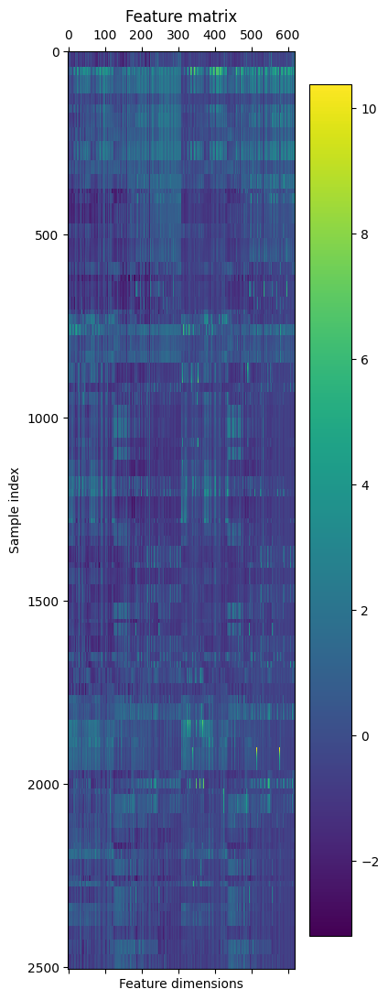

In [12]:
cp.cuda.Device(1).use()

args = get_seedIV_args()

device = get_device(args.bus_id, args.cuda_id[1])
setting_os_path(args.os_path)
# fix_random_variables(args.seed)


subject_de, subject_psd, subject_label, subject_sample_counts = load_subject_data(args.tensor_save_path, isdeap=False)

visualization_type = 1
for p in range(1,3):
    if p == 0:
        n_labels_by_class = args.n_labels_by_class3
    elif p == 1:
        n_labels_by_class = args.n_labels_by_class2
    else:
        n_labels_by_class = args.n_labels_by_class1
    
    best_epoch_list = []
    best_acc_list = []
    orig_acc_list = []


    print("========================================== SEED_IV Protocol {} ==========================================".format(int(n_labels_by_class)))

    for i in range(15):
        print("\n\n******************* SUBJECT : {} *********************".format(i+1))
        sub_idx = 'sub'+str(i+1)
        date = '230518'

        sub_de = subject_de[i]
        sub_psd = subject_psd[i]
        sub_label = subject_label[i]
        sub_sample_counts = subject_sample_counts[i]

        de, psd, identifier = other_preprocessing(sub_de,sub_psd,sub_label, n_labels_by_class, args.out_channels, args.seed)

        de = normalization(de, axis = 0, ntype='standardization')
        psd = normalization(psd, axis = 0, ntype='standardization')

        de_ssm, de_nssm = ssm_construction(de, args.n_samples, args.de_k)
        psd_ssm, psd_nssm = ssm_construction(psd, args.n_samples, args.psd_k)

        save_np(args.tensor_save_path+sub_idx, 'de_ssm_'+date, de_ssm)
        save_np(args.tensor_save_path+sub_idx, 'psd_ssm_'+date, psd_ssm)
        save_np(args.tensor_save_path+sub_idx, 'de_nssm_'+date, de_nssm)
        save_np(args.tensor_save_path+sub_idx, 'psd_nssm_'+date, psd_nssm)
        save_heatmap(de_ssm, "DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(psd_ssm, "PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(de_nssm, "DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
        save_heatmap(psd_nssm, "PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

        fsm = ssm_fusion(de_ssm,psd_ssm, de_nssm, psd_nssm, args.k1, args.t1)
        save_np(args.tensor_save_path+sub_idx, 'fused_ssm_'+date, fsm)
        save_heatmap(fsm, "Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

        adj = normalize_adj(fsm)
        save_np(args.tensor_save_path+sub_idx, 'adjacency_matrix_'+date, adj)
        save_heatmap(adj, "Normalized Adjacecy Matrix", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/adjacency_matrix/Adjacecny_Matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

        feature = input_feature(de, psd)
        label = sub_label

        save_heatmap(feature, "Feature matrix", "Feature dimensions", "Sample index", args.figure_save_path+'heatmap/'+sub_idx+'/feature/feature_matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight') 

        feature = torch.from_numpy(feature).to(torch.float32).to(device)
        adj = torch.from_numpy(adj).to(torch.float32).to(device)
        label = torch.from_numpy(label).to(torch.long).to(device)

        identifier = torch.from_numpy(identifier).bool()
        train_identifier = identifier.to(device)
        isunlabeled = ~identifier

        test_identifier = isunlabeled.to(device)

        activation = get_activation('celu')
        gcn = GraphConvolution

        encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
        model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
        optimizer = torch.optim.Adam(model.parameters(), lr = args.learning_rate)

        model, best_acc, best_epoch, best_model, best_z, result = GCA_train(model, optimizer, feature, adj, label,
                                                                            train_identifier, test_identifier,
                                                                            args,device,date,sub_idx, isdeap=False)

        experiment_type = 'subject_dependent'
        model_save_name = sub_idx+'_model'
        model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
        torch.save(model.state_dict(), model_path)
    
        print("*** Best ACC : {} , Best Epoch : {}***".format(round(best_acc.item(), 2), best_epoch))
        best_epoch_list.append(best_epoch)
        best_acc_list.append(round(best_acc.item(), 2))
        orig_acc_list.append(best_acc.item())


    #     sample = best_z.cpu().detach().numpy().copy()
    #     drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 4000)
    #     tsne_sample = StandardScaler().fit_transform(sample) # standardization
    #     dr_result = drmodel.fit_transform(tsne_sample)

    #     save_scatter(dr_result, label, best_acc.item(),sub_idx, date, args.figure_save_path, visualization_type, identifier)

    print("\n**************** Best acc by subject *********************")
    print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(best_acc_list, round(np.mean(orig_acc_list),2), round(np.std(orig_acc_list),2)))

    print("\n Best Epochs : {}".format(best_epoch_list))
    best_acc_list = np.array(best_acc_list)
    save_np(args.tensor_save_path+sub_idx, 'protocol '+str(n_labels_by_class)+'_best_acc_list_'+date, best_acc_list)

In [180]:
def drop_features2(probability_weights, features, threshold: float = 1.):

    probability_weights = probability_weights.where(probability_weights < threshold, torch.ones_like(probability_weights) * threshold) 
    drop_mask = torch.bernoulli(probability_weights).to(torch.bool)
    
    features_view = features.clone()
    features_view[:,drop_mask] = 0.

    return features_view

def edge_rank(edge_weights):
    edge_weights = edge_weights -torch.diag(edge_weights.diagonal())
    
    weight_max = edge_weights.max(axis=1).values
    weight_mean = edge_weights.sum(axis=1)/(edge_weights!=0).sum(axis=1)
    weights = (weight_max-edge_weights)/(weight_max-edge_weights.mean())
    weights -= torch.diag(weights.diagonal())
    return weights

def drop_edges2(probability_weights, edge_weights, threshold: float = 1.):
#     alleviated_weights = torch.log(edge_weights

    probability_weights = probability_weights.where(probability_weights < threshold, torch.ones_like(probability_weights) * threshold)
    drop_mask = torch.bernoulli(1. - probability_weights).to(torch.bool)
   
    edge_weights_view = edge_weights.where(drop_mask == True, torch.zeros_like(edge_weights))

    return edge_weights_view


def GCA_train2(model, otimizer, feature, orig_adj, label, train_identifier, test_identifier, args, device,date = None,sub_idx = None, isdeap=False ):
#     save_path = args.model_save_path+'subject_dependent/'+date+'/'+sub_idx+'.pt'
#     early_stopping = EarlyStopping(patience = args.patience, verbose = False, path=save_path)
    best_acc = 0
    best_epoch = 0
    best_model = None
    best_z = None
#     w = 0.5

    rankf = disc_rank(feature, label,train_identifier, args.out_channels)
    rankf1 = rankf*args.pf1
    rankf2 = rankf*args.pf2
#     ranke = edge_rank(adj)
#     ranke1 = ranke*args.pe1
#     ranke2 = ranke*args.pe2
    ranke = edge_mean_norm(adj)
    ranke1 = ranke*args.pe1
    ranke2 = ranke*args.pe2
    
    for epoch in range(1, args.epochs+1):
        model.train()
        optimizer.zero_grad()
        x1 = drop_features2(rankf1, feature, threshold = args.tpf1)
        x2 = drop_features2(rankf2, feature, threshold = args.tpf2)
#         e1 = drop_edges2(ranke1,orig_adj, threshold = args.tpe1)
#         e2 = drop_edges2(ranke2,orig_adj, threshold = args.tpe2)
        e1 = drop_edges(ranke1,orig_adj, threshold = args.tpe1)
        e2 = drop_edges(ranke2,orig_adj, threshold = args.tpe2)
        
#         x1 = drop_features(feature, adj, p = 0.1, threshold = args.tpf1)
#         x2 = drop_features(feature, adj, p = 0.2, threshold = args.tpf2)
#         e1 = drop_edges(adj, p = 0.1, threshold = args.tpe1)
#         e2 = drop_edges(adj, p = 0.2, threshold = args.tpe2)
        
        z1 = model(x1,e1) #,bias = True)
#         z1 = model(feature,adj)
        z1 = model.projection(z1)
        z2 = model(x2,e2)
        z2 = model.projection(z2)   
        
#         ne1 = model.decoder(z1)
#         ne2 = model.decoder(z2)
 
#         ne1 = (ne1-ne1.min())/(ne1.max()-ne1.min())
#         ne2 = (ne2-ne2.min())/(ne2.max()-ne2.min())
#         nadj1 = w*adj + (1.-w)*ne1
#         nadj2 = w*adj + (1.-w)*ne2
#         nadj = 0.5*(nadj1+nadj2)
#         print(nadj)
 
        r1 = model.classification(z1)
        r1_pred = r1[train_identifier]
        r1_y = label[train_identifier]
        # L2 regularization is not implemented yet
        labeled_loss1 = criterion(r1_pred, r1_y)
        r1_acc = accuracy(r1_pred, r1_y, isdeap)

        r2 = model.classification(z2)
        r2_pred = r2[train_identifier]
        r2_y = label[train_identifier]
        # L2 regularization is not implemented yet
        labeled_loss2 = criterion(r2_pred, r2_y)
        r2_acc = accuracy(r2_pred, r2_y, isdeap)

        
        contrastive_loss = model.loss(z1,z2)
#         print(contrastive_loss)
        loss = (labeled_loss1 + labeled_loss2)/2. + contrastive_loss*args.loss_lambda
#         loss = labeled_loss1 + contrastive_loss*args.loss_lambda

        loss.backward()
        optimizer.step()
        
#         orig_adj = nadj.detach().clone().to(device)
#         print(orig_adj)
#         adj = nadj.detach().clone().cuda()
        acc = (r1_acc + r2_acc)/2.
#         acc = r1_acc
        
        tr1_pred = r1[test_identifier]
        tr1_y = label[test_identifier]
        tr1_loss = criterion(tr1_pred, tr1_y)
        tr1_acc = accuracy(tr1_pred, tr1_y, isdeap)
        
        tr2_pred = r2[test_identifier]
        tr2_y = label[test_identifier]
        tr2_acc = accuracy(tr2_pred, tr2_y, isdeap)
        tr2_loss = criterion(tr2_pred, tr2_y)
        
#         tr_acc = (tr1_acc + tr2_acc)/2.
        if tr1_acc > tr2_acc:
            result = r1
            tr_acc = tr1_acc
        else:
            result = r2
            tr_acc = tr2_acc
        
        tr_loss = (tr1_loss + tr2_loss)/2.
        total_acc = (tr_acc + acc)/2.
        
        if tr_acc > best_acc :
            best_acc = tr_acc
            best_epoch = epoch
            best_model = model
            
            best_result = result
            best_z = z1 if tr1_acc > tr2_acc else z2


#         if epoch % 10 == 0:
#             print("Epoch {} - Train Acc : {}    Train Loss : {},    Test Acc : {},    Test Loss :{},    Total Acc : {}".format(epoch, round(acc.item(), 2), round(loss.item(),2), round(tr_acc.item(),2), round(tr_loss.item(),2), round(total_acc.item(), 2)))

#         early_stopping(vloss, model)
#         if early_stopping.early_stop:
#             print('Epoch : {} - Ealry Stopping'.format(epoch))
#             break
#     model.load_state_dict(torch.load(save_path))
    return model, best_acc, best_epoch, best_model, best_z, best_result


# GCAtrain2 + = pe, pf ablation
# Row max, mean without Self-similarity 

# Label 25

In [181]:
def edge_mean_norm(edge_weights):
    weight_max = edge_weights.max()
    weights = (weight_max-edge_weights)/(weight_max-edge_weights.mean())
    return weights

def drop_edges(probability_weights,edge_weights, threshold: float = 1.):
#     alleviated_weights = torch.log(edge_weights

    probability_weights = probability_weights.where(probability_weights < threshold, torch.ones_like(probability_weights) * threshold)
    drop_mask = torch.bernoulli(1. - probability_weights).to(torch.bool)
   
    edge_weights_view = edge_weights.where(drop_mask == True, torch.zeros_like(edge_weights))

    return edge_weights_view

Device: cuda
Current cuda device: 1
Count of using GPUs: 3


******************* SUBJECT : 8 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3654 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is s

<Figure size 640x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

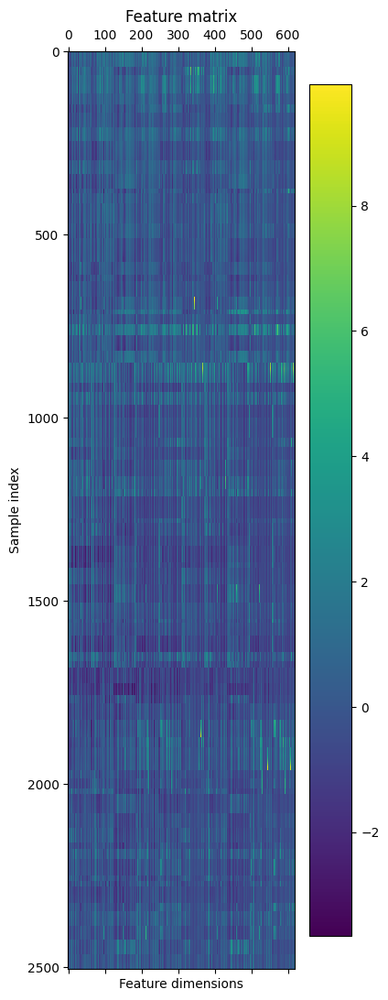

In [188]:
cp.cuda.Device(1).use()

args = get_seedIV_args()

device = get_device(args.bus_id, args.cuda_id[1])
setting_os_path(args.os_path)
# fix_random_variables(args.seed)


subject_de, subject_psd, subject_label, subject_sample_counts = load_subject_data(args.tensor_save_path, isdeap=False)
args.tpe1 = 1.
args.tpe2 = 1.
args.tpf1 = 1.
args.tpf2 = 1.

visualization_type = 1

best_epoch_list = []
best_acc_list = []
orig_acc_list = []
args.pe1 = 0.5
args.pe2 = 0.5
args.pf1 = 0.5
args.pf2 = 0.5
n_labels_by_class = args.n_labels_by_class3

for i in range(7,8):
    print("\n\n******************* SUBJECT : {} *********************".format(i+1))
    sub_idx = 'sub'+str(i+1)
    date = '230405'

    sub_de = subject_de[i]
    sub_psd = subject_psd[i]
    sub_label = subject_label[i]
    sub_sample_counts = subject_sample_counts[i]

    de, psd, identifier = other_preprocessing(sub_de,sub_psd,sub_label, n_labels_by_class, args.out_channels, args.seed)

    de = normalization(de, axis = 0, ntype='standardization')
    psd = normalization(psd, axis = 0, ntype='standardization')

    de_ssm, de_nssm = ssm_construction(de, args.n_samples, args.de_k)
    psd_ssm, psd_nssm = ssm_construction(psd, args.n_samples, args.psd_k)

    save_np(args.tensor_save_path+sub_idx, 'de_ssm_'+date, de_ssm)
    save_np(args.tensor_save_path+sub_idx, 'psd_ssm_'+date, psd_ssm)
    save_np(args.tensor_save_path+sub_idx, 'de_nssm_'+date, de_nssm)
    save_np(args.tensor_save_path+sub_idx, 'psd_nssm_'+date, psd_nssm)
    save_heatmap(de_ssm, "DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
    save_heatmap(psd_ssm, "PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
    save_heatmap(de_nssm, "DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
    save_heatmap(psd_nssm, "PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

    fsm = ssm_fusion(de_ssm,psd_ssm, de_nssm, psd_nssm, args.k1, args.t1)
    save_np(args.tensor_save_path+sub_idx, 'fused_ssm_'+date, fsm)
    save_heatmap(fsm, "Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

    adj = normalize_adj(fsm)
    save_np(args.tensor_save_path+sub_idx, 'adjacency_matrix_'+date, adj)
    save_heatmap(adj, "Normalized Adjacecy Matrix", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/adjacency_matrix/Adjacecny_Matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

    feature = input_feature(de, psd)
    label = sub_label

    save_heatmap(feature, "Feature matrix", "Feature dimensions", "Sample index", args.figure_save_path+'heatmap/'+sub_idx+'/feature/feature_matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight') 

    feature = torch.from_numpy(feature).to(torch.float32).to(device)
    adj = torch.from_numpy(adj).to(torch.float32).to(device)
    label = torch.from_numpy(label).to(torch.long).to(device)

    identifier = torch.from_numpy(identifier).bool()
    train_identifier = identifier.to(device)
    isunlabeled = ~identifier

    test_identifier = isunlabeled.to(device)

    activation = get_activation('celu')
    gcn = GraphConvolution

    encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
    model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = args.learning_rate)

    model, best_acc, best_epoch, best_model, best_z, result = GCA_train2(model, optimizer, feature, adj, label,
                                                                        train_identifier, test_identifier,
                                                                        args,device,date,sub_idx, isdeap=False)

    experiment_type = 'subject_dependent'
    model_save_name = sub_idx+'_model'
    model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
    torch.save(model.state_dict(), model_path)

    print("*** Best ACC : {} , Best Epoch : {}***".format(round(best_acc.item(), 2), best_epoch))
    best_epoch_list.append(best_epoch)
    best_acc_list.append(round(best_acc.item(), 2))
    orig_acc_list.append(best_acc.item())


#     sample = best_z.cpu().detach().numpy().copy()
#     drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 4000)
#     tsne_sample = StandardScaler().fit_transform(sample) # standardization
#     dr_result = drmodel.fit_transform(tsne_sample)

#     save_scatter(dr_result, label, best_acc.item(),sub_idx, date, args.figure_save_path, visualization_type, identifier)

print("\n**************** Best acc by subject *********************")
print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(best_acc_list, round(np.mean(orig_acc_list),2), round(np.std(orig_acc_list),2)))


In [26]:
def save_scatter_seedIV(result, label, best_acc,sub_idx, date, save_path, dr_type, iden):
    nw = np.where(label.cpu()==0)[0]
    sw = np.where(label.cpu()==1)[0]
    fw = np.where(label.cpu()==2)[0]
    hw = np.where(label.cpu()==3)[0]
    if dr_type == 0:
        dr_name = 'PCA'
    elif dr_type == 1:
        dr_name = 'TSNE'
    else:
        dr_name = ''
    
    n = result[nw,:]
    s = result[sw,:]
    f = result[fw,:]
    h = result[hw,:]

    gts = np.where(iden.cpu().numpy() ==True)[0]

    ngtw, sgtw, fgtw, hgtw = [], [], [], []
    for i in gts:
        if i in nw:
            ngtw.append(i)
        elif i in sw:
            sgtw.append(i)
        elif i in fw:
            fgtw.append(i)
        else:
            hgtw.append(i)

    ngt = result[ngtw,:]
    sgt = result[sgtw,:]
    fgt = result[fgtw,:]
    hgt = result[hgtw,:]
    
    plt.clf()
    c1 = plt.scatter(n[:,0], n[:,1], marker = "o", color='#999999',s=1.)
    gt1 = plt.scatter(ngt[:,0], ngt[:,1], marker = "x", color='black',s=2.)
    c2 = plt.scatter(s[:,0], s[:,1], marker = "o",color ='#CCFF66', s=1.)
    gt2 = plt.scatter(sgt[:,0], sgt[:,1], marker = "x", color='green',s=2.)
    c3 = plt.scatter(f[:,0], f[:,1], marker = "o",color ='#FF6600', s=1.)
    gt3 = plt.scatter(fgt[:,0], fgt[:,1], marker = "x", color='red',s=2.)
    c4 =plt.scatter(h[:,0], h[:,1], marker = "o",color ='#33CCFF', s=1.)
    gt4 = plt.scatter(hgt[:,0], hgt[:,1], marker = "x", color='blue',s=2.)
    plt.title('Classfication result of '+sub_idx + ' - Acc : '+ str(best_acc) +'%')
    plt.xlabel("Reduced axis - 1")
    plt.ylabel("Reduced axis - 2")
    plt.legend(handles = (c1,c2,c3,c4, gt1,gt2,gt3,gt4),labels=("neutral","sad", "fear", "happy", "neutral - gt","sad - gt", "fear - gt", "happy - gt"))
    plt.savefig(save_path+'test_result/'+sub_idx+'/'+dr_name+'_classification_result_scatter_'+date+'.png', dpi=300, facecolor = "#eeeeee", bbox_inches = 'tight')
    return

In [189]:
sample = best_z.detach().cpu().numpy()
drmodel = umap_.UMAP(n_neighbors = 200, n_components = 2, min_dist = 0.1)
umap_sample = StandardScaler().fit_transform(sample) # standardization
dr_result = drmodel.fit_transform(umap_sample)

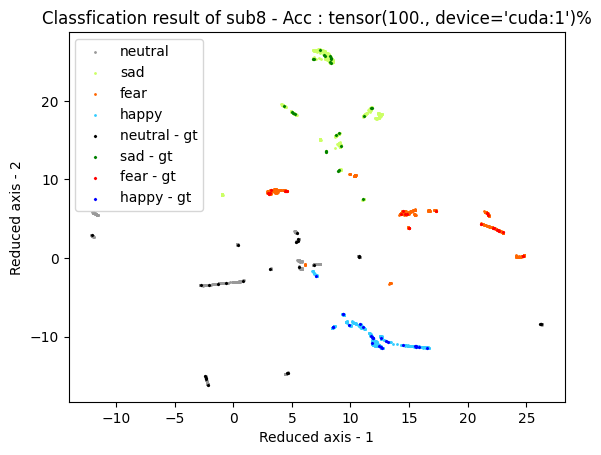

In [190]:
save_scatter_seedIV(dr_result, label, best_acc, sub_idx, date, args.figure_save_path, 1, train_identifier)

In [ ]:

visualization_type = 1
sample = best_z.detach().cpu().numpy()
drmodel = TSNE(n_components = 2, perplexity = 200., n_iter = 4000,learning_rate=200)
tsne_sample = StandardScaler().fit_transform(sample) # standardization
dr_result = drmodel.fit_transform(tsne_sample)


In [ ]:
sample = best_z.detach().cpu().numpy()
drmodel = umap_.UMAP(n_neighbors = 50, n_components = 2)
umap_sample = StandardScaler().fit_transform(sample) # standardization
dr_result = drmodel.fit(umap_sample)

umap.plot.points(dr_result, labels = label.detach().cpu().numpy())

In [95]:
save_np(args.tensor_save_path, 'ablation3/case8/sub8_case8_embedding.npy',dr_result)
save_np(args.tensor_save_path, 'ablation3/case8/sub8_case8_best_acc.npy',best_acc.item())

directory already exists
ablation3/case8/sub8_case8_embedding.npy is saved successfully


In [11]:
cp.cuda.Device(1).use()

args = get_seedIV_args()

device = get_device(args.bus_id, args.cuda_id[1])
setting_os_path(args.os_path)
# fix_random_variables(args.seed)


subject_de, subject_psd, subject_label, subject_sample_counts = load_subject_data(args.tensor_save_path, isdeap=False)
args.tpe1 = 1.
args.tpe2 = 1.
args.tpf1 = 1.
args.tpf2 = 1.

visualization_type = 1
for p in range(1):
    if p == 0:
        n_labels_by_class = args.n_labels_by_class3
    elif p == 1:
        n_labels_by_class = args.n_labels_by_class2
    else:
        n_labels_by_class = args.n_labels_by_class1
    



    print("========================================== SEED_IV Protocol {} ==========================================".format(int(n_labels_by_class)))
    Best_EF_acc = [[0 for _ in range(9)] for _ in range(9)]
    Best_EF_std = [[0 for _ in range(9)] for _ in range(9)]
    for e in range(1,10):
        for f in range(1,10):
            print("+++++++++++++++++++++++++++ Pe: {}, Pf:{} +++++++++++++++++++++++++++++++++++".format(e/10,f/10))
        
            best_epoch_list = []
            best_acc_list = []
            orig_acc_list = []
            args.pe1 = e/10
            args.pe2 = e/10
            args.pf1 = f/10
            args.pf2 = f/10
            for i in range(15):
                print("\n\n******************* SUBJECT : {} *********************".format(i+1))
                sub_idx = 'sub'+str(i+1)
                date = '230405'

                sub_de = subject_de[i]
                sub_psd = subject_psd[i]
                sub_label = subject_label[i]
                sub_sample_counts = subject_sample_counts[i]

                de, psd, identifier = other_preprocessing(sub_de,sub_psd,sub_label, n_labels_by_class, args.out_channels, args.seed)

                de = normalization(de, axis = 0, ntype='standardization')
                psd = normalization(psd, axis = 0, ntype='standardization')

                de_ssm, de_nssm = ssm_construction(de, args.n_samples, args.de_k)
                psd_ssm, psd_nssm = ssm_construction(psd, args.n_samples, args.psd_k)

                save_np(args.tensor_save_path+sub_idx, 'de_ssm_'+date, de_ssm)
                save_np(args.tensor_save_path+sub_idx, 'psd_ssm_'+date, psd_ssm)
                save_np(args.tensor_save_path+sub_idx, 'de_nssm_'+date, de_nssm)
                save_np(args.tensor_save_path+sub_idx, 'psd_nssm_'+date, psd_nssm)
                save_heatmap(de_ssm, "DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
                save_heatmap(psd_ssm, "PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
                save_heatmap(de_nssm, "DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
                save_heatmap(psd_nssm, "PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

                fsm = ssm_fusion(de_ssm,psd_ssm, de_nssm, psd_nssm, args.k1, args.t1)
                save_np(args.tensor_save_path+sub_idx, 'fused_ssm_'+date, fsm)
                save_heatmap(fsm, "Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

                adj = normalize_adj(fsm)
                save_np(args.tensor_save_path+sub_idx, 'adjacency_matrix_'+date, adj)
                save_heatmap(adj, "Normalized Adjacecy Matrix", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/adjacency_matrix/Adjacecny_Matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

                feature = input_feature(de, psd)
                label = sub_label

                save_heatmap(feature, "Feature matrix", "Feature dimensions", "Sample index", args.figure_save_path+'heatmap/'+sub_idx+'/feature/feature_matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight') 

                feature = torch.from_numpy(feature).to(torch.float32).to(device)
                adj = torch.from_numpy(adj).to(torch.float32).to(device)
                label = torch.from_numpy(label).to(torch.long).to(device)

                identifier = torch.from_numpy(identifier).bool()
                train_identifier = identifier.to(device)
                isunlabeled = ~identifier

                test_identifier = isunlabeled.to(device)

                activation = get_activation('celu')
                gcn = GraphConvolution

                encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
                model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
                optimizer = torch.optim.Adam(model.parameters(), lr = args.learning_rate)

                model, best_acc, best_epoch, best_model, best_z, result = GCA_train2(model, optimizer, feature, adj, label,
                                                                                    train_identifier, test_identifier,
                                                                                    args,device,date,sub_idx, isdeap=False)

                experiment_type = 'subject_dependent'
                model_save_name = sub_idx+'_model'
                model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
                torch.save(model.state_dict(), model_path)

                print("*** Best ACC : {} , Best Epoch : {}***".format(round(best_acc.item(), 2), best_epoch))
                best_epoch_list.append(best_epoch)
                best_acc_list.append(round(best_acc.item(), 2))
                orig_acc_list.append(best_acc.item())


            #     sample = best_z.cpu().detach().numpy().copy()
            #     drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 4000)
            #     tsne_sample = StandardScaler().fit_transform(sample) # standardization
            #     dr_result = drmodel.fit_transform(tsne_sample)

            #     save_scatter(dr_result, label, best_acc.item(),sub_idx, date, args.figure_save_path, visualization_type, identifier)

            print("\n**************** Best acc by subject *********************")
            print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(best_acc_list, round(np.mean(orig_acc_list),2), round(np.std(orig_acc_list),2)))

            Best_EF_acc[e-1][f-1] = round(np.mean(orig_acc_list),2)
            Best_EF_std[e-1][f-1] = round(np.std(orig_acc_list),2)
            print("\n Best Epochs : {}".format(best_epoch_list))
            best_acc_list = np.array(best_acc_list)
            save_np(args.tensor_save_path+sub_idx, 'protocol '+str(n_labels_by_class)+'_best_acc_list_'+date, best_acc_list)

Device: cuda
Current cuda device: 1
Count of using GPUs: 3
========================================== SEED_IV Protocol 25 ==========================================
+++++++++++++++++++++++++++ Pe: 0.1, Pf:0.1 +++++++++++++++++++++++++++++++++++


******************* SUBJECT : 1 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature 

/tmp/ipykernel_5248/4212163399.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.matshow(matrix)


*** Best ACC : 94.8 , Best Epoch : 2899***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3581 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfull

sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3534 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.97 , Best Epoch : 714***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_n

directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 95.3 , Best Epoch : 165***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3552 sec
Done
***************************************


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3662 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.22 , Best Epoch : 561***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3511 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.05 , Best Epoch : 399***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2962 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 95.63 , Best Epoch : 182***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3363 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 93.8 , Best Epoch : 564***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3483 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.22 , Best Epoch : 559***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3425 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 93.26 , Best Epoch : 203***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3555 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.8 , Best Epoch : 986***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved suc

0.3364 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 92.6 , Best Epoch : 187***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3450 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 95.93 , Best Epoch : 1223***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.3477 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 92.1 , Best Epoch : 485***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3398 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.51 , Best Epoch : 1144***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.3152 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 92.06 , Best Epoch : 996***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3459 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 92.68 , Best Epoch : 500***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3427 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.02 , Best Epoch : 629***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3488 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.77 , Best Epoch : 2616***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.3554 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.51 , Best Epoch : 145***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3502 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.89 , Best Epoch : 115***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory alr

0.3507 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 93.56 , Best Epoch : 814***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2971 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 97.17 , Best Epoch : 359***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3211 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.84 , Best Epoch : 594***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3260 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.22 , Best Epoch : 110***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory alr

0.3364 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 93.01 , Best Epoch : 223***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3460 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.22 , Best Epoch : 2253***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory al

0.2719 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 93.39 , Best Epoch : 637***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3658 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.22 , Best Epoch : 828***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory alr

0.3745 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 92.47 , Best Epoch : 176***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3422 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.22 , Best Epoch : 398***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3566 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 92.02 , Best Epoch : 131***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3667 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.01 , Best Epoch : 636***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3421 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 92.31 , Best Epoch : 740***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3417 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 92.68 , Best Epoch : 594***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory alr

0.3389 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.56 , Best Epoch : 2151***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3395 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.77 , Best Epoch : 2457***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.3410 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.35 , Best Epoch : 671***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3524 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 95.38 , Best Epoch : 376***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3517 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.72 , Best Epoch : 155***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3341 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.89 , Best Epoch : 384***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3589 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.35 , Best Epoch : 290***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3352 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.76 , Best Epoch : 219***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3504 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 93.01 , Best Epoch : 139***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3396 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.22 , Best Epoch : 218***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3580 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.35 , Best Epoch : 297***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3462 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.22 , Best Epoch : 636***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3337 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 92.14 , Best Epoch : 240***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3520 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.35 , Best Epoch : 2838***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory al

0.3492 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 91.43 , Best Epoch : 882***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3190 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.18 , Best Epoch : 1727***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory al

0.3492 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 91.68 , Best Epoch : 514***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3604 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.35 , Best Epoch : 2792***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.3239 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.69 , Best Epoch : 2151***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3417 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.64 , Best Epoch : 1570***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.3482 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.26 , Best Epoch : 407***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3372 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.22 , Best Epoch : 32***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved suc

0.2530 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.76 , Best Epoch : 2524***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3595 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.22 , Best Epoch : 376***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3409 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.22 , Best Epoch : 156***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2577 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.97 , Best Epoch : 1765***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory al

0.3474 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 93.8 , Best Epoch : 167***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2609 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.22 , Best Epoch : 491***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory alr

0.3597 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.26 , Best Epoch : 309***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3337 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.22 , Best Epoch : 1359***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.3237 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 92.77 , Best Epoch : 506***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3500 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 95.68 , Best Epoch : 1227***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.3373 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 92.52 , Best Epoch : 1330***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3765 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.43 , Best Epoch : 370***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3398 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 91.64 , Best Epoch : 996***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3494 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 93.6 , Best Epoch : 500***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory alre

0.3408 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.15 , Best Epoch : 791***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3479 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.4 , Best Epoch : 1001***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3538 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 95.3 , Best Epoch : 460***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3385 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 95.8 , Best Epoch : 33***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved succ

0.3539 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.84 , Best Epoch : 245***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3565 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 95.34 , Best Epoch : 1901***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory al

0.3641 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.47 , Best Epoch : 263***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3710 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 95.88 , Best Epoch : 1917***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.3253 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.26 , Best Epoch : 1291***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3512 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.22 , Best Epoch : 144***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3534 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 92.14 , Best Epoch : 506***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3501 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.51 , Best Epoch : 769***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory alr

0.3601 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 92.27 , Best Epoch : 192***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3418 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.22 , Best Epoch : 789***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory alr

0.3543 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 93.18 , Best Epoch : 783***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2625 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.47 , Best Epoch : 187***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory alr

0.2864 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 92.68 , Best Epoch : 1613***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3574 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 93.1 , Best Epoch : 1559***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2479 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.94 , Best Epoch : 2596***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3457 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.85 , Best Epoch : 1870***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory al

0.3414 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.97 , Best Epoch : 112***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3631 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.22 , Best Epoch : 33***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved suc

0.2366 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.35 , Best Epoch : 133***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3119 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.39 , Best Epoch : 107***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2623 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.35 , Best Epoch : 381***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2312 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.97 , Best Epoch : 2478***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory al

0.3507 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.72 , Best Epoch : 160***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3375 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.22 , Best Epoch : 1150***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.3284 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 93.51 , Best Epoch : 362***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3676 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.22 , Best Epoch : 697***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3584 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 92.93 , Best Epoch : 1941***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3606 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.22 , Best Epoch : 2311***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.3367 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 91.27 , Best Epoch : 1128***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3512 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.47 , Best Epoch : 187***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory alr

0.3085 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 91.64 , Best Epoch : 2145***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3469 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 92.68 , Best Epoch : 520***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3363 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 91.35 , Best Epoch : 653***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3321 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.98 , Best Epoch : 2250***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory al

0.3529 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.35 , Best Epoch : 775***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3426 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.3 , Best Epoch : 35***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved succ

0.3441 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.35 , Best Epoch : 999***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3340 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 95.63 , Best Epoch : 553***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory alr

0.3430 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.1 , Best Epoch : 343***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3868 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 95.43 , Best Epoch : 110***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory alr

0.3578 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.22 , Best Epoch : 715***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3263 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.22 , Best Epoch : 514***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3196 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 93.18 , Best Epoch : 599***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3598 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.05 , Best Epoch : 1115***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2838 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 92.97 , Best Epoch : 425***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3361 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.59 , Best Epoch : 345***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory alr

0.3614 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 92.18 , Best Epoch : 1164***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3485 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.26 , Best Epoch : 1918***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory al

0.3348 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 91.56 , Best Epoch : 2834***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3420 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 93.14 , Best Epoch : 500***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory alr

0.3523 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 91.1 , Best Epoch : 2002***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2603 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.73 , Best Epoch : 1518***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory al

0.3363 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 95.3 , Best Epoch : 225***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3654 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 95.55 , Best Epoch : 903***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3561 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.93 , Best Epoch : 273***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3609 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.68 , Best Epoch : 59***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved suc

0.3684 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 95.14 , Best Epoch : 318***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3103 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.22 , Best Epoch : 135***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3489 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 93.68 , Best Epoch : 623***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3520 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 95.72 , Best Epoch : 300***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3585 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 93.14 , Best Epoch : 309***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2545 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.05 , Best Epoch : 1881***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory al

0.3166 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 92.64 , Best Epoch : 2874***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3514 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.89 , Best Epoch : 295***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory alr

0.3598 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 91.81 , Best Epoch : 764***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3296 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.01 , Best Epoch : 332***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory alr

0.2799 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 92.6 , Best Epoch : 1149***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3429 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 93.1 , Best Epoch : 817***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory alre

0.3269 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 91.27 , Best Epoch : 2596***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3671 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.6 , Best Epoch : 2549***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory alr

0.3369 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 95.3 , Best Epoch : 90***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based 


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3398 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.8 , Best Epoch : 35***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved succ

0.3315 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.68 , Best Epoch : 622***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3127 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 95.34 , Best Epoch : 89***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory alre

0.2629 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.14 , Best Epoch : 478***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3470 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.8 , Best Epoch : 1734***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory alr

0.3528 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 93.68 , Best Epoch : 364***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3573 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 96.22 , Best Epoch : 1753***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.3392 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 93.26 , Best Epoch : 309***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3478 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 95.47 , Best Epoch : 235***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory alr

0.2490 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.14 , Best Epoch : 430***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3787 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.43 , Best Epoch : 2742***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.3510 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 93.6 , Best Epoch : 1336***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2518 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 94.97 , Best Epoch : 699***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory alr

0.3445 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 92.1 , Best Epoch : 2827***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3561 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 93.47 , Best Epoch : 1685***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory al

0.3410 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.27 , Best Epoch : 782***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2462 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.94 , Best Epoch : 1518***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory al

<Figure size 640x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [14]:
Best_EF_acc

[[95.8, 96.24, 96.57, 96.79, 96.75, 96.6, 96.52, 96.47, 95.84],
 [95.73, 96.35, 96.74, 96.71, 96.81, 96.79, 96.65, 96.37, 96.09],
 [95.6, 96.34, 96.59, 96.68, 96.96, 96.65, 96.45, 96.48, 95.79],
 [95.81, 96.14, 96.5, 97.04, 96.65, 96.81, 96.77, 96.65, 96.08],
 [96.02, 96.5, 96.78, 96.97, 96.73, 96.88, 96.49, 96.67, 95.91],
 [96.21, 96.35, 96.34, 96.73, 96.74, 96.75, 96.72, 96.26, 96.12],
 [95.88, 96.46, 96.76, 96.65, 96.51, 96.53, 96.59, 96.39, 95.99],
 [95.87, 96.24, 96.69, 96.57, 96.69, 96.47, 96.74, 96.72, 96.08],
 [96.11, 96.46, 96.78, 96.76, 96.52, 96.57, 96.62, 96.35, 96.09]]

In [16]:
Best_EF_std

[[1.74, 1.4, 1.93, 1.59, 1.95, 1.88, 2.21, 2.28, 2.66],
 [1.84, 1.55, 1.62, 1.7, 1.77, 2.02, 2.19, 2.17, 2.68],
 [1.86, 1.71, 1.55, 2.07, 1.95, 2.08, 2.17, 2.16, 2.59],
 [1.68, 1.9, 1.87, 1.78, 1.62, 2.03, 2.14, 2.15, 2.79],
 [1.66, 1.56, 1.42, 1.56, 2.07, 2.04, 1.98, 2.23, 2.71],
 [1.71, 1.81, 1.8, 1.54, 1.83, 1.75, 2.12, 2.35, 2.68],
 [1.84, 1.76, 1.66, 1.43, 1.74, 1.87, 2.2, 2.33, 2.65],
 [1.59, 1.75, 1.58, 1.77, 1.79, 2.02, 2.27, 2.28, 2.66],
 [1.78, 1.63, 1.75, 1.84, 1.8, 1.85, 1.9, 2.11, 2.86]]

In [28]:
for e in range(9):
    for f in range(9):
        print("\n****** Pe: {}, Pf: {}*****".format((e+1)/10, (f+1)/10))
        print("Acc : {}, Std : {}".format(Best_EF_acc[e][f],Best_EF_std[e][f]))
        


****** Pe: 0.1, Pf: 0.1*****
Acc : 95.8, Std : 1.74

****** Pe: 0.1, Pf: 0.2*****
Acc : 96.24, Std : 1.4

****** Pe: 0.1, Pf: 0.3*****
Acc : 96.57, Std : 1.93

****** Pe: 0.1, Pf: 0.4*****
Acc : 96.79, Std : 1.59

****** Pe: 0.1, Pf: 0.5*****
Acc : 96.75, Std : 1.95

****** Pe: 0.1, Pf: 0.6*****
Acc : 96.51, Std : 1.9

****** Pe: 0.1, Pf: 0.7*****
Acc : 96.54, Std : 1.91

****** Pe: 0.1, Pf: 0.8*****
Acc : 96.86, Std : 1.92

****** Pe: 0.1, Pf: 0.9*****
Acc : 96.18, Std : 1.88

****** Pe: 0.2, Pf: 0.1*****
Acc : 95.73, Std : 1.84

****** Pe: 0.2, Pf: 0.2*****
Acc : 96.35, Std : 1.55

****** Pe: 0.2, Pf: 0.3*****
Acc : 96.74, Std : 1.62

****** Pe: 0.2, Pf: 0.4*****
Acc : 96.71, Std : 1.7

****** Pe: 0.2, Pf: 0.5*****
Acc : 96.81, Std : 1.77

****** Pe: 0.2, Pf: 0.6*****
Acc : 96.76, Std : 1.98

****** Pe: 0.2, Pf: 0.7*****
Acc : 96.6, Std : 2.11

****** Pe: 0.2, Pf: 0.8*****
Acc : 96.66, Std : 1.98

****** Pe: 0.2, Pf: 0.9*****
Acc : 96.51, Std : 2.16

****** Pe: 0.3, Pf: 0.1*****
Acc

# Label 20

In [20]:
cp.cuda.Device(1).use()

args = get_seedIV_args()

device = get_device(args.bus_id, args.cuda_id[1])
setting_os_path(args.os_path)
# fix_random_variables(args.seed)


subject_de, subject_psd, subject_label, subject_sample_counts = load_subject_data(args.tensor_save_path, isdeap=False)
args.tpe1 = 1.
args.tpe2 = 1.
args.tpf1 = 1.
args.tpf2 = 1.

visualization_type = 1
for p in range(1):
    if p == 0:
        n_labels_by_class = args.n_labels_by_class2
    elif p == 1:
        n_labels_by_class = args.n_labels_by_class2
    else:
        n_labels_by_class = args.n_labels_by_class1
    



    print("========================================== SEED_IV Protocol {} ==========================================".format(int(n_labels_by_class)))
    Best_EF_acc2 = [[0 for _ in range(9)] for _ in range(9)]
    Best_EF_std2 = [[0 for _ in range(9)] for _ in range(9)]
    for e in range(1,10):
        for f in range(1,10):
            print("+++++++++++++++++++++++++++ Pe: {}, Pf:{} +++++++++++++++++++++++++++++++++++".format(e/10,f/10))
        
            best_epoch_list = []
            best_acc_list = []
            orig_acc_list = []
            args.pe1 = e/10
            args.pe2 = e/10
            args.pf1 = f/10
            args.pf2 = f/10
            for i in range(15):
                print("\n\n******************* SUBJECT : {} *********************".format(i+1))
                sub_idx = 'sub'+str(i+1)
                date = '230405'

                sub_de = subject_de[i]
                sub_psd = subject_psd[i]
                sub_label = subject_label[i]
                sub_sample_counts = subject_sample_counts[i]

                de, psd, identifier = other_preprocessing(sub_de,sub_psd,sub_label, n_labels_by_class, args.out_channels, args.seed)

                de = normalization(de, axis = 0, ntype='standardization')
                psd = normalization(psd, axis = 0, ntype='standardization')

                de_ssm, de_nssm = ssm_construction(de, args.n_samples, args.de_k)
                psd_ssm, psd_nssm = ssm_construction(psd, args.n_samples, args.psd_k)

                save_np(args.tensor_save_path+sub_idx, 'de_ssm_'+date, de_ssm)
                save_np(args.tensor_save_path+sub_idx, 'psd_ssm_'+date, psd_ssm)
                save_np(args.tensor_save_path+sub_idx, 'de_nssm_'+date, de_nssm)
                save_np(args.tensor_save_path+sub_idx, 'psd_nssm_'+date, psd_nssm)
                save_heatmap(de_ssm, "DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
                save_heatmap(psd_ssm, "PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
                save_heatmap(de_nssm, "DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
                save_heatmap(psd_nssm, "PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

                fsm = ssm_fusion(de_ssm,psd_ssm, de_nssm, psd_nssm, args.k1, args.t1)
                save_np(args.tensor_save_path+sub_idx, 'fused_ssm_'+date, fsm)
                save_heatmap(fsm, "Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

                adj = normalize_adj(fsm)
                save_np(args.tensor_save_path+sub_idx, 'adjacency_matrix_'+date, adj)
                save_heatmap(adj, "Normalized Adjacecy Matrix", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/adjacency_matrix/Adjacecny_Matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

                feature = input_feature(de, psd)
                label = sub_label

                save_heatmap(feature, "Feature matrix", "Feature dimensions", "Sample index", args.figure_save_path+'heatmap/'+sub_idx+'/feature/feature_matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight') 

                feature = torch.from_numpy(feature).to(torch.float32).to(device)
                adj = torch.from_numpy(adj).to(torch.float32).to(device)
                label = torch.from_numpy(label).to(torch.long).to(device)

                identifier = torch.from_numpy(identifier).bool()
                train_identifier = identifier.to(device)
                isunlabeled = ~identifier

                test_identifier = isunlabeled.to(device)

                activation = get_activation('celu')
                gcn = GraphConvolution

                encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
                model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
                optimizer = torch.optim.Adam(model.parameters(), lr = args.learning_rate)

                model, best_acc, best_epoch, best_model, best_z, result = GCA_train2(model, optimizer, feature, adj, label,
                                                                                    train_identifier, test_identifier,
                                                                                    args,device,date,sub_idx, isdeap=False)

                experiment_type = 'subject_dependent'
                model_save_name = sub_idx+'_model'
                model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
                torch.save(model.state_dict(), model_path)

                print("*** Best ACC : {} , Best Epoch : {}***".format(round(best_acc.item(), 2), best_epoch))
                best_epoch_list.append(best_epoch)
                best_acc_list.append(round(best_acc.item(), 2))
                orig_acc_list.append(best_acc.item())


            #     sample = best_z.cpu().detach().numpy().copy()
            #     drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 4000)
            #     tsne_sample = StandardScaler().fit_transform(sample) # standardization
            #     dr_result = drmodel.fit_transform(tsne_sample)

            #     save_scatter(dr_result, label, best_acc.item(),sub_idx, date, args.figure_save_path, visualization_type, identifier)

            print("\n**************** Best acc by subject *********************")
            print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(best_acc_list, round(np.mean(orig_acc_list),2), round(np.std(orig_acc_list),2)))

            Best_EF_acc2[e-1][f-1] = round(np.mean(orig_acc_list),2)
            Best_EF_std2[e-1][f-1] = round(np.std(orig_acc_list),2)
            print("\n Best Epochs : {}".format(best_epoch_list))
            best_acc_list = np.array(best_acc_list)
            save_np(args.tensor_save_path+sub_idx, 'protocol '+str(n_labels_by_class)+'_best_acc_list_'+date, best_acc_list)

Device: cuda
Current cuda device: 1
Count of using GPUs: 3
========================================== SEED_IV Protocol 20 ==========================================
+++++++++++++++++++++++++++ Pe: 0.1, Pf:0.1 +++++++++++++++++++++++++++++++++++


******************* SUBJECT : 1 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature 

/tmp/ipykernel_5248/4212163399.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.matshow(matrix)


*** Best ACC : 85.61 , Best Epoch : 1108***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2592 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successful

sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2617 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.35 , Best Epoch : 2909***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_

directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.7 , Best Epoch : 2412***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2625 sec
Done
**************************************


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2395 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.15 , Best Epoch : 2523***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2934 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.86 , Best Epoch : 1755***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2632 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.86 , Best Epoch : 1345***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2764 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.36 , Best Epoch : 477***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2604 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.6 , Best Epoch : 222***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved suc

0.2661 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.58 , Best Epoch : 2736***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2678 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.57 , Best Epoch : 2891***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2722 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.49 , Best Epoch : 1572***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2639 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.4 , Best Epoch : 191***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved suc

0.2669 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.87 , Best Epoch : 810***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2696 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 88.87 , Best Epoch : 212***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2615 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.66 , Best Epoch : 666***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2558 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.38 , Best Epoch : 2569***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2574 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 83.96 , Best Epoch : 555***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2582 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.14 , Best Epoch : 2114***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2582 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.36 , Best Epoch : 1226***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2669 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.02 , Best Epoch : 25***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved suc

0.2710 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.98 , Best Epoch : 54***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2590 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.27 , Best Epoch : 2717***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2650 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.99 , Best Epoch : 860***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2598 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.53 , Best Epoch : 982***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2651 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.99 , Best Epoch : 1245***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2624 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 88.49 , Best Epoch : 2477***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2627 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.4 , Best Epoch : 851***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2688 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.69 , Best Epoch : 552***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2620 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.49 , Best Epoch : 1705***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2975 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.1 , Best Epoch : 401***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved suc

0.2711 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.35 , Best Epoch : 1198***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2411 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.77 , Best Epoch : 1976***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2350 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.41 , Best Epoch : 721***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2729 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.09 , Best Epoch : 1694***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2772 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 83.88 , Best Epoch : 583***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2849 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.64 , Best Epoch : 898***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2767 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.7 , Best Epoch : 49***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based 


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2752 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.09 , Best Epoch : 250***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2721 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.52 , Best Epoch : 1242***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2615 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 88.37 , Best Epoch : 61***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved suc

0.2623 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.43 , Best Epoch : 722***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2530 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.9 , Best Epoch : 2471***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2572 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 83.38 , Best Epoch : 1750***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2594 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.76 , Best Epoch : 329***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2607 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.99 , Best Epoch : 216***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2674 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 91.01 , Best Epoch : 216***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2656 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.77 , Best Epoch : 2291***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2629 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 88.7 , Best Epoch : 2483***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2666 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.87 , Best Epoch : 2256***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2686 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.03 , Best Epoch : 2606***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2608 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.98 , Best Epoch : 2002***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2713 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.3 , Best Epoch : 1066***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2689 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.44 , Best Epoch : 476***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2558 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.1 , Best Epoch : 2945***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2517 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.09 , Best Epoch : 2100***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2581 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.34 , Best Epoch : 150***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2579 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.99 , Best Epoch : 2390***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2686 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.15 , Best Epoch : 2814***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2560 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.19 , Best Epoch : 1121***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2555 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.68 , Best Epoch : 143***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2552 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.74 , Best Epoch : 2057***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2595 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.24 , Best Epoch : 263***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2578 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.2 , Best Epoch : 350***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2630 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 88.95 , Best Epoch : 1614***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2590 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.57 , Best Epoch : 735***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2656 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 88.74 , Best Epoch : 2200***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2708 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.36 , Best Epoch : 451***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2654 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 88.95 , Best Epoch : 92***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved suc

0.2516 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.7 , Best Epoch : 1572***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2576 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.92 , Best Epoch : 1055***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2527 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 83.92 , Best Epoch : 648***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2554 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.81 , Best Epoch : 1630***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2636 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.7 , Best Epoch : 74***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based 


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2619 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.79 , Best Epoch : 2933***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.3024 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.61 , Best Epoch : 1059***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2595 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.76 , Best Epoch : 2331***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2677 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.05 , Best Epoch : 604***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2612 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.14 , Best Epoch : 2375***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2481 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.91 , Best Epoch : 815***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2592 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.1 , Best Epoch : 1812***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2532 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.8 , Best Epoch : 966***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2564 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.27 , Best Epoch : 1304***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2266 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.39 , Best Epoch : 1140***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2531 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.4 , Best Epoch : 237***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved suc

0.2525 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.36 , Best Epoch : 943***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2589 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.48 , Best Epoch : 212***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2603 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.99 , Best Epoch : 1047***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2553 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.97 , Best Epoch : 673***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2588 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.45 , Best Epoch : 2215***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2659 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.43 , Best Epoch : 1824***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2662 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.07 , Best Epoch : 48***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2683 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 88.25 , Best Epoch : 201***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2648 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.52 , Best Epoch : 2217***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2650 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 88.33 , Best Epoch : 948***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2626 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.52 , Best Epoch : 527***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2449 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.85 , Best Epoch : 335***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2518 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.91 , Best Epoch : 1141***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2713 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 91.38 , Best Epoch : 1646***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2569 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 83.92 , Best Epoch : 2437***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2594 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 91.26 , Best Epoch : 970***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2517 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.91 , Best Epoch : 1574***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2520 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.4 , Best Epoch : 191***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved suc

0.2586 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.06 , Best Epoch : 359***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2534 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.73 , Best Epoch : 1397***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2771 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.03 , Best Epoch : 612***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2824 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.63 , Best Epoch : 973***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2578 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 83.92 , Best Epoch : 2002***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2722 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.64 , Best Epoch : 1205***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2549 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.9 , Best Epoch : 1830***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2503 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 88.58 , Best Epoch : 796***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2713 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.39 , Best Epoch : 1208***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2569 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.15 , Best Epoch : 2548***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2947 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.15 , Best Epoch : 1460***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2708 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.35 , Best Epoch : 1446***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2694 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.86 , Best Epoch : 219***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2719 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.36 , Best Epoch : 229***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2598 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.64 , Best Epoch : 966***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2596 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.35 , Best Epoch : 787***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2594 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.57 , Best Epoch : 767***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2525 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.27 , Best Epoch : 203***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2521 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.48 , Best Epoch : 1459***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2535 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 91.75 , Best Epoch : 212***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2709 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 83.84 , Best Epoch : 1047***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2491 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.13 , Best Epoch : 2780***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2639 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.32 , Best Epoch : 1140***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2600 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.1 , Best Epoch : 2053***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2542 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.24 , Best Epoch : 117***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2603 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.13 , Best Epoch : 2691***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2726 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.15 , Best Epoch : 1486***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2631 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.9 , Best Epoch : 2614***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2649 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.44 , Best Epoch : 2176***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2614 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.47 , Best Epoch : 1679***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2872 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.58 , Best Epoch : 477***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3484 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 91.05 , Best Epoch : 652***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3536 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.02 , Best Epoch : 1978***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2810 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.24 , Best Epoch : 413***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2626 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.54 , Best Epoch : 2632***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2624 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.03 , Best Epoch : 166***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2836 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.35 , Best Epoch : 893***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3556 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.77 , Best Epoch : 2357***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.3455 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.03 , Best Epoch : 1128***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2719 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.64 , Best Epoch : 662***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2509 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 83.46 , Best Epoch : 1556***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2456 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.23 , Best Epoch : 909***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2434 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.24 , Best Epoch : 95***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3609 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.89 , Best Epoch : 301***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3650 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.11 , Best Epoch : 953***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3515 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.11 , Best Epoch : 904***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3549 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.73 , Best Epoch : 532***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2260 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.86 , Best Epoch : 369***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2638 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.99 , Best Epoch : 305***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2680 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.69 , Best Epoch : 143***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2614 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.44 , Best Epoch : 885***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2414 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 90.23 , Best Epoch : 166***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2581 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.11 , Best Epoch : 2692***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3726 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.98 , Best Epoch : 229***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3553 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.98 , Best Epoch : 1142***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3392 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.36 , Best Epoch : 2761***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory al

0.3316 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.15 , Best Epoch : 2369***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3456 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.05 , Best Epoch : 2343***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory al

0.3554 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.44 , Best Epoch : 629***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2551 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.56 , Best Epoch : 2887***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory al

<Figure size 640x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [29]:
Best_EF_acc2

[[91.41, 92.34, 92.79, 92.95, 92.69, 92.55, 92.46, 92.25, 91.7],
 [90.82, 92.86, 92.47, 92.34, 92.73, 92.67, 92.95, 91.77, 91.96],
 [90.95, 91.89, 92.92, 92.37, 92.74, 92.78, 92.42, 92.07, 91.62],
 [91.02, 92.61, 93.07, 92.44, 92.6, 92.66, 92.32, 91.88, 91.59],
 [90.4, 92.07, 92.76, 92.58, 92.93, 92.81, 92.51, 91.9, 91.34],
 [91.57, 91.96, 92.32, 92.64, 92.49, 92.96, 92.58, 92.02, 91.65],
 [91.81, 92.12, 92.6, 92.88, 93.04, 92.97, 92.64, 91.73, 91.71],
 [91.16, 92.1, 92.51, 92.55, 92.68, 92.51, 92.95, 91.95, 91.66],
 [91.35, 91.94, 92.75, 92.78, 92.61, 93.03, 92.93, 92.32, 91.6]]

In [22]:
Best_EF_std2

[[3.5, 4.14, 3.94, 4.4, 4.35, 4.6, 4.55, 5.0, 4.42],
 [4.05, 3.74, 4.01, 4.2, 4.04, 4.05, 4.08, 4.62, 4.58],
 [3.95, 4.05, 3.84, 4.27, 4.36, 4.12, 4.29, 4.5, 4.34],
 [3.33, 3.61, 4.21, 4.32, 4.27, 4.1, 4.27, 4.64, 4.6],
 [3.98, 3.67, 3.8, 4.41, 3.85, 4.25, 4.09, 4.4, 4.36],
 [3.62, 3.81, 4.06, 3.87, 4.32, 4.22, 4.41, 4.46, 4.59],
 [4.22, 4.3, 4.07, 4.24, 4.3, 4.32, 4.2, 4.51, 4.51],
 [3.62, 3.84, 3.87, 4.32, 4.42, 4.47, 4.15, 4.69, 4.68],
 [3.8, 4.14, 4.1, 4.24, 3.84, 4.48, 4.3, 4.59, 4.55]]

In [23]:
for e in range(9):
    for f in range(9):
        print("\n****** Pe: {}, Pf: {}*****".format((e+1)/10, (f+1)/10))
        print("Acc : {}, Std : {}".format(Best_EF_acc2[e][f],Best_EF_std2[e][f]))
        


****** Pe: 0.1, Pf: 0.1*****
Acc : 91.41, Std : 3.5

****** Pe: 0.1, Pf: 0.2*****
Acc : 92.34, Std : 4.14

****** Pe: 0.1, Pf: 0.3*****
Acc : 92.79, Std : 3.94

****** Pe: 0.1, Pf: 0.4*****
Acc : 92.95, Std : 4.4

****** Pe: 0.1, Pf: 0.5*****
Acc : 92.69, Std : 4.35

****** Pe: 0.1, Pf: 0.6*****
Acc : 92.55, Std : 4.6

****** Pe: 0.1, Pf: 0.7*****
Acc : 92.46, Std : 4.55

****** Pe: 0.1, Pf: 0.8*****
Acc : 92.25, Std : 5.0

****** Pe: 0.1, Pf: 0.9*****
Acc : 91.7, Std : 4.42

****** Pe: 0.2, Pf: 0.1*****
Acc : 90.82, Std : 4.05

****** Pe: 0.2, Pf: 0.2*****
Acc : 92.86, Std : 3.74

****** Pe: 0.2, Pf: 0.3*****
Acc : 92.47, Std : 4.01

****** Pe: 0.2, Pf: 0.4*****
Acc : 92.34, Std : 4.2

****** Pe: 0.2, Pf: 0.5*****
Acc : 92.73, Std : 4.04

****** Pe: 0.2, Pf: 0.6*****
Acc : 92.67, Std : 4.05

****** Pe: 0.2, Pf: 0.7*****
Acc : 92.95, Std : 4.08

****** Pe: 0.2, Pf: 0.8*****
Acc : 91.77, Std : 4.62

****** Pe: 0.2, Pf: 0.9*****
Acc : 91.96, Std : 4.58

****** Pe: 0.3, Pf: 0.1*****
Acc 

# Label 15

In [24]:
cp.cuda.Device(1).use()

args = get_seedIV_args()

device = get_device(args.bus_id, args.cuda_id[1])
setting_os_path(args.os_path)
# fix_random_variables(args.seed)


subject_de, subject_psd, subject_label, subject_sample_counts = load_subject_data(args.tensor_save_path, isdeap=False)
args.tpe1 = 1.
args.tpe2 = 1.
args.tpf1 = 1.
args.tpf2 = 1.

visualization_type = 1
for p in range(1):
    if p == 0:
        n_labels_by_class = args.n_labels_by_class1
    elif p == 1:
        n_labels_by_class = args.n_labels_by_class2
    else:
        n_labels_by_class = args.n_labels_by_class1
    



    print("========================================== SEED_IV Protocol {} ==========================================".format(int(n_labels_by_class)))
    Best_EF_acc3 = [[0 for _ in range(9)] for _ in range(9)]
    Best_EF_std3 = [[0 for _ in range(9)] for _ in range(9)]
    for e in range(1,10):
        for f in range(1,10):
            print("+++++++++++++++++++++++++++ Pe: {}, Pf:{} +++++++++++++++++++++++++++++++++++".format(e/10,f/10))
        
            best_epoch_list = []
            best_acc_list = []
            orig_acc_list = []
            args.pe1 = e/10
            args.pe2 = e/10
            args.pf1 = f/10
            args.pf2 = f/10
            for i in range(15):
                print("\n\n******************* SUBJECT : {} *********************".format(i+1))
                sub_idx = 'sub'+str(i+1)
                date = '230405'

                sub_de = subject_de[i]
                sub_psd = subject_psd[i]
                sub_label = subject_label[i]
                sub_sample_counts = subject_sample_counts[i]

                de, psd, identifier = other_preprocessing(sub_de,sub_psd,sub_label, n_labels_by_class, args.out_channels, args.seed)

                de = normalization(de, axis = 0, ntype='standardization')
                psd = normalization(psd, axis = 0, ntype='standardization')

                de_ssm, de_nssm = ssm_construction(de, args.n_samples, args.de_k)
                psd_ssm, psd_nssm = ssm_construction(psd, args.n_samples, args.psd_k)

                save_np(args.tensor_save_path+sub_idx, 'de_ssm_'+date, de_ssm)
                save_np(args.tensor_save_path+sub_idx, 'psd_ssm_'+date, psd_ssm)
                save_np(args.tensor_save_path+sub_idx, 'de_nssm_'+date, de_nssm)
                save_np(args.tensor_save_path+sub_idx, 'psd_nssm_'+date, psd_nssm)
                save_heatmap(de_ssm, "DE SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
                save_heatmap(psd_ssm, "PSD SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
                save_heatmap(de_nssm, "DE NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/DE_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')
                save_heatmap(psd_nssm, "PSD NSSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/ssm/PSD_NSSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

                fsm = ssm_fusion(de_ssm,psd_ssm, de_nssm, psd_nssm, args.k1, args.t1)
                save_np(args.tensor_save_path+sub_idx, 'fused_ssm_'+date, fsm)
                save_heatmap(fsm, "Fused SSM", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/fused_ssm/Fused_SSM_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

                adj = normalize_adj(fsm)
                save_np(args.tensor_save_path+sub_idx, 'adjacency_matrix_'+date, adj)
                save_heatmap(adj, "Normalized Adjacecy Matrix", "Sample indices (axis i)", "Sample indices (axis i)", args.figure_save_path+'heatmap/'+sub_idx+'/adjacency_matrix/Adjacecny_Matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight')

                feature = input_feature(de, psd)
                label = sub_label

                save_heatmap(feature, "Feature matrix", "Feature dimensions", "Sample index", args.figure_save_path+'heatmap/'+sub_idx+'/feature/feature_matrix_'+date+'.png',clim_min =None, clim_max =None, _dpi=300, _facecolor="#eeeeee", _bbox_inches = 'tight') 

                feature = torch.from_numpy(feature).to(torch.float32).to(device)
                adj = torch.from_numpy(adj).to(torch.float32).to(device)
                label = torch.from_numpy(label).to(torch.long).to(device)

                identifier = torch.from_numpy(identifier).bool()
                train_identifier = identifier.to(device)
                isunlabeled = ~identifier

                test_identifier = isunlabeled.to(device)

                activation = get_activation('celu')
                gcn = GraphConvolution

                encoder = Encoder(args.feature_dimension, args.gcn_hid_channels, args.gcn_out_channels, activation, args.seed, base_model = gcn).to(device)
                model = GRACE(encoder, args.feature_dimension, args.gcn_out_channels, args.proj_hid_channels, args.out_channels, args.ptau).to(device)
                optimizer = torch.optim.Adam(model.parameters(), lr = args.learning_rate)

                model, best_acc, best_epoch, best_model, best_z, result = GCA_train2(model, optimizer, feature, adj, label,
                                                                                    train_identifier, test_identifier,
                                                                                    args,device,date,sub_idx, isdeap=False)

                experiment_type = 'subject_dependent'
                model_save_name = sub_idx+'_model'
                model_path = args.model_save_path+experiment_type+'/'+date+'/'+model_save_name
                torch.save(model.state_dict(), model_path)

                print("*** Best ACC : {} , Best Epoch : {}***".format(round(best_acc.item(), 2), best_epoch))
                best_epoch_list.append(best_epoch)
                best_acc_list.append(round(best_acc.item(), 2))
                orig_acc_list.append(best_acc.item())


            #     sample = best_z.cpu().detach().numpy().copy()
            #     drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 4000)
            #     tsne_sample = StandardScaler().fit_transform(sample) # standardization
            #     dr_result = drmodel.fit_transform(tsne_sample)

            #     save_scatter(dr_result, label, best_acc.item(),sub_idx, date, args.figure_save_path, visualization_type, identifier)

            print("\n**************** Best acc by subject *********************")
            print("** Best ACC : {} **\n ** Avearge acc : {},    std : {} **\n".format(best_acc_list, round(np.mean(orig_acc_list),2), round(np.std(orig_acc_list),2)))

            Best_EF_acc3[e-1][f-1] = round(np.mean(orig_acc_list),2)
            Best_EF_std3[e-1][f-1] = round(np.std(orig_acc_list),2)
            print("\n Best Epochs : {}".format(best_epoch_list))
            best_acc_list = np.array(best_acc_list)
            save_np(args.tensor_save_path+sub_idx, 'protocol '+str(n_labels_by_class)+'_best_acc_list_'+date, best_acc_list)

Device: cuda
Current cuda device: 1
Count of using GPUs: 3
========================================== SEED_IV Protocol 15 ==========================================
+++++++++++++++++++++++++++ Pe: 0.1, Pf:0.1 +++++++++++++++++++++++++++++++++++


******************* SUBJECT : 1 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature 

/tmp/ipykernel_5248/4212163399.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.matshow(matrix)


*** Best ACC : 83.48 , Best Epoch : 932***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2686 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfull

sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2512 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 88.47 , Best Epoch : 81***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_ns

directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.6 , Best Epoch : 2319***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2506 sec
Done
**************************************


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2716 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.44 , Best Epoch : 298***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2742 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.32 , Best Epoch : 2425***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2671 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.93 , Best Epoch : 616***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2617 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.54 , Best Epoch : 1791***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2660 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.12 , Best Epoch : 1339***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2789 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.15 , Best Epoch : 2958***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2567 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.56 , Best Epoch : 981***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2629 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.46 , Best Epoch : 1978***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2676 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.61 , Best Epoch : 2286***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2647 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 82.49 , Best Epoch : 1474***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2741 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.01 , Best Epoch : 2972***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2704 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 78.85 , Best Epoch : 676***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2549 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.32 , Best Epoch : 1656***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2586 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 78.85 , Best Epoch : 2899***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2604 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.05 , Best Epoch : 1159***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2556 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 80.25 , Best Epoch : 2471***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2713 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.46 , Best Epoch : 86***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved suc

0.2673 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 83.52 , Best Epoch : 1596***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2788 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.13 , Best Epoch : 190***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2636 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.44 , Best Epoch : 695***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2671 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.75 , Best Epoch : 722***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2692 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.36 , Best Epoch : 1777***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2676 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.46 , Best Epoch : 242***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2585 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.13 , Best Epoch : 2093***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2487 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.01 , Best Epoch : 1384***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2658 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.99 , Best Epoch : 2783***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2584 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.09 , Best Epoch : 228***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2540 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 81.92 , Best Epoch : 2368***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2564 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.99 , Best Epoch : 646***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2604 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 80.37 , Best Epoch : 1369***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2782 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.83 , Best Epoch : 2589***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2678 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 79.02 , Best Epoch : 2022***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2705 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 83.11 , Best Epoch : 2365***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2826 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 82.66 , Best Epoch : 689***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2760 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 81.84 , Best Epoch : 746***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2581 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.83 , Best Epoch : 547***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2625 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.98 , Best Epoch : 214***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2713 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.52 , Best Epoch : 2693***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2653 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.87 , Best Epoch : 621***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2542 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.66 , Best Epoch : 1283***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2579 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.08 , Best Epoch : 586***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2605 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.46 , Best Epoch : 1726***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2604 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 91.29 , Best Epoch : 1579***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2633 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.85 , Best Epoch : 1489***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2616 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.42 , Best Epoch : 133***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2618 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 83.8 , Best Epoch : 2138***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2674 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.6 , Best Epoch : 2205***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2655 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 80.98 , Best Epoch : 1768***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3034 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.21 , Best Epoch : 99***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved suc

0.2612 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 79.47 , Best Epoch : 2869***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2810 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 83.89 , Best Epoch : 2049***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2560 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.99 , Best Epoch : 1380***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2526 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 82.0 , Best Epoch : 94***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved succ

0.2639 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 83.8 , Best Epoch : 447***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2591 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.64 , Best Epoch : 530***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2679 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.46 , Best Epoch : 1307***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2619 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.48 , Best Epoch : 1193***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2736 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.52 , Best Epoch : 1781***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2577 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.4 , Best Epoch : 772***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved suc

0.2637 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.4 , Best Epoch : 2953***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2645 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.46 , Best Epoch : 174***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2741 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.34 , Best Epoch : 2847***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2666 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 88.47 , Best Epoch : 2321***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2699 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 82.7 , Best Epoch : 2106***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2447 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.83 , Best Epoch : 1356***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2559 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 80.37 , Best Epoch : 1776***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2605 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.77 , Best Epoch : 1170***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2664 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 78.65 , Best Epoch : 1291***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2714 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 82.94 , Best Epoch : 1452***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2525 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 82.86 , Best Epoch : 799***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2726 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 83.84 , Best Epoch : 1913***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2678 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.28 , Best Epoch : 1043***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2549 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.44 , Best Epoch : 606***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2586 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.56 , Best Epoch : 1097***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2685 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.83 , Best Epoch : 261***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2549 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.44 , Best Epoch : 2935***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2549 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.77 , Best Epoch : 2930***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2627 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.32 , Best Epoch : 1179***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2719 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 88.02 , Best Epoch : 1877***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2619 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 82.82 , Best Epoch : 2681***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2642 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.73 , Best Epoch : 1031***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2702 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.54 , Best Epoch : 2259***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2606 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.58 , Best Epoch : 2926***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2666 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 81.96 , Best Epoch : 2611***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2696 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.48 , Best Epoch : 2589***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2707 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 79.71 , Best Epoch : 246***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2716 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 83.52 , Best Epoch : 928***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2732 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 82.58 , Best Epoch : 814***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2741 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.28 , Best Epoch : 2490***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2749 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 83.68 , Best Epoch : 1858***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2683 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 88.3 , Best Epoch : 2760***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2728 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 83.6 , Best Epoch : 505***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2562 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.75 , Best Epoch : 2936***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2566 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.29 , Best Epoch : 2319***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2572 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.85 , Best Epoch : 284***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2608 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.38 , Best Epoch : 485***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2690 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.3 , Best Epoch : 1340***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2731 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 83.39 , Best Epoch : 1489***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2733 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 89.33 , Best Epoch : 1361***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2568 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 83.64 , Best Epoch : 2374***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2481 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.46 , Best Epoch : 2649***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2623 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 81.84 , Best Epoch : 2228***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2596 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.83 , Best Epoch : 2178***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2702 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 78.9 , Best Epoch : 830***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2611 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.21 , Best Epoch : 1159***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2768 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 81.06 , Best Epoch : 334***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2698 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.75 , Best Epoch : 2393***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2685 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.36 , Best Epoch : 1278***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2533 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.54 , Best Epoch : 527***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2714 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.74 , Best Epoch : 2665***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2580 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.4 , Best Epoch : 2111***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2565 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.44 , Best Epoch : 1661***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2669 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.26 , Best Epoch : 2744***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2951 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.32 , Best Epoch : 1768***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2729 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.16 , Best Epoch : 2348***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2659 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 82.94 , Best Epoch : 1489***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2633 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 88.18 , Best Epoch : 2273***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2752 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.67 , Best Epoch : 2106***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2418 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.15 , Best Epoch : 701***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2654 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 80.65 , Best Epoch : 993***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2396 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.99 , Best Epoch : 1429***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2919 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 78.73 , Best Epoch : 2439***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2609 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.34 , Best Epoch : 2924***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2596 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 80.45 , Best Epoch : 1021***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2561 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 83.72 , Best Epoch : 527***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2618 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 82.99 , Best Epoch : 479***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2759 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.5 , Best Epoch : 552***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved suc

0.2589 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.21 , Best Epoch : 2497***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2600 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.16 , Best Epoch : 403***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2599 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.58 , Best Epoch : 2522***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2573 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.4 , Best Epoch : 1660***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.3132 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.3 , Best Epoch : 2594***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2678 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.79 , Best Epoch : 314***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2566 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.29 , Best Epoch : 1663***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2578 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 88.06 , Best Epoch : 2024***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2524 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 83.15 , Best Epoch : 1002***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2773 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.42 , Best Epoch : 2690***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.3465 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 81.92 , Best Epoch : 1701***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2609 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.93 , Best Epoch : 2850***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2674 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 78.9 , Best Epoch : 1335***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2703 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 83.48 , Best Epoch : 2865***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2731 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.4 , Best Epoch : 2598***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2641 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.15 , Best Epoch : 207***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2699 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 83.27 , Best Epoch : 1106***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3467 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.01 , Best Epoch : 86***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved suc

0.2619 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.56 , Best Epoch : 907***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2618 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 87.48 , Best Epoch : 1106***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2663 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.48 , Best Epoch : 1310***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2538 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.4 , Best Epoch : 1176***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2519 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.69 , Best Epoch : 1021***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2662 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.81 , Best Epoch : 558***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved su

0.2493 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 82.7 , Best Epoch : 1284***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature base


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2546 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 85.64 , Best Epoch : 2958***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.2572 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.42 , Best Epoch : 1768***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2856 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 86.34 , Best Epoch : 2528***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

0.3521 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 80.16 , Best Epoch : 2989***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas

psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.3410 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 84.7 , Best Epoch : 2656***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory alr

0.3527 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 79.63 , Best Epoch : 2027***


******************* SUBJECT : 4 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved successfully
directory already exists
psd_nssm_230405 is saved successfully

********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature bas


********** SSM fusion start ***********
sparse kernel matrix construction start...
1st feature based skm has been completed
2nd feature based skm has been completed

fused ssm construction start...
time step :  0
0.2591 sec
Done
**********************************************
directory already exists
fused_ssm_230405 is saved successfully
directory already exists
adjacency_matrix_230405 is saved successfully
*** Best ACC : 82.58 , Best Epoch : 2891***


******************* SUBJECT : 12 *********************

********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done


********** SSM construction start ***********

Distance matrix construction start...
Done

Sparse ssm and normalized sparse ssm construction start...
Done

directory already exists
de_ssm_230405 is saved successfully
directory already exists
psd_ssm_230405 is saved successfully
directory already exists
de_nssm_230405 is saved s

<Figure size 640x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 480x480 with 0 Axes>

<Figure size 400x1600 with 0 Axes>

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [33]:
np.array(Best_EF_acc3).max()

89.11

In [26]:
Best_EF_std3

[[3.87, 3.89, 3.47, 3.87, 3.92, 4.68, 4.42, 5.38, 5.43],
 [3.27, 3.69, 4.02, 3.89, 4.08, 3.82, 4.96, 4.49, 5.53],
 [3.63, 3.66, 3.52, 3.86, 4.29, 4.49, 4.7, 4.64, 5.34],
 [3.7, 3.58, 4.12, 3.84, 4.54, 4.38, 4.8, 4.69, 5.41],
 [4.41, 3.67, 3.67, 3.81, 3.73, 4.0, 4.55, 4.45, 5.09],
 [3.54, 3.69, 3.8, 3.75, 3.61, 4.14, 4.43, 4.64, 5.27],
 [3.81, 2.98, 3.68, 3.37, 3.77, 4.61, 4.07, 4.93, 5.39],
 [3.77, 3.61, 3.61, 3.19, 3.88, 4.57, 4.11, 4.02, 5.01],
 [3.24, 3.44, 3.95, 3.75, 4.19, 4.24, 4.13, 4.21, 5.27]]

In [27]:
for e in range(9):
    for f in range(9):
        print("\n****** Pe: {}, Pf: {}*****".format((e+1)/10, (f+1)/10))
        print("Acc : {}, Std : {}".format(Best_EF_acc3[e][f],Best_EF_std3[e][f]))
        


****** Pe: 0.1, Pf: 0.1*****
Acc : 86.19, Std : 3.87

****** Pe: 0.1, Pf: 0.2*****
Acc : 86.63, Std : 3.89

****** Pe: 0.1, Pf: 0.3*****
Acc : 87.94, Std : 3.47

****** Pe: 0.1, Pf: 0.4*****
Acc : 87.95, Std : 3.87

****** Pe: 0.1, Pf: 0.5*****
Acc : 87.84, Std : 3.92

****** Pe: 0.1, Pf: 0.6*****
Acc : 88.44, Std : 4.68

****** Pe: 0.1, Pf: 0.7*****
Acc : 88.11, Std : 4.42

****** Pe: 0.1, Pf: 0.8*****
Acc : 87.28, Std : 5.38

****** Pe: 0.1, Pf: 0.9*****
Acc : 86.74, Std : 5.43

****** Pe: 0.2, Pf: 0.1*****
Acc : 85.92, Std : 3.27

****** Pe: 0.2, Pf: 0.2*****
Acc : 87.19, Std : 3.69

****** Pe: 0.2, Pf: 0.3*****
Acc : 87.33, Std : 4.02

****** Pe: 0.2, Pf: 0.4*****
Acc : 88.34, Std : 3.89

****** Pe: 0.2, Pf: 0.5*****
Acc : 88.34, Std : 4.08

****** Pe: 0.2, Pf: 0.6*****
Acc : 88.24, Std : 3.82

****** Pe: 0.2, Pf: 0.7*****
Acc : 87.98, Std : 4.96

****** Pe: 0.2, Pf: 0.8*****
Acc : 87.16, Std : 4.49

****** Pe: 0.2, Pf: 0.9*****
Acc : 85.93, Std : 5.53

****** Pe: 0.3, Pf: 0.1****

In [122]:

visualization_type = 1
sample = best_z.cpu().detach().numpy().copy()
drmodel = TSNE(n_components = 2, perplexity = 50., n_iter_without_progress = 4000)
tsne_sample = StandardScaler().fit_transform(sample) # standardization
dr_result = drmodel.fit_transform(tsne_sample)


/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/neuroai/anaconda3/envs/py39_dh/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


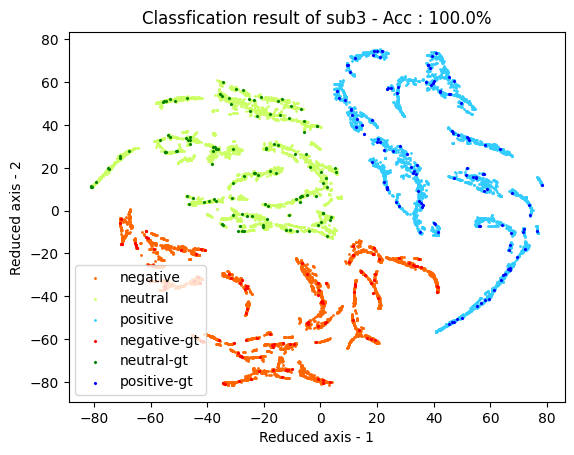

In [123]:
save_scatter(dr_result, label, best_acc.item(),sub_idx, date, args.figure_save_path, visualization_type, identifier)

In [120]:
def save_scatter(result, label, best_acc,sub_idx, date, save_path, dr_type, iden):

    negw = np.where(label.cpu()==0)[0]
    neuw = np.where(label.cpu()==1)[0]
    posw = np.where(label.cpu()==2)[0]
    if dr_type == 0:
        dr_name = 'PCA'
    elif dr_type == 1:
        dr_name = 'TSNE'
    else:
        dr_name = ''
    neg = result[negw]
    neu = result[neuw]
    pos = result[posw]

    gts = np.where(iden.cpu().numpy() ==True)[0]

    neggtw,neugtw,posgtw = [], [], []
    
    for i in gts:
        if i in negw:
            neggtw.append(i)
        elif i in neuw:
            neugtw.append(i)
        elif i in posw:
            posgtw.append(i)

    neggt = result[neggtw,:]
    neugt = result[neugtw,:]
    posgt = result[posgtw,:]
    
    plt.clf()
    c1 = plt.scatter(neg[:,0], neg[:,1], marker = "o", color='#FF6600',s=1.)
    gt1 = plt.scatter(neggt[:,0], neggt[:,1], marker = "x", color='red',s=2.)
    c2 = plt.scatter(neu[:,0], neu[:,1], marker = "o",color ='#CCFF66', s=1.)
    gt2 = plt.scatter(neugt[:,0], neugt[:,1], marker = "x", color='green',s=2.)
    c3 = plt.scatter(pos[:,0], pos[:,1], marker = "o",color ='#33CCFF', s=1.)
    gt3 = plt.scatter(posgt[:,0], posgt[:,1], marker = "x", color='blue',s=2.)
    
    plt.title('Classfication result of '+sub_idx + ' - Acc : '+ str(best_acc) +'%')
    plt.xlabel("Reduced axis - 1")
    plt.ylabel("Reduced axis - 2")
    plt.legend(handles = (c1,c2,c3, gt1,gt2,gt3),labels=("negative","neutral", "positive", "negative-gt", "neutral-gt", "positive-gt"))
    plt.savefig(save_path+'test_result/'+sub_idx+'/'+dr_name+'_classification_result_scatter_'+date+'.png', dpi=300, facecolor = "#eeeeee", bbox_inches = 'tight')
    return